# Capstone project with Spinnaker

### Purpose
> The objective of the project is to find tradable signals across sectors for helping investor to identify ‘sector-rotation patterns’ in financial markets and develop tradable predictions.

### Dataset
> The dataset contains sectoral data for 3 separate types of investments made in the US.
> *   Institutional Mutual Fund 
*   ETF
*   Retail Mutual Fund
>
> The weekly data spans 10 years from 2006 through end-Jan 2017. Not all sectors have data available for all the dates since new investment vehicles are introduced at various points in time.
<br><br>
Data fields:<br>
**ReportDate**: Weekly data aggregated and released every Wednesday	
**AssetClass**: Industry/Sector/Asset Class	
**Flow**: Amount of positive (inflow) or negative (outflow) in Millions of USD 	
**FlowPct**: Flows as percent of assets at beginning of the week 	
**AssetsEnd**: Assets at end of the week in Millions of USD	
**PortfolioChangePct**: Percent change in overall portfolio during the week



# Outline
* Notebook 1 - Data Cleaning + EDA + VAR Model 1
 1. Data cleaning
 2. Explanatory data analysis
 3. VAR Model 1-1: Within one market - ETF
 4. VAR Model 1-2: Within one market - Institutional MF

* Notebook 2 - VAR Model 2
 6. VAR Model 2-1: Cross-market
 7. VAR Model 2-2: Cross-market, smooth method applied

* Notebook 3 - VAR Model 3
 8. VAR Model 3: Cross-market, smooth method applied and market indices added


In [1]:
! pip install -U statsmodels

     |████████████████████████████████| 9.5MB 8.1MB/s 
  Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [2]:
# imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn import metrics 

# color maps
from matplotlib import cm

# time series
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.ar_model import AutoReg
import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from statsmodels.tools.eval_measures import rmse, aic
from scipy.stats import chi2_contingency
from scipy.spatial import distance

# chi-square test
import scipy
from scipy.stats import pearsonr

# VAR model 2-1: Cross-market
%Portfolio_etf(t) = a + b1* %Portfolio_etf(t-1) + b2* %Flow_etf(t-1) + b3* %Portfolio_inst(t-1) + b4* %Flow_inst(t-1)

## Preprocessing and handling outliers

We combine the three orignial datasets into one named `combine_class` by merging their `ReportDate` and `AssetClass` columns.

In [65]:
url_combine_class = 'https://raw.githubusercontent.com/huahuang95/Capstone-Project/main/Datasets/combine_class.csv?token=ARFA2GNOIUDWUXM4FLDXKU3A6X222'
combine_class = pd.read_csv(url_combine_class)
combine_class.head()

,date_class,AssetClass,ReportDate,AssetsEnd_i,FlowPCT_i,PortfolioChangePct_i,AssetsEnd_e,FlowPCT_e,PortfolioChangePct_e,AssetsEnd_r,FlowPCT_r,PortfolioChangePct_r
0,2/1/2017 12:00:00 AMCommodities/Materials-Nort...,Commodities/Materials-North America-USA-North ...,2017-02-01,8787.631717,4.4676,-1.1853,8679.056347,4.5064,-1.1938,344.521230,8.0046,-0.6207
1,2/1/2017 12:00:00 AMConsumer Goods-North Ameri...,Consumer Goods-North America-USA-North America...,2017-02-01,28973.613065,1.1479,-1.1231,28973.613065,1.1479,-1.1231,329.044261,-1.1736,-1.0916
2,2/1/2017 12:00:00 AMEnergy-North America-USA-N...,Energy-North America-USA-North America-Equity,2017-02-01,62136.008339,0.3460,-1.6441,48446.700077,0.3782,-1.8855,27246.540015,0.2713,-0.2297
3,2/1/2017 12:00:00 AMFinancials-North America-U...,Financials-North America-USA-North America-Equity,2017-02-01,68011.826212,1.4776,-0.8896,64378.816729,1.5139,-0.9202,7463.581982,0.2027,-0.7166
4,2/1/2017 12:00:00 AMHealth Care/Biotech-North ...,Health Care/Biotech-North America-USA-North Am...,2017-02-01,40317.775601,1.0228,2.3099,36846.852743,1.1532,2.3119,12575.155816,-0.6587,2.2876


### Preprocessing

In [66]:
# define a function for preprocessing combine_new dataset
def preprocessing(df):
  # extract columns
  df = df[["AssetClass","ReportDate", "FlowPCT_i","PortfolioChangePct_i", "FlowPCT_e","PortfolioChangePct_e"]]
  df.rename(columns={"FlowPCT_i": "FlowPct_i", "FlowPCT_e": "FlowPct_e"}, inplace=True)
  
  # trim AssetClass names
  df['AssetClass'] = df['AssetClass'].str.replace('-North America-USA-North America-Equity', '')

  # convert ReportDate to datetime 
  df['ReportDate'] = pd.to_datetime(df["ReportDate"])
  
  # extract year
  df['year'] = df['ReportDate'].dt.year

  # set ReportDate as index
  df.sort_values("ReportDate", inplace=True)
  df.set_index('ReportDate', inplace=True)
  return df


In [67]:
combine_class = preprocessing(combine_class)
grouped = combine_class.groupby(combine_class['AssetClass'])

com1 = grouped.get_group('Commodities/Materials')
con1 = grouped.get_group('Consumer Goods')
ene1 = grouped.get_group('Energy')
fin1 = grouped.get_group('Financials')
hea1 = grouped.get_group('Health Care/Biotech')
ind1 = grouped.get_group('Industrials')
lcb1 = grouped.get_group('Large Cap Blend')
lcg1 = grouped.get_group('Large Cap Growth')
lcv1 = grouped.get_group('Large Cap Value')
mcb1 = grouped.get_group('Mid Cap Blend')
mcg1 = grouped.get_group('Mid Cap Growth')
mcv1 = grouped.get_group('Mid Cap Value')
rea1 = grouped.get_group('Real Estate')
scb1 = grouped.get_group('Small Cap Blend')
scg1 = grouped.get_group('Small Cap Growth')
scv1 = grouped.get_group('Small Cap Value')
tec1 = grouped.get_group('Technology')
tel1 = grouped.get_group('Telecom')
uti1 = grouped.get_group('Utilities')

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning

### Winzorization

We use winsorizing method to handle outliers by replacing them with the 1st and 99th percentile of each variable (FlowPct and PortfolioChangePct) in Inst and ETF datasets. 

Since we only care about the relationship of trade signal between Inst and ETF market in this period, and the percentiles of variables are quite different year by year so we handle outliers in years.

In [68]:
# winsorizing: replace outliers with the 1st and 99th percentile by year
def clipped(df):
  # FlowPct_i
  # loop over 2006 to 2017
  for i in range(2006, 2018):
    temp = df[df['year']==i]['FlowPct_i']
    temp.clip(lower=temp.quantile(0.01), upper=temp.quantile(0.99), inplace=True)
    if i == 2006:
      s = pd.Series([], name='FlowPct_i') 
      append = pd.concat([s, temp])
    else:
      append = pd.concat([append, temp]) 
  df1 = pd.DataFrame(append)
  
  # replace the original column with the winsorized one
  df.drop(columns='FlowPct_i', inplace=True)
  df = pd.concat([df, df1], axis=1)


  # repeat above steps
  # PortfolioChangePct_i
  for i in range(2006, 2018):
    temp = df[df['year']==i]['PortfolioChangePct_i']
    temp.clip(lower=temp.quantile(0.01), upper=temp.quantile(0.99), inplace=True)
    if i == 2006:
      s = pd.Series([], name='PortfolioChangePct_i') 
      append = pd.concat([s, temp])
    else:
      append = pd.concat([append, temp])
  
  df1 = pd.DataFrame(append)
  df.drop(columns='PortfolioChangePct_i', inplace=True)
  df = pd.concat([df, df1], axis=1)

  # FlowPct_e
  for i in range(2006, 2018):
    temp = df[df['year']==i]['FlowPct_e']
    temp.clip(lower=temp.quantile(0.01), upper=temp.quantile(0.99), inplace=True)
    if i == 2006:
      s = pd.Series([], name='FlowPct_e') 
      append = pd.concat([s, temp])
    else:
      append = pd.concat([append, temp])
  
  df1 = pd.DataFrame(append)
  df.drop(columns='FlowPct_e', inplace=True)
  df = pd.concat([df, df1], axis=1)

  # PortfolioChangePct_e
  for i in range(2006, 2018):
    temp = df[df['year']==i]['PortfolioChangePct_e']
    temp.clip(lower=temp.quantile(0.01), upper=temp.quantile(0.99), inplace=True)
    if i == 2006:
      s = pd.Series([], name='PortfolioChangePct_e') 
      append = pd.concat([s, temp])
    else:
      append = pd.concat([append, temp])
  
  df1 = pd.DataFrame(append)
  df.drop(columns='PortfolioChangePct_e', inplace=True)
  df = pd.concat([df, df1], axis=1)

  return df

In [69]:
# save as dataframe with original names
com = clipped(com1)
con = clipped(con1)
ene = clipped(ene1)
fin = clipped(fin1)
hea = clipped(hea1)
ind = clipped(ind1)
lcb = clipped(lcb1)
lcg = clipped(lcg1)
lcv = clipped(lcv1)
mcb = clipped(mcb1)
mcg = clipped(mcg1)
mcv = clipped(mcv1)
rea = clipped(rea1)
scb = clipped(scb1)
scg = clipped(scg1)
scv = clipped(scv1)
tec = clipped(tec1)
tel = clipped(tel1)
uti = clipped(uti1)

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:7358: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._clip_with_scalar(lower, upper, inplace=inplace)
/usr/local/lib/py

#### Comparison between before and after winsorizing

After handling the outliers, we can take energy data in ETF as an example to show the plots of comparison of FlowPct and PortfolioChangePct before and after handling outliers.

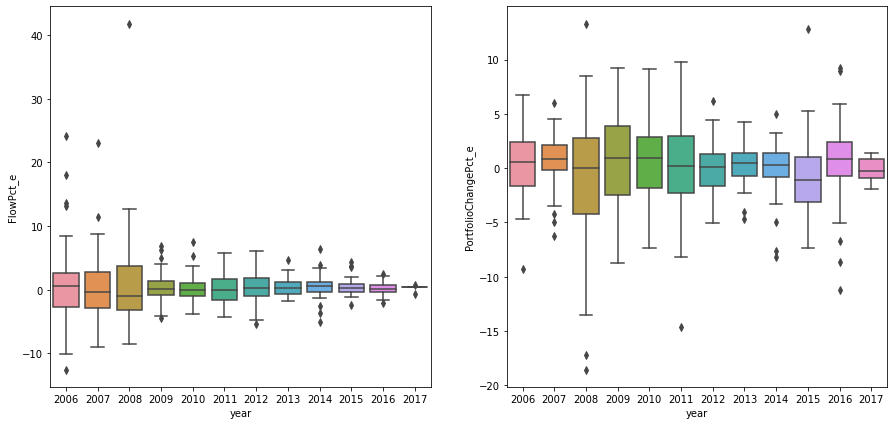

In [70]:
# The original boxplot of FlowPCT and PortfolioChangePct in commodities data 
fig, axes = plt.subplots(1, 2, figsize=(15,7))
sns.boxplot(x='year', y='FlowPct_e', data=ene1, ax=axes[0])
sns.boxplot(x='year', y='PortfolioChangePct_e', data=ene1, ax=axes[1])

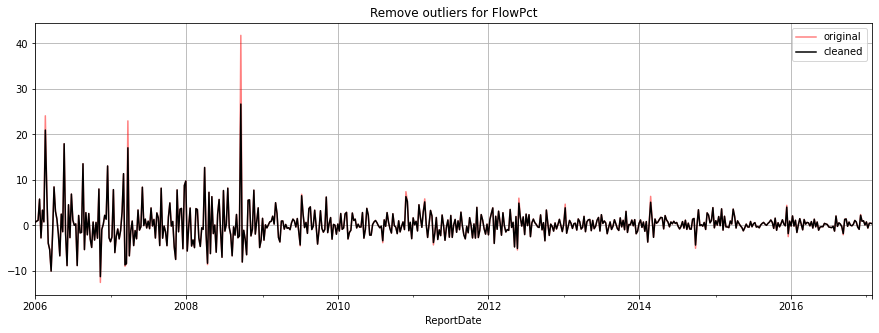

In [71]:
# comparison of FlowPct before and after handling outliers
ene_drop = ene['FlowPct_e']
ene1_fp = ene1['FlowPct_e']
ax = ene1_fp.plot(figsize=(15,5), color="red", alpha=0.5,
         title="Remove outliers for FlowPct", label="original", legend=True)
ene_drop.plot(ax=ax, grid=True, color="black", label="cleaned", legend=True)
plt.show()

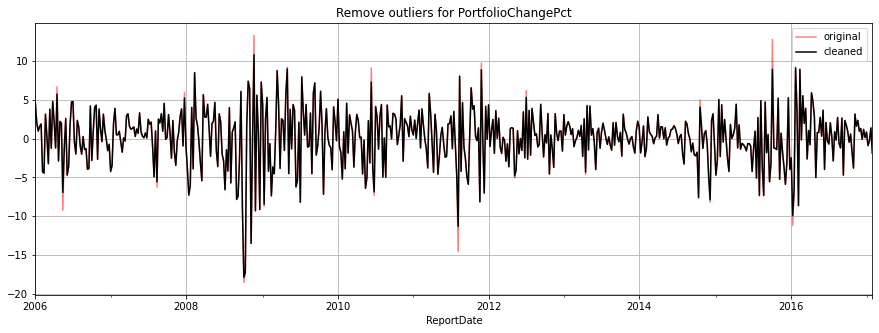

In [72]:
# comparison of PortfolioChangePct before and after handling outliers
ene_drop = ene['PortfolioChangePct_e']
ene1_pc = ene1['PortfolioChangePct_e']
ax = ene1_pc.plot(figsize=(15,5), color="red", alpha=0.5,
         title="Remove outliers for PortfolioChangePct", label="original", legend=True)
ene_drop.plot(ax=ax, grid=True, color="black", label="cleaned", legend=True)
plt.show()

From the above plots we notice that the outliers which exceed 1st or 99th percentile in each year have been replaced, but the number of outliers detected is not large. Therefore, then we use moving average method to smooth the data.

In [73]:
# drop the columns that we will not need in the following steps of model construction
com.drop(['AssetClass','year'],axis=1,inplace=True)
con.drop(['AssetClass','year'],axis=1,inplace=True)
ene.drop(['AssetClass','year'],axis=1,inplace=True)
fin.drop(['AssetClass','year'],axis=1,inplace=True)
hea.drop(['AssetClass','year'],axis=1,inplace=True)
ind.drop(['AssetClass','year'],axis=1,inplace=True)
lcb.drop(['AssetClass','year'],axis=1,inplace=True)
lcg.drop(['AssetClass','year'],axis=1,inplace=True)
lcv.drop(['AssetClass','year'],axis=1,inplace=True)
mcb.drop(['AssetClass','year'],axis=1,inplace=True)
mcg.drop(['AssetClass','year'],axis=1,inplace=True)
mcv.drop(['AssetClass','year'],axis=1,inplace=True)
rea.drop(['AssetClass','year'],axis=1,inplace=True)
scb.drop(['AssetClass','year'],axis=1,inplace=True)
scg.drop(['AssetClass','year'],axis=1,inplace=True)
scv.drop(['AssetClass','year'],axis=1,inplace=True)
tec.drop(['AssetClass','year'],axis=1,inplace=True)
tel.drop(['AssetClass','year'],axis=1,inplace=True)
uti.drop(['AssetClass','year'],axis=1,inplace=True)

## Functions for VAR Model

#### grangers_causation_matrix()

Granger’s causality tests the null hypothesis that the coefficients of past values in the regression equation is zero. We use Granger’s causality tests to test this relationship before building the model.

The null hypothesis is that the past values of time series (X) do not cause the other series (Y). So, if the p-value obtained from the test is less than the significance level of 0.05, then, we can reject the null hypothesis.

In [74]:
# Testing Causation using Granger’s Causality Test
from statsmodels.tsa.stattools import grangercausalitytests
maxlag=12
test = 'ssr_chi2test'
def grangers_causation_matrix(data, variables, test='ssr_chi2test', verbose=False):    
    """Check Granger Causality of all possible combinations of the Time series.
    The rows are the response variable, columns are predictors. The values in the table 
    are the P-Values. P-Values lesser than the significance level (0.05), implies 
    the Null Hypothesis that the coefficients of the corresponding past values is 
    zero, that is, the X does not cause Y can be rejected.

    data      : pandas dataframe containing the time series variables
    variables : list containing names of the time series variables.
    """
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
      for r in df.index:
        test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
        p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
        if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
        min_p_value = np.min(p_values)
        df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df


#### adf_test()

Since the VAR model requires the time series we want to forecast to be stationary, it is necessary to check all the time series in the data for stationarity.

In [75]:
# Use ADF test testing stationarity
from statsmodels.tsa.stattools import adfuller, kpss

# ADF Test
def adf_test(df):
  adf1 = adfuller(df['FlowPct_i'], 12) # maxlag=12: maximum lag which is included in test
  print("Statistics analysis of Inst MF FlowPct\n")
  print("Statistic Test:", adf1[0])
  print("p-value:", adf1[1])

  # if p_value <= 0.05, we can reject null hypothesis and indicate that time series is stationary
  p_value = adf1[1]
  if p_value <= 0.05:
    print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
    print(f" => Series is Stationary.\n")
  else:
    print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
    print(f" => Series is Non-Stationary.\n")

  # repeat above steps
  adf2 = adfuller(df['PortfolioChangePct_i'], 12)
  print('----------------------------------------')
  print("Statistics analysis of Inst MF PortfolioChangePct\n")
  print("Statistic Test:", adf2[0])
  print("p-value:", adf2[1])
  p_value = adf2[1]
  if p_value <= 0.05:
    print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
    print(f" => Series is Stationary.\n")
  else:
    print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
    print(f" => Series is Non-Stationary.\n")

  adf3 = adfuller(df['FlowPct_e'], 12)
  print('========================================')
  print("Statistics analysis of ETF FlowPct\n")
  print("Statistic Test:", adf3[0])
  print("p-value:", adf3[1])
  p_value = adf3[1]
  if p_value <= 0.05:
    print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
    print(f" => Series is Stationary.\n")
  else:
    print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
    print(f" => Series is Non-Stationary.\n")

  adf4 = adfuller(df['PortfolioChangePct_e'], 12)
  print('----------------------------------------')
  print("Statistics analysis of ETF PortfolioChangePct\n")
  print("Statistic Test:", adf4[0])
  print("p-value:", adf4[1])
  p_value = adf4[1]
  if p_value <= 0.05:
    print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
    print(f" => Series is Stationary.")
  else:
    print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
    print(f" => Series is Non-Stationary.")

#### split()

Split dataset to training and test sets(last 10 data points).

In [76]:
# carry-out the train-test split of the data and keep the last 10-weeks as test data.
def split(df, observations=10):
  global train
  global test
  train = df.iloc[:-observations,:]
  test = df.iloc[-observations:,:]
  # return train, test

#### forecasting()

In [77]:
def forecasting(df):
  global forecast
  forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10),
                          index = test.index, 
                          columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast',
                                    'PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

#### forecasting_new()

In [78]:
def get_df_name(df):
    name =[x for x in globals() if globals()[x] is df][0]
    return name

def forecasting_new(df):
  laged_values = train.values[-10:]
  df_name = get_df_name(df)
  sp500 = ['hea', 'lcb', 'lcg', 'lcv']
  dow = ['com', 'ene','ind', 'tel', 'uti']
  nasdaq = ['tec']
  russell = ['mcb', 'mcg', 'mcv', 'scb', 'scg', 'scv']

  global forecast
  if df_name in sp500:
    forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10),
                            index = test.index, 
                            columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast',
                                      'PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast', 
                                      'ClosePct_SP500'])
  elif df_name in dow:
    forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10),
                            index = test.index, 
                            columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast',
                                      'PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast', 
                                      'ClosePct_DOW'])
  elif df_name in nasdaq:
    forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10),
                            index = test.index, 
                            columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast',
                                      'PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast', 
                                      'ClosePct_Nasdaq'])
  elif df_name in russell:
    forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10),
                            index = test.index, 
                            columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast',
                                      'PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast', 
                                      'ClosePct_Russell'])
  # con, fin, rea add both S&P500 & Dow Jones
  else:
    forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), 
                            index = test.index, 
                            columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast',
                                      'PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast', 
                                      'ClosePct_SP500', 'ClosePct_Dow'])

#### accuracy()


*   Evaluate the MSE of forecasts.
*   Evaluate the directional model accuracy.



In [79]:
# evaluate the forecasts
from statsmodels.tsa.stattools import acf
def forecast_accuracy(forecast, actual):
  rmse = np.mean((forecast - actual)**2)**.5  # RMSE
  corr = np.corrcoef(forecast, actual)[0,1]   # corr
  mins = np.amin(np.hstack([forecast[:,None], 
                            actual[:,None]]), axis=1)
  maxs = np.amax(np.hstack([forecast[:,None], 
                            actual[:,None]]), axis=1)
  minmax = 1 - np.mean(mins/maxs)             # minmax
  return({'rmse':rmse, 'corr':corr})

def print_forecast_accuracy(test):
  print('Forecast Accuracy of: FlowPct_i:')
  accuracy_prod = forecast_accuracy(test['FlowPct_i_forecast'], test['FlowPct_i'])
  for k, v in accuracy_prod.items():
    print(k, ': ', round(v,4))

  print('\nForecast Accuracy of: PortfolioPct_i')
  accuracy_prod = forecast_accuracy(test['PortfolioChangePct_i_forecast'], test['PortfolioChangePct_i'])
  for k, v in accuracy_prod.items():
    print(k, ': ', round(v,4))

  print('\nForecast Accuracy of: FlowPct_e:')
  accuracy_prod = forecast_accuracy(test['FlowPct_e_forecast'], test['FlowPct_e'])
  for k, v in accuracy_prod.items():
    print(k, ': ', round(v,4))

  print('\nForecast Accuracy of: PortfolioPct_e')
  accuracy_prod = forecast_accuracy(test['PortfolioChangePct_e_forecast'], test['PortfolioChangePct_e'])
  for k, v in accuracy_prod.items():
    print(k, ': ', round(v,4))


In [80]:
# evaluate the direction of forecasts
from sklearn.metrics import accuracy_score
def direc_accuracy(direc):
  print(f"The accuracy score for FlowPct_i is", accuracy_score(direc["F_i"], direc["F_i_forecast"]))
  print(f"The accuracy score for PortfolioChangePct_i is", accuracy_score(direc["P_i"], direc["P_i_forecast"]))
  print(f"The accuracy score for FlowPct_e is", accuracy_score(direc["F_e"], direc["F_e_forecast"]))
  print(f"The accuracy score for PortfolioChangePct_e is", accuracy_score(direc["P_e"], direc["P_e_forecast"]))

#### change_binary()
To better understanding the directional patterns of the forecasts, we change actual values to binary number to detect direction.

In [81]:
# if FlowPct_i(t) is 0.1 lower than FlowPct_i(t-1): convert value to -1
# elif FlowPct_i(t) is 0.1 higher than FlowPct_i(t-1): convert value to 1
# else: 0

def change_binary(direc, test_len=9, threshold=0.1):
  for i in range(test_len):
    if direc["FlowPct_i"][i+1] < (direc["FlowPct_i"][i]-threshold):
      direc["F_i"][i+1] = -1
    elif direc["FlowPct_i"][i+1] > (direc["FlowPct_i"][i]+threshold):
      direc["F_i"][i+1] = 1
    else:
      direc["F_i"][i+1] = 0

  for i in range(test_len):
    if direc["PortfolioChangePct_i"][i+1] < (direc["PortfolioChangePct_i"][i]-threshold):
      direc["P_i"][i+1] = -1
    elif direc["PortfolioChangePct_i"][i+1] > (direc["PortfolioChangePct_i"][i]+threshold):
      direc["P_i"][i+1] = 1
    else:
      direc["P_i"][i+1] = 0

  for i in range(test_len):
    if direc["FlowPct_e"][i+1] < (direc["FlowPct_e"][i]-threshold):
      direc["F_e"][i+1] = -1
    elif direc["FlowPct_e"][i+1] > (direc["FlowPct_e"][i]+threshold):
      direc["F_e"][i+1] = 1
    else:
      direc["F_e"][i+1] = 0

  for i in range(test_len):
    if direc["PortfolioChangePct_e"][i+1] < (direc["PortfolioChangePct_e"][i]-threshold):
      direc["P_e"][i+1] = -1
    elif direc["PortfolioChangePct_e"][i+1] > (direc["PortfolioChangePct_e"][i]+threshold):
      direc["P_e"][i+1] = 1
    else:
      direc["P_e"][i+1] = 0 

  for i in range(test_len):
    if direc["FlowPct_i_forecast"][i+1] < (direc["FlowPct_i_forecast"][i]-threshold):
      direc["F_i_forecast"][i+1] = -1
    elif direc["FlowPct_i_forecast"][i+1] > (direc["FlowPct_i_forecast"][i]+threshold):
      direc["F_i_forecast"][i+1] = 1
    else:
      direc["F_i_forecast"][i+1] = 0

  for i in range(test_len):
    if direc["PortfolioChangePct_i_forecast"][i+1] < (direc["PortfolioChangePct_i_forecast"][i]-threshold):
      direc["P_i_forecast"][i+1] = -1
    elif direc["PortfolioChangePct_i_forecast"][i+1] > (direc["PortfolioChangePct_i_forecast"][i]+threshold):
      direc["P_i_forecast"][i+1] = 1
    else:
      direc["P_i_forecast"][i+1] = 0

  for i in range(test_len):
    if direc["FlowPct_e_forecast"][i+1] < (direc["FlowPct_e_forecast"][i]-threshold):
      direc["F_e_forecast"][i+1] = -1
    elif direc["FlowPct_e_forecast"][i+1] > (direc["FlowPct_e_forecast"][i]+threshold):
      direc["F_e_forecast"][i+1] = 1
    else:
      direc["F_e_forecast"][i+1] = 0

  for i in range(test_len):
    if direc["PortfolioChangePct_e_forecast"][i+1] < (direc["PortfolioChangePct_e_forecast"][i]-threshold):
      direc["P_e_forecast"][i+1] = -1
    elif direc["PortfolioChangePct_e_forecast"][i+1] > (direc["PortfolioChangePct_e_forecast"][i]+threshold):
      direc["P_e_forecast"][i+1] = 1
    else:
      direc["P_e_forecast"][i+1] = 0

#### crosstab()

Combine actuals and forecasts into one table.

In [82]:
def crosstab(df):
  table1 = pd.crosstab(df['F_i'], df['F_i_forecast'])
  table2 = pd.crosstab(df['P_i'], df['P_i_forecast'])
  table3 = pd.crosstab(df['F_e'], df['F_e_forecast'])
  table4 = pd.crosstab(df['P_e'], df['P_e_forecast'])
  
  return [table1,table2,table3,table4]

#### chi_sq_test()

Use chi-square test for independence to compare two variables in a contingency table to see if they are related.

In [83]:
def chi_sq_test(table):

    print("Contingency table:")
    print(str(table))
    
    # for i in range(4):
    #   chi_square = scipy.stats.chi2_contingency(table[i])
    #   print("Chi-square value, p-value, expected_counts")
    #   print(chi_square)

    for i in range(4):
      pair = ['FlowPct_i v.s. FlowPct_i_forecast:', 'PortfolioPct_i v.s. PortfolioPct_i_forecast:',
              'FlowPct_e v.s. FlowPct_e_forecast:', 'PortfolioPct_e v.s. PortfolioPct_e_forecast:']
      p_value = scipy.stats.chi2_contingency(table[i])[1]
      print(pair[i])
      print('p-value:', p_value, '\n')

#### hamming_distance()

In [84]:
def hamming_distance(direc):
  print('Hamming distance between actuals and forecasts:\n')
  
  dist_F_i = distance.hamming(direc['F_i'].to_numpy(), direc['F_i_forecast'].to_numpy())
  print('FlowPct_i v.s. FlowPct_i_forecast:', dist_F_i)

  dist_P_i = distance.hamming(direc['P_i'].to_numpy(), direc['P_i_forecast'].to_numpy())
  print('PortfolioPct_i v.s. PortfolioPct_i_forecast:', dist_P_i)
  
  dist_F_e = distance.hamming(direc['F_e'].to_numpy(), direc['F_e_forecast'].to_numpy())
  print('FlowPct_e v.s. FlowPct_e_forecast:', dist_F_e)
  
  dist_P_e = distance.hamming(direc['P_e'].to_numpy(), direc['P_e_forecast'].to_numpy())
  print('PortfolioPct_e v.s. PortfolioPct_e_forecast:', dist_P_e)

## Models for each sector

Run VAR model for 19 sectors.

### com, Commodities

Use sector 'Commodities' as pilot dataset. Model for pilot dataset:

In [85]:
# grangers causation
grangers_causation_matrix(com, variables = com.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0021,0.7145,0.0022
PortfolioChangePct_i_y,0.5048,1.0000,0.5829,0.1469
FlowPct_e_y,0.5729,0.0014,1.0000,0.0014
PortfolioChangePct_e_y,0.5131,0.1372,0.5906,1.0000


In [86]:
# adf
adf_test(com)

Statistics analysis of Inst MF FlowPct

Statistic Test: -15.397385451618693
p-value: 3.249198857632162e-28
 => P-Value = 3.249198857632162e-28. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -6.877046756959877
p-value: 1.4655209006832977e-09
 => P-Value = 1.4655209006832977e-09. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -15.30941321091356
p-value: 4.206379249684779e-28
 => P-Value = 4.206379249684779e-28. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -6.894419979691533
p-value: 1.3301318526816157e-09
 => P-Value = 1.3301318526816157e-09. Rejecting Null Hypothesis.
 => Series is Stationary.


In [87]:
# split data
split(com, 10)

In [88]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [89]:
## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic
##
## If there is any correlation left in the residuals, then, 
## there is some pattern in the time series that is still left to be explained by the model. 
## In that case, the typical course of action is to either increase the order of the model 
## or induce more predictors into the system or look for a different algorithm to model the time series.
##
## The value of this statistic can vary between 0 and 4. The closer it is to the value 2, 
## then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, 
## and the closer it is to 4 implies negative serial correlation.

from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(com.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 1.99
PortfolioChangePct_i : 2.01
FlowPct_e : 1.99
PortfolioChangePct_e : 2.01


In [90]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [91]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,1.858500,0.735000,1.866600,0.737200,0.034070,-1.310529,-1.307081,0.041838
2016-12-07,3.164400,3.141000,3.167400,3.149200,-0.969133,0.324984,0.251661,-0.959030
2016-12-14,2.895500,-1.899100,2.812900,-1.910300,0.511702,0.402170,0.342114,0.507318
2016-12-21,0.432500,-0.336600,0.432900,-0.327200,0.358581,-0.189937,-0.117498,0.355701
2016-12-28,-1.207200,-0.689900,-1.231100,-0.710600,0.049955,1.754168,1.774738,0.057321
2017-01-04,-3.128136,2.024400,-3.156248,2.027800,0.701409,0.041580,0.004345,0.702326
2017-01-11,2.149800,0.657500,2.172900,0.652100,-0.130101,0.282820,0.276840,-0.131127
2017-01-18,-1.141800,0.053900,-1.163000,0.047700,0.450513,0.418571,0.506865,0.453598
2017-01-25,3.137100,3.166800,3.176000,3.189784,0.747805,0.276213,0.277900,0.752372
2017-02-01,4.414380,-1.135732,4.453184,-1.144140,-0.207612,0.627239,0.622710,-0.205441


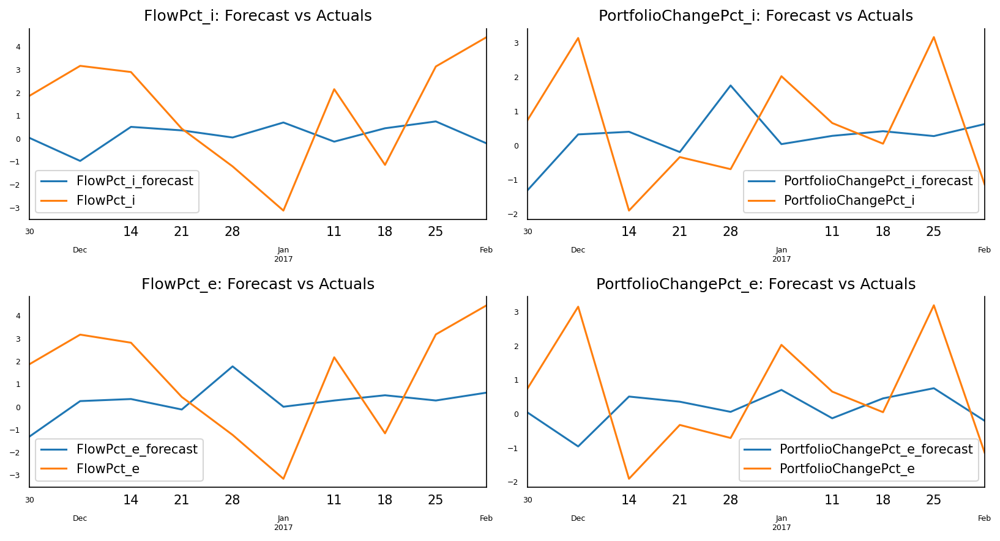

In [92]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    com[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [93]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  2.7777
corr :  -0.4377

Forecast Accuracy of: PortfolioPct_i
rmse :  1.9767
corr :  -0.2454

Forecast Accuracy of: FlowPct_e:
rmse :  2.7104
corr :  -0.1543

Forecast Accuracy of: PortfolioPct_e
rmse :  1.8336
corr :  -0.126


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [94]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,1,1,1,-1,1,1,-1
2016-12-14,-1,-1,-1,-1,1,0,0,1
2016-12-21,-1,1,-1,1,-1,-1,-1,-1
2016-12-28,-1,-1,-1,-1,-1,1,1,-1
2017-01-04,-1,1,-1,1,1,-1,-1,1
2017-01-11,1,-1,1,-1,-1,1,1,-1
2017-01-18,-1,-1,-1,-1,1,1,1,1
2017-01-25,1,1,1,1,1,-1,-1,1
2017-02-01,1,-1,1,-1,-1,1,1,-1


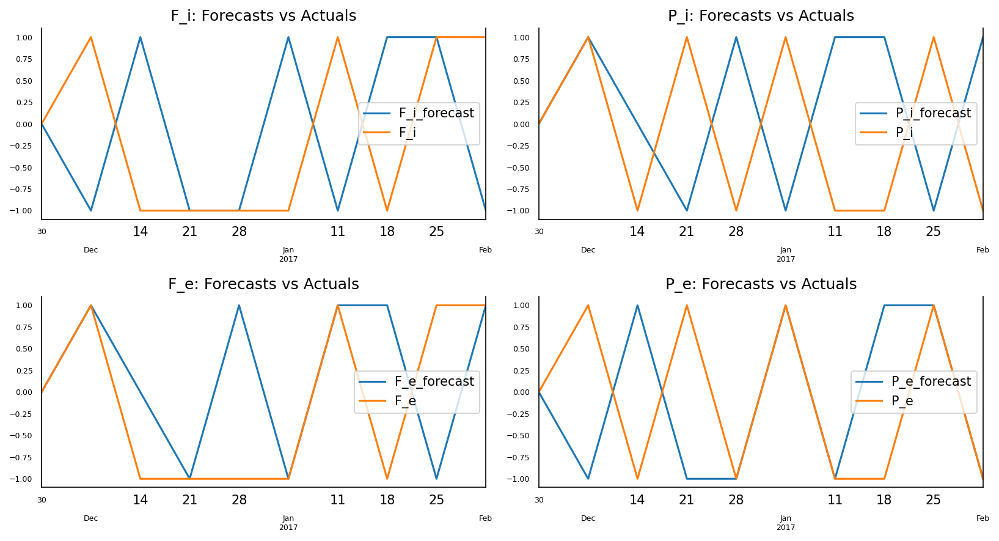

In [95]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [96]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.4
The accuracy score for PortfolioChangePct_i is 0.2
The accuracy score for FlowPct_e is 0.6
The accuracy score for PortfolioChangePct_e is 0.6


In [97]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             2   0   3
 0             0   1   0
 1             3   0   1, P_i_forecast  -1   0   1
P_i                     
-1             0   1   4
 0             0   1   0
 1             3   0   1, F_e_forecast  -1   0   1
F_e                     
-1             2   1   2
 0             0   1   0
 1             1   0   3, P_e_forecast  -1   0   1
P_e                     
-1             3   0   2
 0             0   1   0
 1             2   0   2]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.0241483746647379 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.03420269940871676 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.23107823797582827 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.038776467349851115 



In [98]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.6
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.8
FlowPct_e v.s. FlowPct_e_forecast: 0.4
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.4


### con , Consumer

In [99]:
# grangers causation
grangers_causation_matrix(con, variables = con.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.000,0.0191,1.000,0.0191
PortfolioChangePct_i_y,0.012,1.0000,0.012,1.0000
FlowPct_e_y,1.000,0.0191,1.000,0.0191
PortfolioChangePct_e_y,0.012,1.0000,0.012,1.0000


In [100]:
# adf
adf_test(con)

Statistics analysis of Inst MF FlowPct

Statistic Test: -20.12447107240141
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -25.957095425525235
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -20.12447107240141
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -25.957095425525235
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [101]:
# split data
split(con, 10)

In [102]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [103]:
## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic
##
## If there is any correlation left in the residuals, then, 
## there is some pattern in the time series that is still left to be explained by the model. 
## In that case, the typical course of action is to either increase the order of the model 
## or induce more predictors into the system or look for a different algorithm to model the time series.
##
## The value of this statistic can vary between 0 and 4. The closer it is to the value 2, 
## then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, 
## and the closer it is to 4 implies negative serial correlation.

from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(con.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 1.98
PortfolioChangePct_i : 2.01
FlowPct_e : 1.98
PortfolioChangePct_e : 2.01


In [104]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [105]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

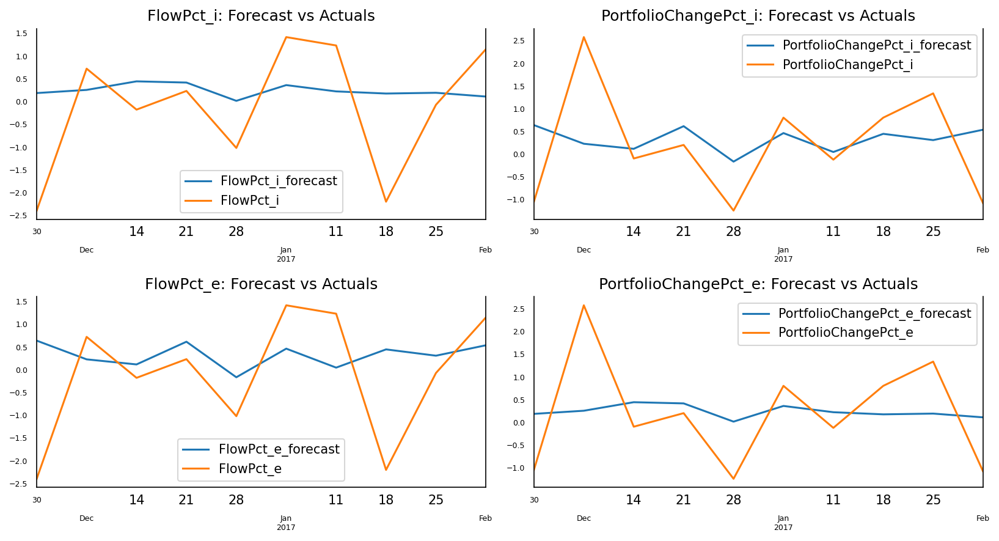

In [106]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    con[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [107]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  1.3151
corr :  0.3092

Forecast Accuracy of: PortfolioPct_i
rmse :  1.1707
corr :  0.036

Forecast Accuracy of: FlowPct_e:
rmse :  1.423
corr :  -0.1188

Forecast Accuracy of: PortfolioPct_e
rmse :  1.1085
corr :  0.354


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [108]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc, test_len=9, threshold=0.1)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,1,1,1,0,-1,-1,0
2016-12-14,-1,-1,-1,-1,1,-1,-1,1
2016-12-21,1,1,1,1,0,1,1,0
2016-12-28,-1,-1,-1,-1,-1,-1,-1,-1
2017-01-04,1,1,1,1,1,1,1,1
2017-01-11,-1,-1,-1,-1,-1,-1,-1,-1
2017-01-18,-1,1,-1,1,0,1,1,0
2017-01-25,1,1,1,1,0,-1,-1,0
2017-02-01,1,-1,1,-1,0,1,1,0


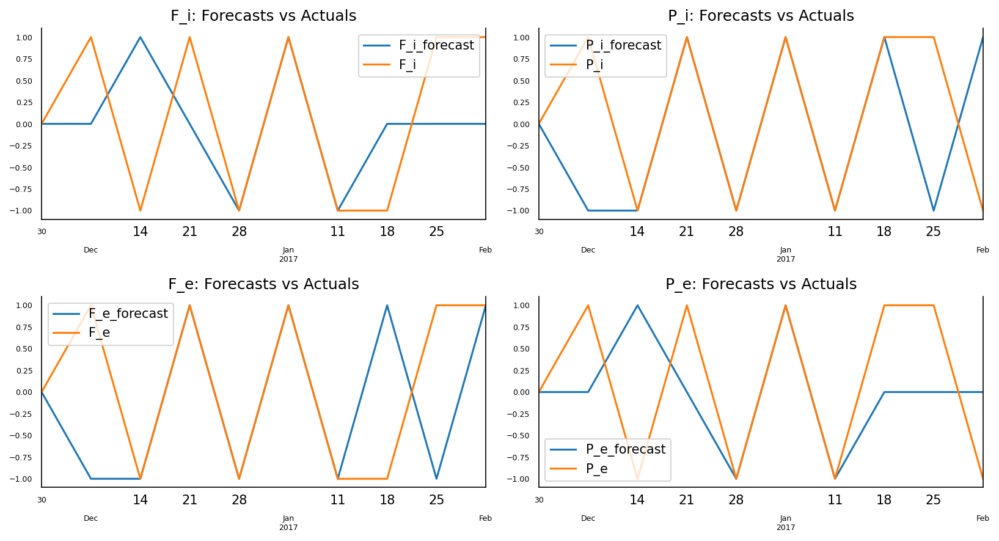

In [109]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [110]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.4
The accuracy score for PortfolioChangePct_i is 0.7
The accuracy score for FlowPct_e is 0.7
The accuracy score for PortfolioChangePct_e is 0.4


In [111]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             2   1   1
 0             0   1   0
 1             0   4   1, P_i_forecast  -1   0   1
P_i                     
-1             3   0   1
 0             0   1   0
 1             2   0   3, F_e_forecast  -1   0   1
F_e                     
-1             3   0   1
 0             0   1   0
 1             2   0   3, P_e_forecast  -1   0   1
P_e                     
-1             2   1   1
 0             0   1   0
 1             0   4   1]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.3232398928813502 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.0241483746647379 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.0241483746647379 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.3232398928813502 



In [112]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.6
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.3
FlowPct_e v.s. FlowPct_e_forecast: 0.3
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.6


### ene, Energy

In [113]:
# grangers causation
grangers_causation_matrix(ene, variables = ene.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0375,0.7083,0.0420
PortfolioChangePct_i_y,0.0007,1.0000,0.0009,0.2365
FlowPct_e_y,0.3863,0.0410,1.0000,0.0462
PortfolioChangePct_e_y,0.0008,0.2204,0.0009,1.0000


In [114]:
# adf
adf_test(ene)

Statistics analysis of Inst MF FlowPct

Statistic Test: -12.232542167688718
p-value: 1.0456392932545991e-22
 => P-Value = 1.0456392932545991e-22. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -7.698476710798238
p-value: 1.359175295043789e-11
 => P-Value = 1.359175295043789e-11. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -12.08466901391832
p-value: 2.19156031526425e-22
 => P-Value = 2.19156031526425e-22. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -7.735055832327203
p-value: 1.0993017964136694e-11
 => P-Value = 1.0993017964136694e-11. Rejecting Null Hypothesis.
 => Series is Stationary.


In [115]:
# split data
split(ene, 10)

In [116]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [117]:
## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic
##
## If there is any correlation left in the residuals, then, 
## there is some pattern in the time series that is still left to be explained by the model. 
## In that case, the typical course of action is to either increase the order of the model 
## or induce more predictors into the system or look for a different algorithm to model the time series.
##
## The value of this statistic can vary between 0 and 4. The closer it is to the value 2, 
## then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, 
## and the closer it is to 4 implies negative serial correlation.

from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(ene.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 1.99
PortfolioChangePct_i : 2.0
FlowPct_e : 1.98
PortfolioChangePct_e : 2.0


In [118]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [119]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

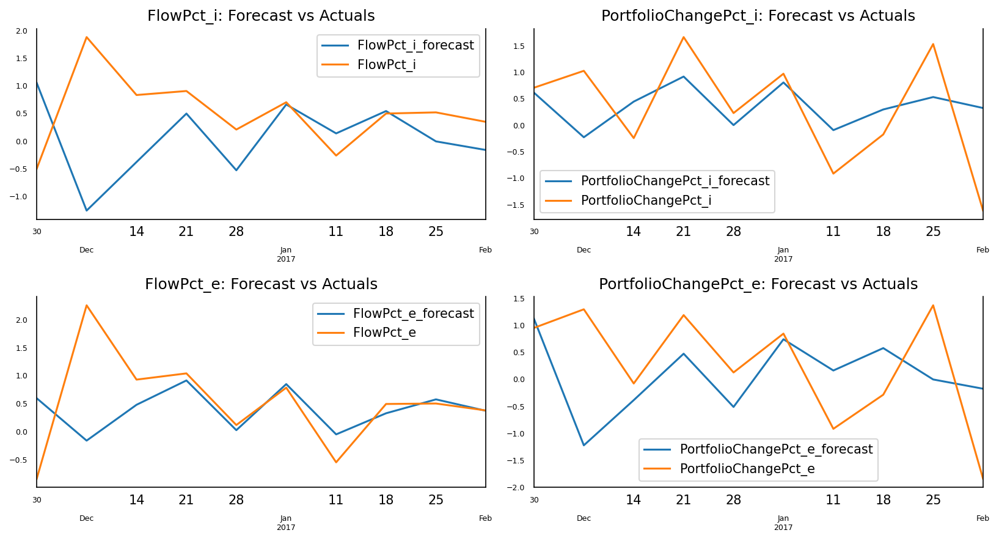

In [120]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    ene[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [121]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  1.2333
corr :  -0.6278

Forecast Accuracy of: PortfolioPct_i
rmse :  0.9135
corr :  0.4338

Forecast Accuracy of: FlowPct_e:
rmse :  0.9165
corr :  -0.0669

Forecast Accuracy of: PortfolioPct_e
rmse :  1.185
corr :  0.0659


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [122]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,1,1,1,-1,-1,-1,-1
2016-12-14,-1,-1,-1,-1,1,1,1,1
2016-12-21,0,1,1,1,1,1,1,1
2016-12-28,-1,-1,-1,-1,-1,-1,-1,-1
2017-01-04,1,1,1,1,1,1,1,1
2017-01-11,-1,-1,-1,-1,-1,-1,-1,-1
2017-01-18,1,1,1,1,1,1,1,1
2017-01-25,0,1,0,1,-1,1,1,-1
2017-02-01,-1,-1,-1,-1,-1,-1,-1,-1


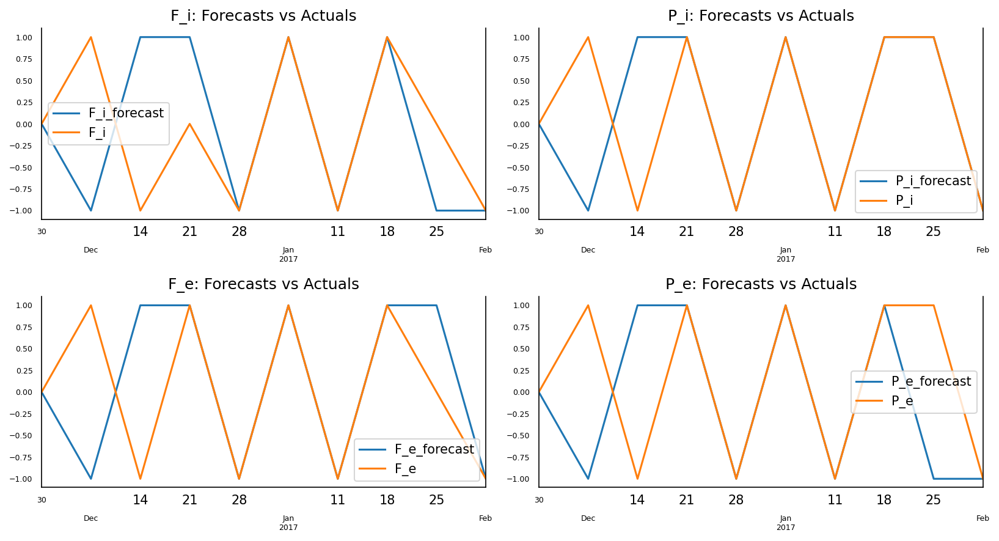

In [123]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [124]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.6
The accuracy score for PortfolioChangePct_i is 0.8
The accuracy score for FlowPct_e is 0.7
The accuracy score for PortfolioChangePct_e is 0.7


In [125]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             3   0   1
 0             1   1   1
 1             1   0   2, P_i_forecast  -1   0   1
P_i                     
-1             3   0   1
 0             0   1   0
 1             1   0   4, F_e_forecast  -1   0   1
F_e                     
-1             3   0   1
 0             0   1   1
 1             1   0   3, P_e_forecast  -1   0   1
P_e                     
-1             3   0   1
 0             0   1   0
 1             2   0   3]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.41167418840964765 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.011154283324970366 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.12325207518064407 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.0241483746647379 



In [126]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.4
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.2
FlowPct_e v.s. FlowPct_e_forecast: 0.3
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.3


### fin, Financials 

In [127]:
# grangers causation
grangers_causation_matrix(fin, variables = fin.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0000,0.5545,0.0000
PortfolioChangePct_i_y,0.2750,1.0000,0.2753,0.2512
FlowPct_e_y,0.5523,0.0000,1.0000,0.0000
PortfolioChangePct_e_y,0.2752,0.2432,0.2754,1.0000


In [128]:
# adf
adf_test(fin)

Statistics analysis of Inst MF FlowPct

Statistic Test: -5.227215465340911
p-value: 7.734244794552842e-06
 => P-Value = 7.734244794552842e-06. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -28.47586625365381
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -5.226619212041433
p-value: 7.7560400682887e-06
 => P-Value = 7.7560400682887e-06. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -28.468034106745584
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [129]:
# split data
split(fin, 10)

In [130]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [131]:
## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic
##
## If there is any correlation left in the residuals, then, 
## there is some pattern in the time series that is still left to be explained by the model. 
## In that case, the typical course of action is to either increase the order of the model 
## or induce more predictors into the system or look for a different algorithm to model the time series.
##
## The value of this statistic can vary between 0 and 4. The closer it is to the value 2, 
## then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, 
## and the closer it is to 4 implies negative serial correlation.

from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(fin.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 1.98
PortfolioChangePct_i : 2.01
FlowPct_e : 1.98
PortfolioChangePct_e : 2.01


In [132]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [133]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

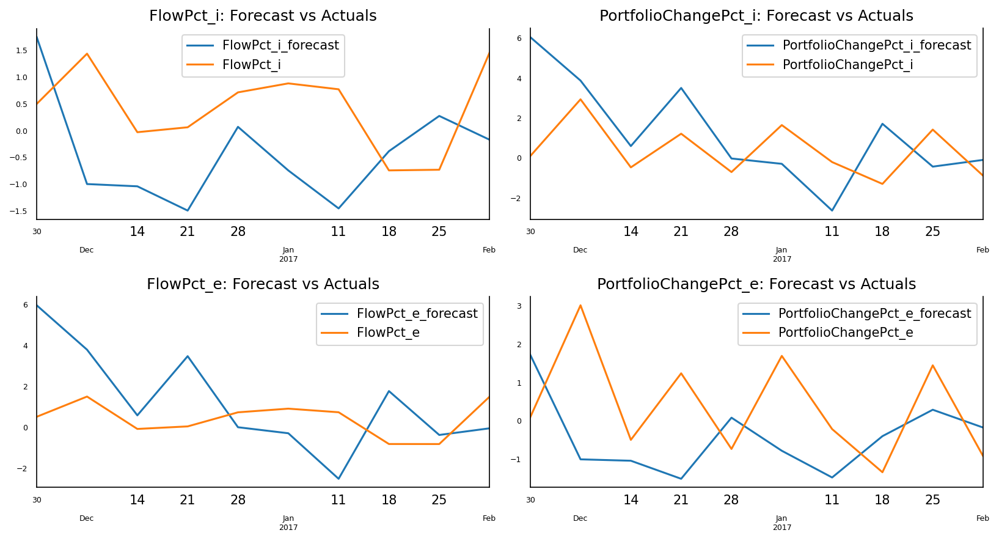

In [134]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    fin[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [135]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  1.5054
corr :  -0.1024

Forecast Accuracy of: PortfolioPct_i
rmse :  2.572
corr :  0.2749

Forecast Accuracy of: FlowPct_e:
rmse :  2.6282
corr :  0.0175

Forecast Accuracy of: PortfolioPct_e
rmse :  1.9447
corr :  -0.2074


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [136]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,1,1,1,-1,-1,-1,-1
2016-12-14,-1,-1,-1,-1,0,-1,-1,0
2016-12-21,0,1,1,1,-1,1,1,-1
2016-12-28,1,-1,1,-1,1,-1,-1,1
2017-01-04,1,1,1,1,-1,-1,-1,-1
2017-01-11,-1,-1,-1,-1,-1,-1,-1,-1
2017-01-18,-1,-1,-1,-1,1,1,1,1
2017-01-25,0,1,0,1,1,-1,-1,1
2017-02-01,1,-1,1,-1,-1,1,1,-1


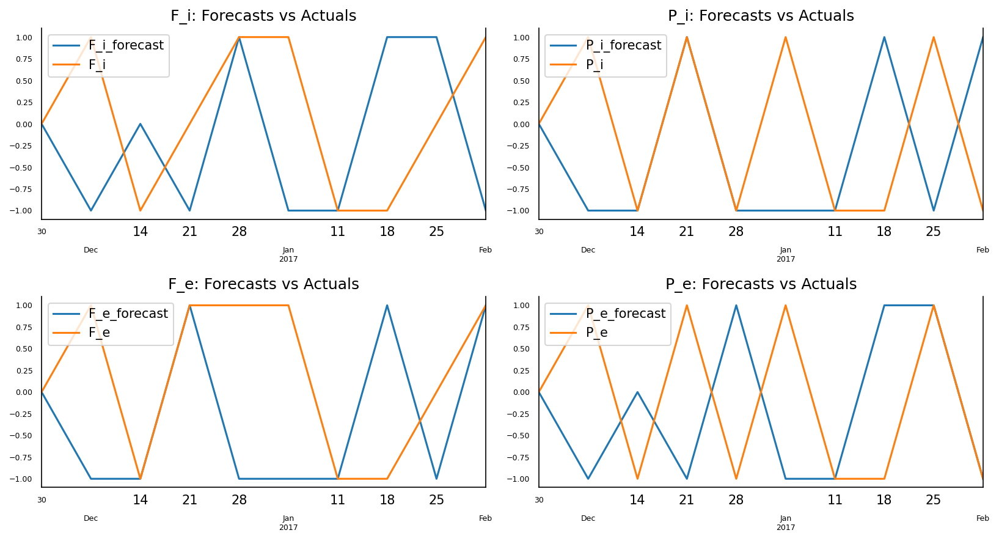

In [137]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [138]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.3
The accuracy score for PortfolioChangePct_i is 0.5
The accuracy score for FlowPct_e is 0.5
The accuracy score for PortfolioChangePct_e is 0.4


In [139]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             1   1   1
 0             1   1   1
 1             3   0   1, P_i_forecast  -1   0   1
P_i                     
-1             3   0   2
 0             0   1   0
 1             3   0   1, F_e_forecast  -1   0   1
F_e                     
-1             2   0   1
 0             1   1   0
 1             3   0   2, P_e_forecast  -1   0   1
P_e                     
-1             2   1   2
 0             0   1   0
 1             3   0   1]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.694962974261134 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.03642058130839155 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.3048299344816386 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.23107823797582827 



In [140]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.7
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.5
FlowPct_e v.s. FlowPct_e_forecast: 0.5
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.6


### hea, Health

In [141]:
# grangers causation
grangers_causation_matrix(hea, variables = hea.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.000,0.0334,0.0000
PortfolioChangePct_i_y,0.0084,1.000,0.0088,0.0959
FlowPct_e_y,0.0360,0.000,1.0000,0.0000
PortfolioChangePct_e_y,0.0095,0.094,0.0100,1.0000


In [142]:
# adf
adf_test(hea)

Statistics analysis of Inst MF FlowPct

Statistic Test: -25.299180697821388
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -24.811062726817212
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -25.57650076943803
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -24.780474791310613
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [143]:
# split data
split(hea, 10)

In [144]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [145]:
## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic
##
## If there is any correlation left in the residuals, then, 
## there is some pattern in the time series that is still left to be explained by the model. 
## In that case, the typical course of action is to either increase the order of the model 
## or induce more predictors into the system or look for a different algorithm to model the time series.
##
## The value of this statistic can vary between 0 and 4. The closer it is to the value 2, 
## then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, 
## and the closer it is to 4 implies negative serial correlation.

from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(hea.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.0
PortfolioChangePct_i : 2.0
FlowPct_e : 2.0
PortfolioChangePct_e : 2.0


In [146]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [147]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

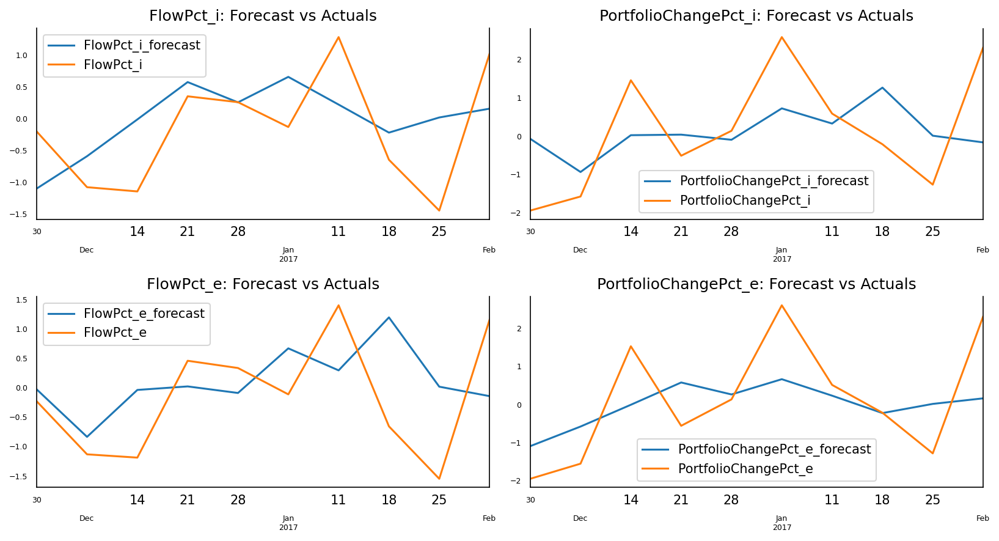

In [148]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    hea[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [149]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.85
corr :  0.3681

Forecast Accuracy of: PortfolioPct_i
rmse :  1.4077
corr :  0.3448

Forecast Accuracy of: FlowPct_e:
rmse :  1.0587
corr :  0.1037

Forecast Accuracy of: PortfolioPct_e
rmse :  1.249
corr :  0.6603


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [150]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,-1,1,-1,1,1,-1,-1,1
2016-12-14,0,1,0,1,1,1,1,1
2016-12-21,1,-1,1,-1,1,0,0,1
2016-12-28,0,1,-1,1,-1,-1,-1,-1
2017-01-04,-1,1,-1,1,1,1,1,1
2017-01-11,1,-1,1,-1,-1,-1,-1,-1
2017-01-18,-1,-1,-1,-1,-1,1,1,-1
2017-01-25,-1,-1,-1,-1,1,-1,-1,1
2017-02-01,1,1,1,1,1,-1,-1,1


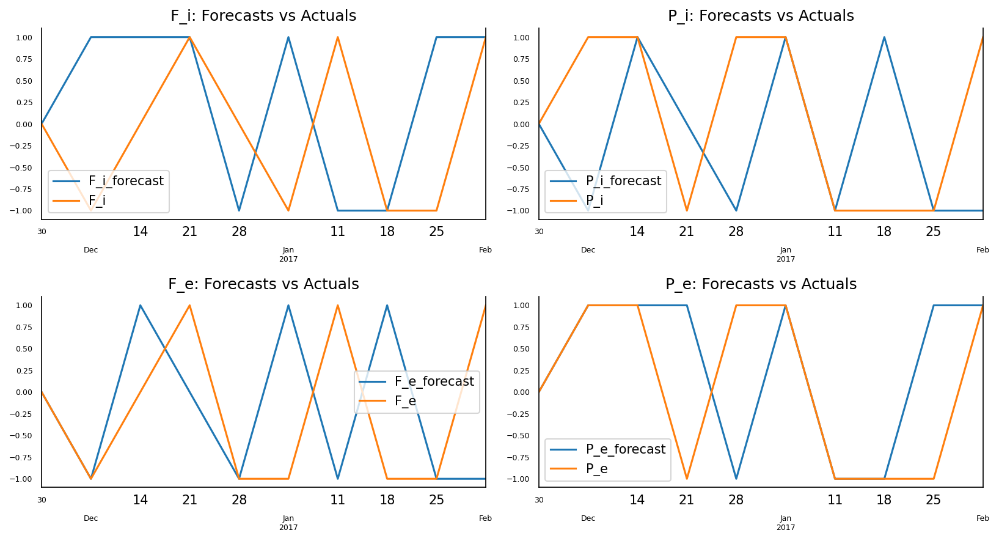

In [151]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [152]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.4
The accuracy score for PortfolioChangePct_i is 0.5
The accuracy score for FlowPct_e is 0.4
The accuracy score for PortfolioChangePct_e is 0.7


In [153]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             1   0   3
 0             1   1   1
 1             1   0   2, P_i_forecast  -1   0   1
P_i                     
-1             2   1   1
 0             0   1   0
 1             3   0   2, F_e_forecast  -1   0   1
F_e                     
-1             3   0   2
 0             0   1   1
 1             2   1   0, P_e_forecast  -1   0   1
P_e                     
-1             2   0   2
 0             0   1   0
 1             1   0   4]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.5718664923800113 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.2532325943503849 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.3120874267404172 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.026564014350016436 



In [154]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.6
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.5
FlowPct_e v.s. FlowPct_e_forecast: 0.6
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.3


### Ind, Industrials

In [155]:
# grangers causation
grangers_causation_matrix(ind, variables = ind.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0786,1.0000,0.0786
PortfolioChangePct_i_y,0.3522,1.0000,0.3522,1.0000
FlowPct_e_y,1.0000,0.0786,1.0000,0.0786
PortfolioChangePct_e_y,0.3522,1.0000,0.3522,1.0000


In [156]:
# adf
adf_test(ind)

Statistics analysis of Inst MF FlowPct

Statistic Test: -15.474453070969055
p-value: 2.6042817355869086e-28
 => P-Value = 2.6042817355869086e-28. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -24.264878550789486
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -15.474453070969055
p-value: 2.6042817355869086e-28
 => P-Value = 2.6042817355869086e-28. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -24.264878550789486
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [157]:
# split data
split(ind, 10)

In [158]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [159]:
## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic
##
## If there is any correlation left in the residuals, then, 
## there is some pattern in the time series that is still left to be explained by the model. 
## In that case, the typical course of action is to either increase the order of the model 
## or induce more predictors into the system or look for a different algorithm to model the time series.
##
## The value of this statistic can vary between 0 and 4. The closer it is to the value 2, 
## then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, 
## and the closer it is to 4 implies negative serial correlation.

from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(ind.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.0
PortfolioChangePct_i : 2.0
FlowPct_e : 2.0
PortfolioChangePct_e : 2.0


In [160]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [161]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

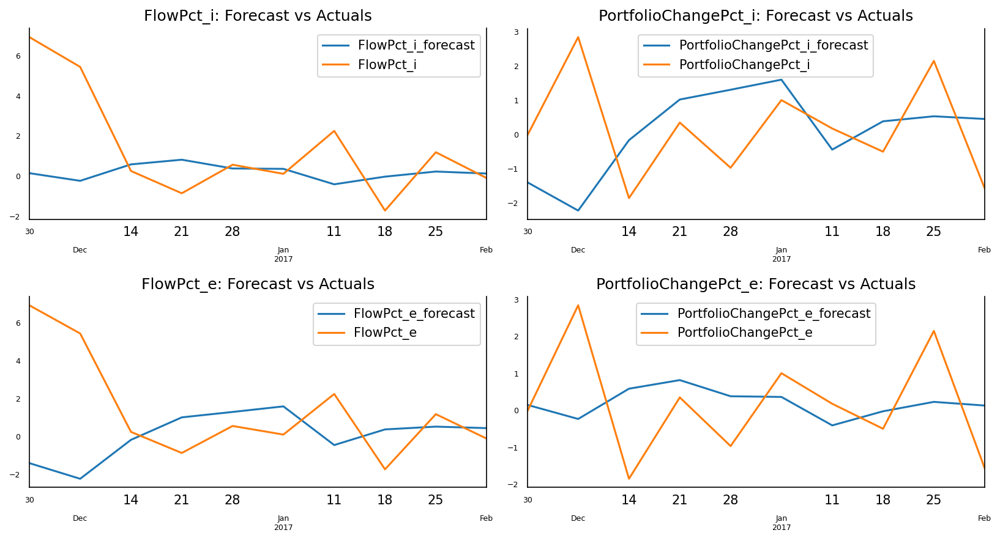

In [162]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    ind[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [163]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  3.0347
corr :  -0.4353

Forecast Accuracy of: PortfolioPct_i
rmse :  2.1002
corr :  -0.3229

Forecast Accuracy of: FlowPct_e:
rmse :  3.8298
corr :  -0.818

Forecast Accuracy of: PortfolioPct_e
rmse :  1.5809
corr :  -0.313


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [164]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,-1,1,-1,1,-1,-1,-1,-1
2016-12-14,-1,-1,-1,-1,1,1,1,1
2016-12-21,-1,1,-1,1,1,1,1,1
2016-12-28,1,-1,1,-1,-1,1,1,-1
2017-01-04,-1,1,-1,1,0,1,1,0
2017-01-11,1,-1,1,-1,-1,-1,-1,-1
2017-01-18,-1,-1,-1,-1,1,1,1,1
2017-01-25,1,1,1,1,1,1,1,1
2017-02-01,-1,-1,-1,-1,0,0,0,0


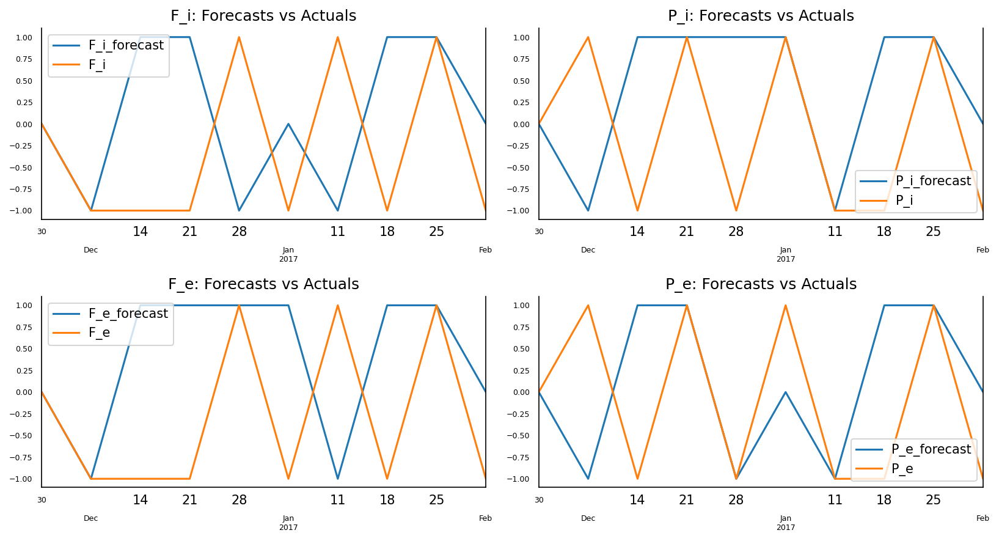

In [165]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [166]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.3
The accuracy score for PortfolioChangePct_i is 0.5
The accuracy score for FlowPct_e is 0.4
The accuracy score for PortfolioChangePct_e is 0.5


In [167]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             1   2   3
 0             0   1   0
 1             2   0   1, P_i_forecast  -1   0   1
P_i                     
-1             1   1   3
 0             0   1   0
 1             1   0   3, F_e_forecast  -1   0   1
F_e                     
-1             1   1   4
 0             0   1   0
 1             1   0   2, P_e_forecast  -1   0   1
P_e                     
-1             2   1   2
 0             0   1   0
 1             1   1   2]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.2733411914589112 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.2872974951836456 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.2872974951836456 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.5860925970361512 



In [168]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.7
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.5
FlowPct_e v.s. FlowPct_e_forecast: 0.6
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.5


### lcb, Large Capital Blend

In [169]:
# grangers causation
grangers_causation_matrix(lcb, variables = lcb.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0648,0.0047,0.0750
PortfolioChangePct_i_y,0.0016,1.0000,0.0021,0.0549
FlowPct_e_y,0.0302,0.0808,1.0000,0.0922
PortfolioChangePct_e_y,0.0012,0.0613,0.0016,1.0000


In [170]:
# adf
adf_test(lcb)

Statistics analysis of Inst MF FlowPct

Statistic Test: -5.879995525116096
p-value: 3.0945058103731153e-07
 => P-Value = 3.0945058103731153e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -25.29221297253315
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -5.999395471749819
p-value: 1.6713574810561554e-07
 => P-Value = 1.6713574810561554e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -25.474949150619555
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [171]:
# split data
split(lcb, 10)

In [172]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [173]:

from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(lcb.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.01
PortfolioChangePct_i : 2.01
FlowPct_e : 2.01
PortfolioChangePct_e : 2.01


In [174]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [175]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

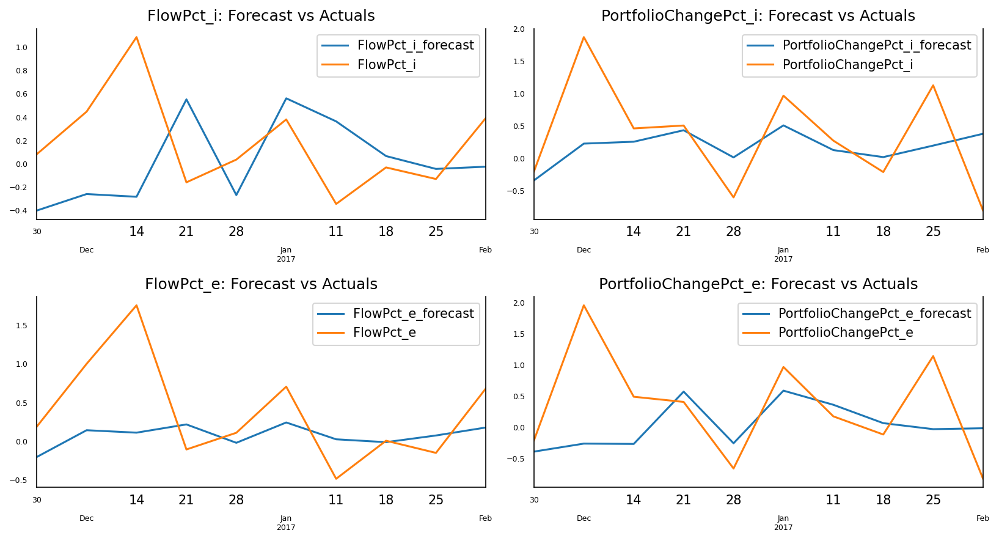

In [176]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    lcb[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [177]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.6259
corr :  -0.3921

Forecast Accuracy of: PortfolioPct_i
rmse :  0.7552
corr :  0.3505

Forecast Accuracy of: FlowPct_e:
rmse :  0.6725
corr :  0.3277

Forecast Accuracy of: PortfolioPct_e
rmse :  0.8931
corr :  0.117


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [178]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,1,1,1,1,1,1,1
2016-12-14,1,-1,1,-1,0,0,0,0
2016-12-21,-1,0,-1,0,1,1,1,1
2016-12-28,1,-1,1,-1,-1,-1,-1,-1
2017-01-04,1,1,1,1,1,1,1,1
2017-01-11,-1,-1,-1,-1,-1,-1,-1,-1
2017-01-18,1,-1,1,-1,-1,-1,0,-1
2017-01-25,0,1,-1,1,-1,1,0,0
2017-02-01,1,-1,1,-1,0,1,1,0


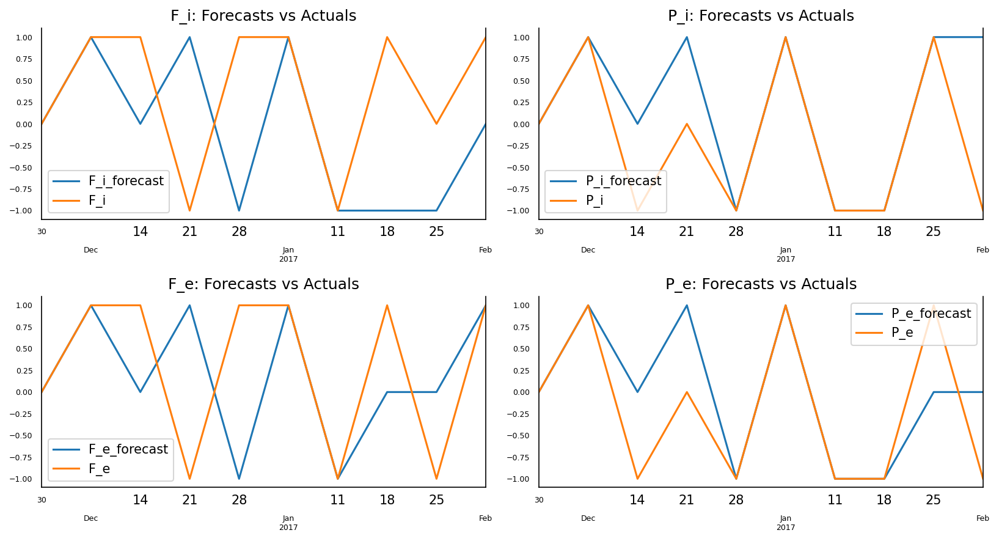

In [179]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [180]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.4
The accuracy score for PortfolioChangePct_i is 0.7
The accuracy score for FlowPct_e is 0.5
The accuracy score for PortfolioChangePct_e is 0.6


In [181]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             1   0   1
 0             1   1   0
 1             2   2   2, P_i_forecast  -1   0   1
P_i                     
-1             3   1   1
 0             0   1   1
 1             0   0   3, F_e_forecast  -1   0   1
F_e                     
-1             1   1   1
 0             0   1   0
 1             1   2   3, P_e_forecast  -1   0   1
P_e                     
-1             3   2   0
 0             0   1   1
 1             0   1   2]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.7459764231480277 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.1412680818824023 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.7204349163118164 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.1850900186598593 



In [182]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.6
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.3
FlowPct_e v.s. FlowPct_e_forecast: 0.5
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.4


### lcg, Large Capital Growth

In [183]:
# grangers causation
grangers_causation_matrix(lcg, variables = lcg.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0000,0.0005,0.0000
PortfolioChangePct_i_y,0.0257,1.0000,0.0068,0.0169
FlowPct_e_y,0.1186,0.0000,1.0000,0.0000
PortfolioChangePct_e_y,0.0144,0.0192,0.0030,1.0000


In [184]:
# adf
adf_test(lcg)

Statistics analysis of Inst MF FlowPct

Statistic Test: -6.130515852705463
p-value: 8.423984218399099e-08
 => P-Value = 8.423984218399099e-08. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -24.9828251338087
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -6.568685656945761
p-value: 8.037663491869444e-09
 => P-Value = 8.037663491869444e-09. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -24.853551345863675
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [185]:
# split data
split(lcg, 10)

In [186]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [187]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(lcg.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 1.96
PortfolioChangePct_i : 2.0
FlowPct_e : 1.98
PortfolioChangePct_e : 2.0


In [188]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [189]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

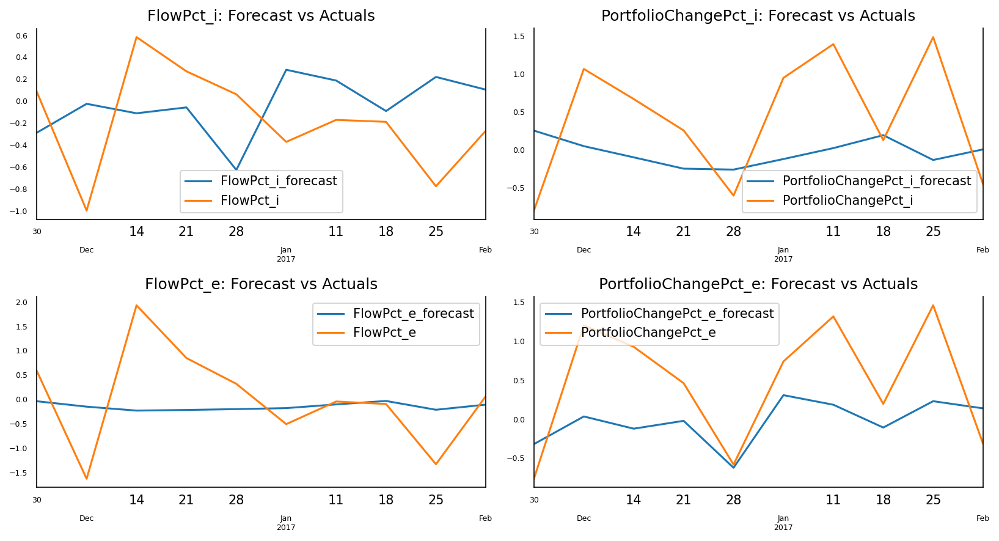

In [190]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    lcg[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [191]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.6208
corr :  -0.4462

Forecast Accuracy of: PortfolioPct_i
rmse :  0.9477
corr :  -0.1906

Forecast Accuracy of: FlowPct_e:
rmse :  1.0032
corr :  -0.1092

Forecast Accuracy of: PortfolioPct_e
rmse :  0.787
corr :  0.6904


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [192]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,-1,1,-1,1,1,-1,-1,1
2016-12-14,1,-1,1,-1,0,-1,0,-1
2016-12-21,-1,-1,-1,-1,0,-1,0,1
2016-12-28,-1,-1,-1,-1,-1,0,0,-1
2017-01-04,-1,1,-1,1,1,1,0,1
2017-01-11,1,1,1,1,0,1,0,-1
2017-01-18,0,-1,0,-1,-1,1,0,-1
2017-01-25,-1,1,-1,1,1,-1,-1,1
2017-02-01,1,-1,1,-1,-1,1,1,0


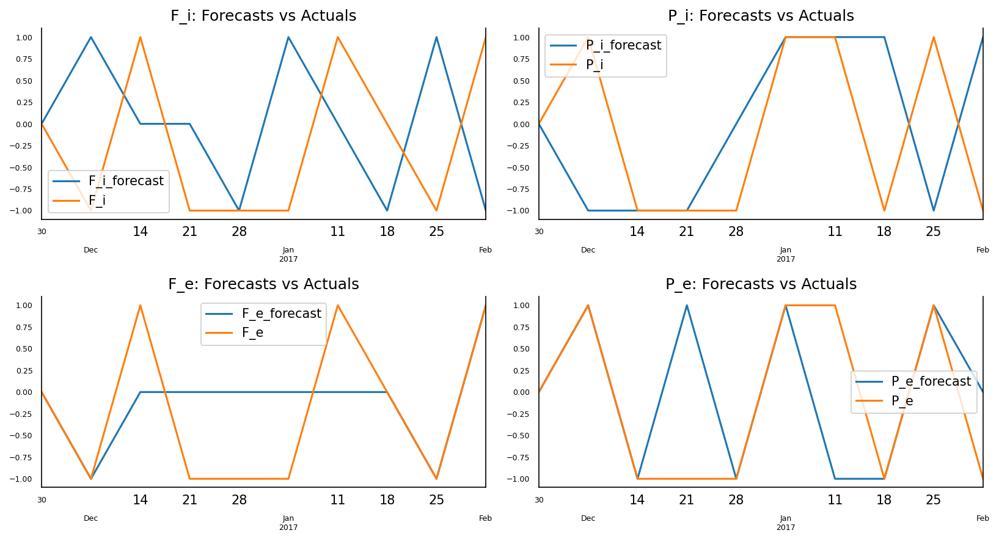

In [193]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [194]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.2
The accuracy score for PortfolioChangePct_i is 0.5
The accuracy score for FlowPct_e is 0.5
The accuracy score for PortfolioChangePct_e is 0.7


In [195]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             1   1   3
 0             1   1   0
 1             1   2   0, P_i_forecast  -1   0   1
P_i                     
-1             2   1   2
 0             0   1   0
 1             2   0   2, F_e_forecast  -1   0   1
F_e                     
-1             2   3   0
 0             0   2   0
 1             0   2   1, P_e_forecast  -1   0   1
P_e                     
-1             3   1   1
 0             0   1   0
 1             1   0   3]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.3392664494460721 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.2872974951836456 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.3232398928813502 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.12325207518064407 



In [196]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.8
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.5
FlowPct_e v.s. FlowPct_e_forecast: 0.5
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.3


### lcv, Large Capital Value

In [197]:
# grangers causation
grangers_causation_matrix(lcv, variables = lcv.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0606,0.0127,0.0494
PortfolioChangePct_i_y,0.1509,1.0000,0.0777,0.1196
FlowPct_e_y,0.2168,0.2315,1.0000,0.2311
PortfolioChangePct_e_y,0.1611,0.1689,0.0814,1.0000


In [198]:
# adf
adf_test(lcv)

Statistics analysis of Inst MF FlowPct

Statistic Test: -4.903292567505727
p-value: 3.436335037671786e-05
 => P-Value = 3.436335037671786e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -25.280068371070996
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -5.922085357688959
p-value: 2.492702503750226e-07
 => P-Value = 2.492702503750226e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -25.41603049426415
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [199]:
# split data
split(lcv, 10)

In [200]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [201]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(lcv.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.03
PortfolioChangePct_i : 2.0
FlowPct_e : 2.02
PortfolioChangePct_e : 2.0


In [202]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [203]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

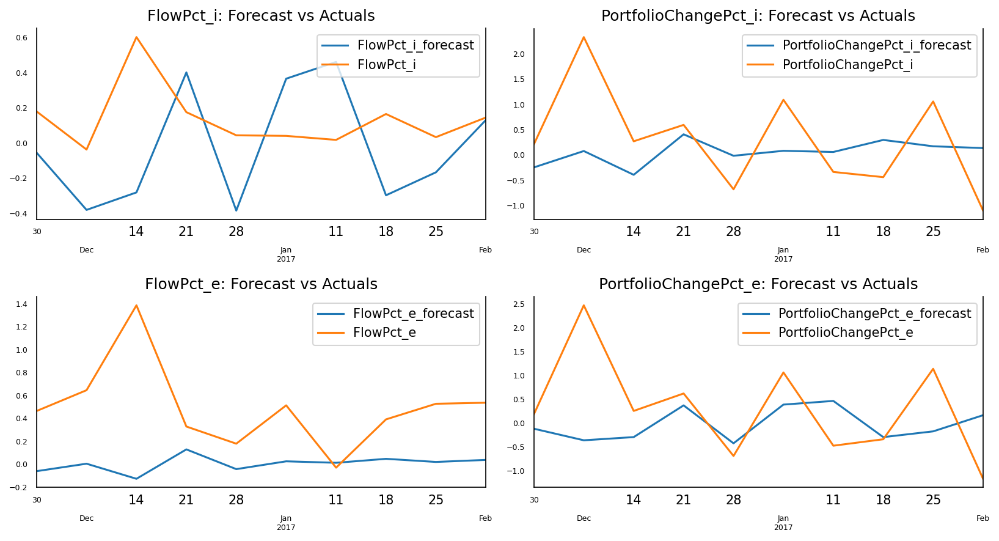

In [204]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    lcv[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [205]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.4179
corr :  -0.1761

Forecast Accuracy of: PortfolioPct_i
rmse :  1.0094
corr :  0.0345

Forecast Accuracy of: FlowPct_e:
rmse :  0.6267
corr :  -0.5533

Forecast Accuracy of: PortfolioPct_e
rmse :  1.1554
corr :  -0.1462


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [206]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,-1,1,1,1,-1,1,0,-1
2016-12-14,1,-1,1,-1,0,-1,-1,0
2016-12-21,-1,1,-1,1,1,1,1,1
2016-12-28,-1,-1,-1,-1,-1,-1,-1,-1
2017-01-04,0,1,1,1,1,0,0,1
2017-01-11,0,-1,-1,-1,0,0,0,0
2017-01-18,1,-1,1,1,-1,1,0,-1
2017-01-25,-1,1,1,1,1,-1,0,1
2017-02-01,1,-1,0,-1,1,0,0,1


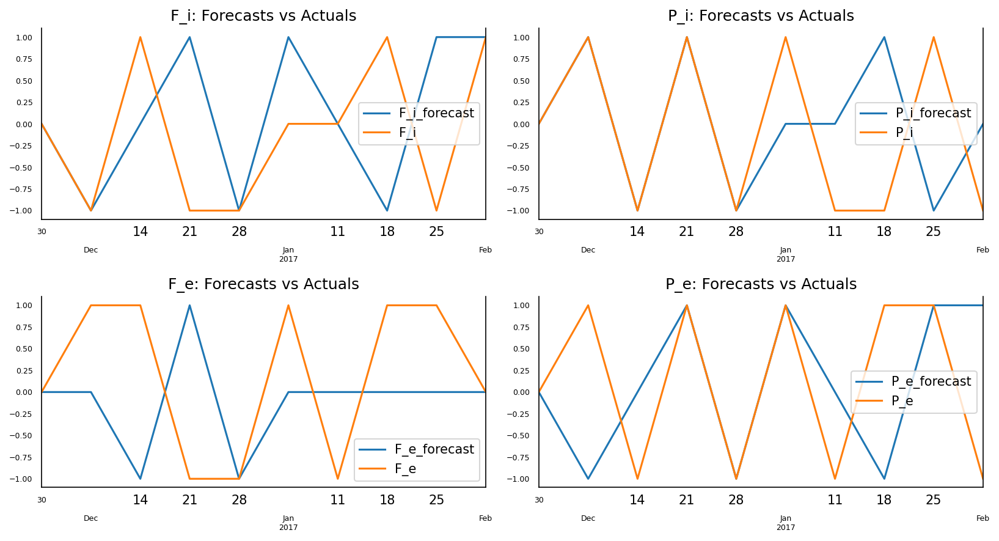

In [207]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [208]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.5
The accuracy score for PortfolioChangePct_i is 0.5
The accuracy score for FlowPct_e is 0.3
The accuracy score for PortfolioChangePct_e is 0.5


In [209]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             2   0   2
 0             0   2   1
 1             1   1   1, P_i_forecast  -1   0   1
P_i                     
-1             2   2   1
 0             0   1   0
 1             1   1   2, F_e_forecast  -1   0   1
F_e                     
-1             1   1   1
 0             0   2   0
 1             1   4   0, P_e_forecast  -1   0   1
P_e                     
-1             1   2   1
 0             0   1   0
 1             2   0   3]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.383919620286046 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.6224009314362378 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.4190483361141284 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.25865804729956854 



In [210]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.5
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.5
FlowPct_e v.s. FlowPct_e_forecast: 0.7
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.5


### mcb, Mid Capital Blend

In [211]:
# grangers causation
grangers_causation_matrix(mcb, variables = mcb.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0000,0.0038,0.0001
PortfolioChangePct_i_y,0.0121,1.0000,0.0046,0.0054
FlowPct_e_y,0.0584,0.0011,1.0000,0.0014
PortfolioChangePct_e_y,0.0095,0.0045,0.0033,1.0000


In [212]:
# adf
adf_test(mcb)

Statistics analysis of Inst MF FlowPct

Statistic Test: -5.438711043253658
p-value: 2.8075201505439987e-06
 => P-Value = 2.8075201505439987e-06. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -25.252949492074375
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -5.883488137128782
p-value: 3.0395821554056246e-07
 => P-Value = 3.0395821554056246e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -7.317640636019543
p-value: 1.217409541085239e-10
 => P-Value = 1.217409541085239e-10. Rejecting Null Hypothesis.
 => Series is Stationary.


In [213]:
# split data
split(mcb, 10)

In [214]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [215]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(mcb.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.0
PortfolioChangePct_i : 2.0
FlowPct_e : 2.0
PortfolioChangePct_e : 2.0


In [216]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [217]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

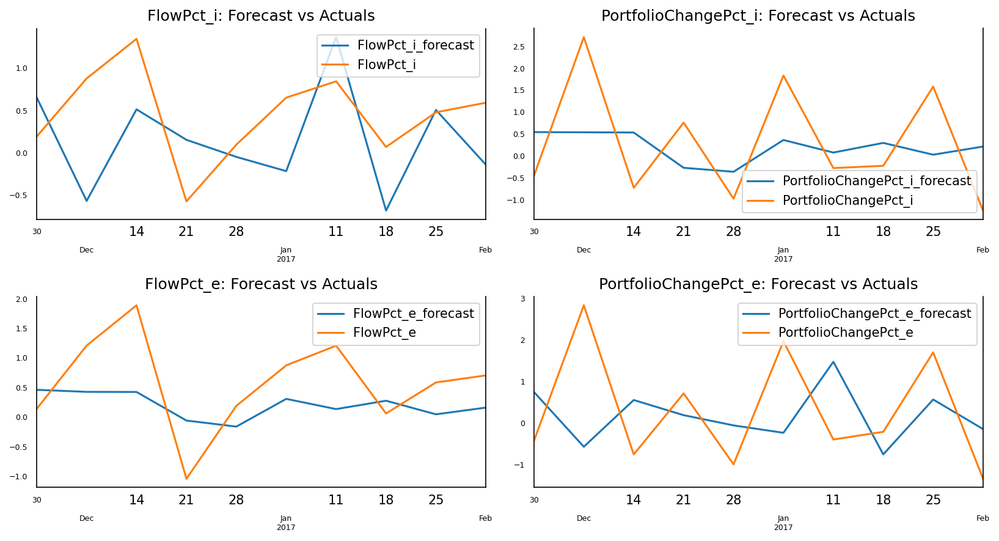

In [218]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    mcb[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [219]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.7537
corr :  0.2162

Forecast Accuracy of: PortfolioPct_i
rmse :  1.2563
corr :  0.1876

Forecast Accuracy of: FlowPct_e:
rmse :  0.7782
corr :  0.5312

Forecast Accuracy of: PortfolioPct_e
rmse :  1.6501
corr :  -0.2852


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [220]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,1,1,1,-1,0,0,-1
2016-12-14,1,-1,1,-1,1,0,0,1
2016-12-21,-1,1,-1,1,-1,-1,-1,-1
2016-12-28,1,-1,1,-1,-1,0,-1,-1
2017-01-04,1,1,1,1,-1,1,1,-1
2017-01-11,1,-1,1,-1,1,-1,-1,1
2017-01-18,-1,0,-1,1,-1,1,1,-1
2017-01-25,1,1,1,1,1,-1,-1,1
2017-02-01,1,-1,1,-1,-1,1,1,-1


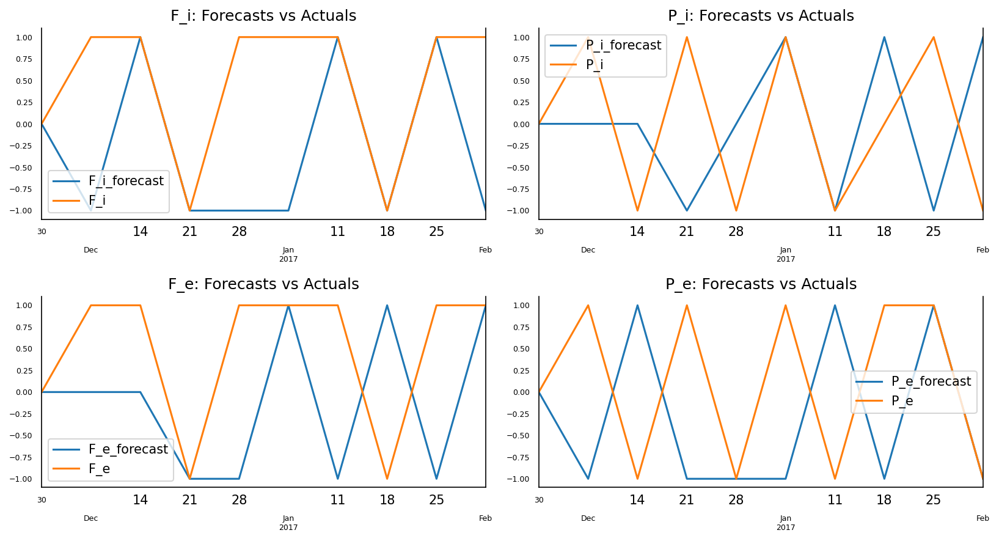

In [221]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [222]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.6
The accuracy score for PortfolioChangePct_i is 0.3
The accuracy score for FlowPct_e is 0.4
The accuracy score for PortfolioChangePct_e is 0.4


In [223]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             2   0   0
 0             0   1   0
 1             4   0   3, P_i_forecast  -1   0   1
P_i                     
-1             1   2   1
 0             0   1   1
 1             2   1   1, F_e_forecast  -1   0   1
F_e                     
-1             1   0   1
 0             0   1   0
 1             3   2   2, P_e_forecast  -1   0   1
P_e                     
-1             2   0   2
 0             0   1   0
 1             4   0   1]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.022147110075591045 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.758735901686298 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.5130925856412407 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.026564014350016436 



In [224]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.4
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.7
FlowPct_e v.s. FlowPct_e_forecast: 0.6
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.6


### mcg, Mid Capital Growth


In [225]:
# grangers causation
grangers_causation_matrix(mcg, variables = mcg.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0000,0.4293,0.0000
PortfolioChangePct_i_y,0.0520,1.0000,0.0292,0.0815
FlowPct_e_y,0.0637,0.0000,1.0000,0.0000
PortfolioChangePct_e_y,0.0562,0.1047,0.0285,1.0000


In [226]:
# adf
adf_test(mcg)

Statistics analysis of Inst MF FlowPct

Statistic Test: -5.712203918561933
p-value: 7.256083627478213e-07
 => P-Value = 7.256083627478213e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -25.234402602995136
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -10.69032015044377
p-value: 3.7404739034799575e-19
 => P-Value = 3.7404739034799575e-19. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -7.555440546303538
p-value: 3.1084561503008524e-11
 => P-Value = 3.1084561503008524e-11. Rejecting Null Hypothesis.
 => Series is Stationary.


In [227]:
# split data
split(mcg, 10)

In [228]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [229]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(mcg.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.0
PortfolioChangePct_i : 2.0
FlowPct_e : 2.0
PortfolioChangePct_e : 2.0


In [230]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [231]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

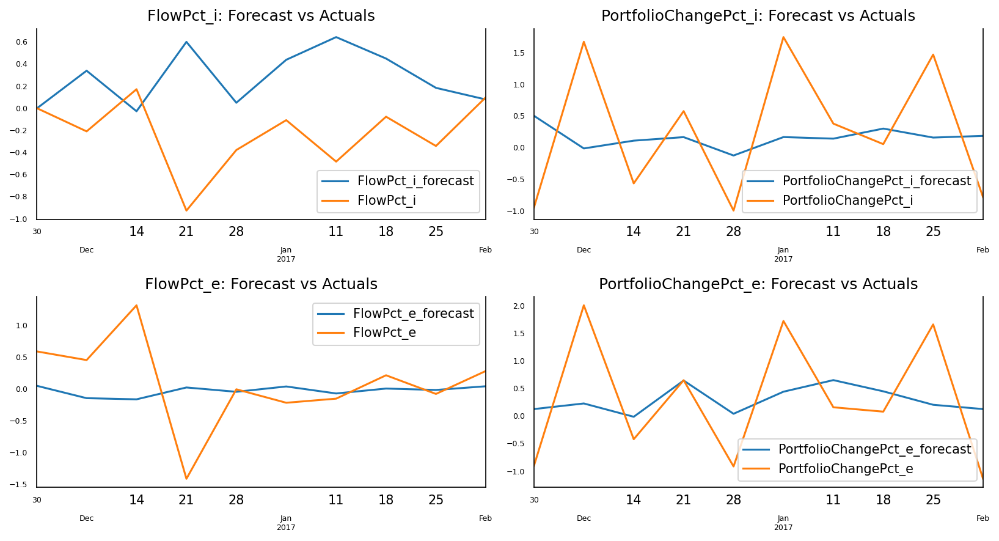

In [232]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    mcg[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [233]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.7051
corr :  -0.6525

Forecast Accuracy of: PortfolioPct_i
rmse :  1.0749
corr :  -0.1881

Forecast Accuracy of: FlowPct_e:
rmse :  0.7142
corr :  -0.493

Forecast Accuracy of: PortfolioPct_e
rmse :  1.0499
corr :  0.385


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [234]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,-1,1,-1,1,1,-1,-1,1
2016-12-14,1,-1,1,-1,-1,1,0,-1
2016-12-21,-1,1,-1,1,1,0,1,1
2016-12-28,1,-1,1,-1,-1,-1,0,-1
2017-01-04,1,1,-1,1,1,1,0,1
2017-01-11,-1,-1,0,-1,1,0,-1,1
2017-01-18,1,-1,1,0,-1,1,0,-1
2017-01-25,-1,1,-1,1,-1,-1,0,-1
2017-02-01,1,-1,1,-1,-1,0,0,0


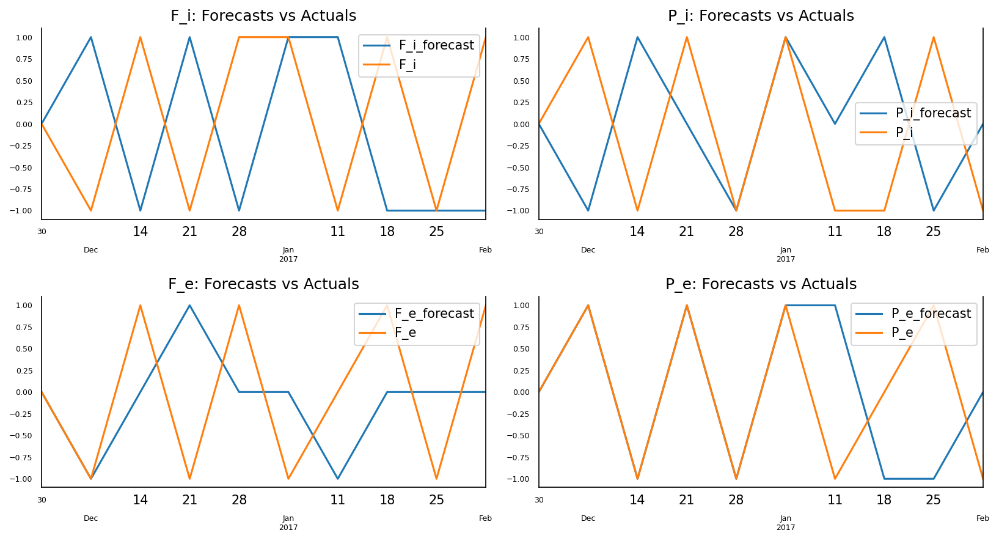

In [235]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [236]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.3
The accuracy score for PortfolioChangePct_i is 0.3
The accuracy score for FlowPct_e is 0.2
The accuracy score for PortfolioChangePct_e is 0.6


In [237]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             1   0   3
 0             0   1   0
 1             4   0   1, P_i_forecast  -1   0   1
P_i                     
-1             1   2   2
 0             0   1   0
 1             2   1   1, F_e_forecast  -1   0   1
F_e                     
-1             1   2   1
 0             1   1   0
 1             0   4   0, P_e_forecast  -1   0   1
P_e                     
-1             2   1   1
 0             1   1   0
 1             1   0   3]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.011154283324970366 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.6224009314362378 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.3916997945559237 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.35762758853359566 



In [238]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.7
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.7
FlowPct_e v.s. FlowPct_e_forecast: 0.8
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.4


### mcv, Mid Capital Value

In [239]:
# grangers causation
grangers_causation_matrix(mcv, variables = mcv.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0003,0.0680,0.0002
PortfolioChangePct_i_y,0.0262,1.0000,0.1547,0.5724
FlowPct_e_y,0.0811,0.0001,1.0000,0.0002
PortfolioChangePct_e_y,0.0258,0.3442,0.1275,1.0000


In [240]:
# adf
adf_test(mcv)

Statistics analysis of Inst MF FlowPct

Statistic Test: -8.48075063970235
p-value: 1.3953167180277224e-13
 => P-Value = 1.3953167180277224e-13. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -7.804758265212683
p-value: 7.33186491159629e-12
 => P-Value = 7.33186491159629e-12. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -9.304902940585187
p-value: 1.0873836027254421e-15
 => P-Value = 1.0873836027254421e-15. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -7.993272466828869
p-value: 2.442029884917229e-12
 => P-Value = 2.442029884917229e-12. Rejecting Null Hypothesis.
 => Series is Stationary.


In [241]:
# split data
split(mcv, 10)

In [242]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [243]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(mcv.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.0
PortfolioChangePct_i : 2.0
FlowPct_e : 2.01
PortfolioChangePct_e : 2.0


In [244]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [245]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

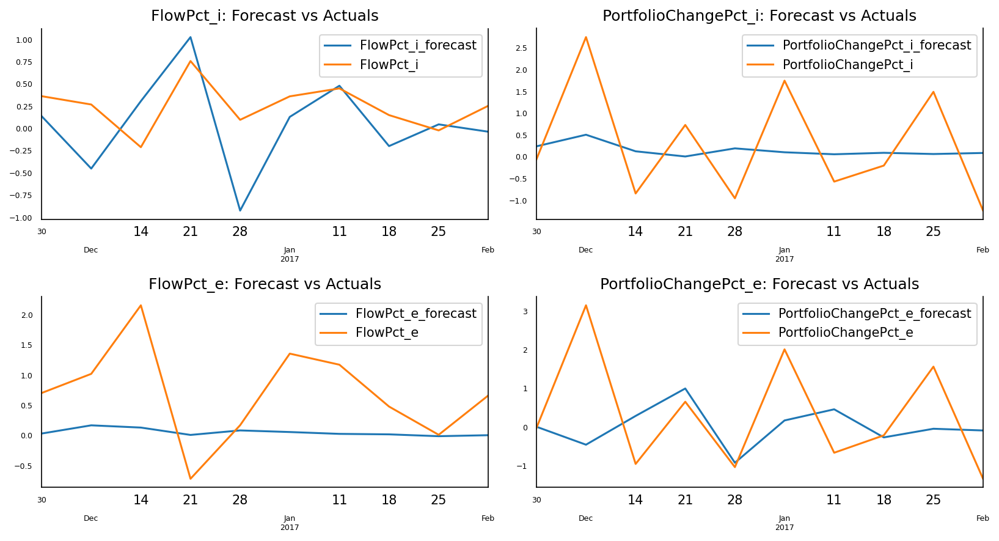

In [246]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    mcv[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [247]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.4707
corr :  0.5121

Forecast Accuracy of: PortfolioPct_i
rmse :  1.2195
corr :  0.4584

Forecast Accuracy of: FlowPct_e:
rmse :  0.9713
corr :  0.5722

Forecast Accuracy of: PortfolioPct_e
rmse :  1.5359
corr :  -0.0002


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [248]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,0,1,1,1,-1,1,1,-1
2016-12-14,-1,-1,1,-1,1,-1,0,1
2016-12-21,1,1,-1,1,1,-1,-1,1
2016-12-28,-1,-1,1,-1,-1,1,0,-1
2017-01-04,1,1,1,1,1,0,0,1
2017-01-11,0,-1,-1,-1,1,0,0,1
2017-01-18,-1,1,-1,1,-1,0,0,-1
2017-01-25,-1,1,-1,1,1,0,0,1
2017-02-01,1,-1,1,-1,0,0,0,0


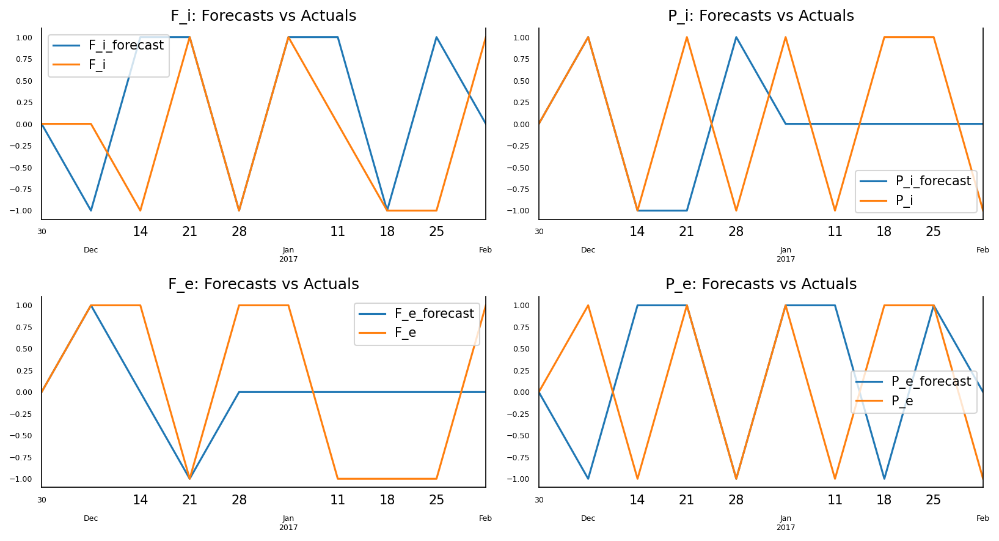

In [249]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [250]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.5
The accuracy score for PortfolioChangePct_i is 0.3
The accuracy score for FlowPct_e is 0.3
The accuracy score for PortfolioChangePct_e is 0.5


In [251]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             2   0   2
 0             1   1   1
 1             0   1   2, P_i_forecast  -1   0   1
P_i                     
-1             1   2   1
 0             0   1   0
 1             1   3   1, F_e_forecast  -1   0   1
F_e                     
-1             1   3   0
 0             0   1   0
 1             0   4   1, P_e_forecast  -1   0   1
P_e                     
-1             1   1   2
 0             0   1   0
 1             2   0   3]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.5394064465772305 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.9339242261172953 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.6334802462383335 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.25323259435038503 



In [252]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.5
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.7
FlowPct_e v.s. FlowPct_e_forecast: 0.7
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.5


### rea, Real Estate

In [253]:
# grangers causation
grangers_causation_matrix(rea, variables = rea.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.2054,0.0000,0.1946
PortfolioChangePct_i_y,0.0062,1.0000,0.0036,0.1479
FlowPct_e_y,0.0000,0.5778,1.0000,0.5267
PortfolioChangePct_e_y,0.0087,0.0441,0.0051,1.0000


In [254]:
# adf
adf_test(rea)

Statistics analysis of Inst MF FlowPct

Statistic Test: -7.957576563427934
p-value: 3.0084136851612686e-12
 => P-Value = 3.0084136851612686e-12. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -8.806828498964004
p-value: 2.041089898709908e-14
 => P-Value = 2.041089898709908e-14. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -9.095104860325018
p-value: 3.733300819424076e-15
 => P-Value = 3.733300819424076e-15. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -13.266831630202043
p-value: 8.186402760495725e-25
 => P-Value = 8.186402760495725e-25. Rejecting Null Hypothesis.
 => Series is Stationary.


In [255]:
# split data
split(rea, 10)

In [256]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [257]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(rea.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 1.99
PortfolioChangePct_i : 2.01
FlowPct_e : 2.0
PortfolioChangePct_e : 2.01


In [258]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [259]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

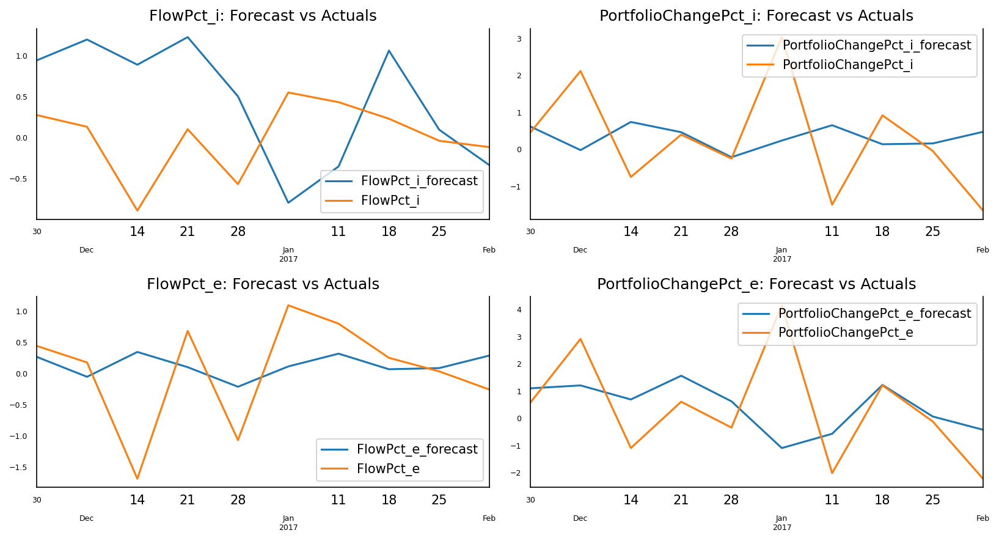

In [260]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    rea[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [261]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  1.0139
corr :  -0.3021

Forecast Accuracy of: PortfolioPct_i
rmse :  1.5632
corr :  -0.451

Forecast Accuracy of: FlowPct_e:
rmse :  0.8255
corr :  0.0613

Forecast Accuracy of: PortfolioPct_e
rmse :  2.0268
corr :  0.0941


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [262]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,-1,1,-1,1,1,-1,-1,1
2016-12-14,-1,-1,-1,-1,-1,1,1,-1
2016-12-21,1,1,1,1,1,-1,-1,1
2016-12-28,-1,-1,-1,-1,-1,-1,-1,-1
2017-01-04,1,1,1,1,-1,1,1,-1
2017-01-11,-1,-1,-1,-1,1,1,1,1
2017-01-18,-1,1,-1,1,1,-1,-1,1
2017-01-25,-1,-1,-1,-1,-1,0,0,-1
2017-02-01,0,-1,-1,-1,-1,1,1,-1


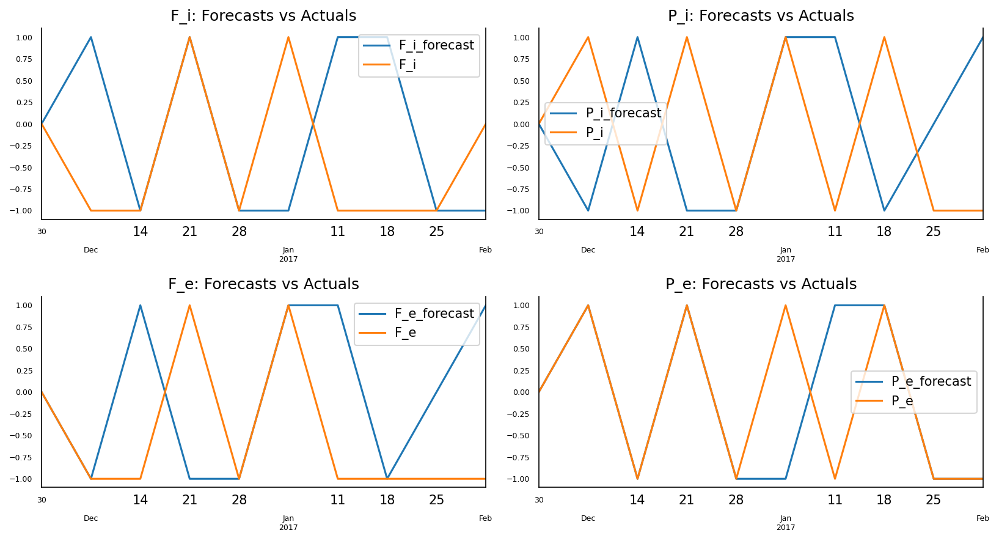

In [263]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [264]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.5
The accuracy score for PortfolioChangePct_i is 0.3
The accuracy score for FlowPct_e is 0.5
The accuracy score for PortfolioChangePct_e is 0.8


In [265]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             3   0   3
 0             1   1   0
 1             1   0   1, P_i_forecast  -1   0   1
P_i                     
-1             1   1   3
 0             0   1   0
 1             3   0   1, F_e_forecast  -1   0   1
F_e                     
-1             3   1   3
 0             0   1   0
 1             1   0   1, P_e_forecast  -1   0   1
P_e                     
-1             4   0   1
 0             0   1   0
 1             1   0   3]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.2872974951836456 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.12325207518064413 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.32594272981883077 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.011154283324970366 



In [266]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.5
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.7
FlowPct_e v.s. FlowPct_e_forecast: 0.5
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.2


### scb, Small Capital Blend

In [267]:
# grangers causation
grangers_causation_matrix(scb, variables = scb.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.1368,0.0000,0.1488
PortfolioChangePct_i_y,0.0044,1.0000,0.0139,0.0289
FlowPct_e_y,0.0000,0.1666,1.0000,0.1785
PortfolioChangePct_e_y,0.0048,0.0192,0.0157,1.0000


In [268]:
# adf
adf_test(scb)

Statistics analysis of Inst MF FlowPct

Statistic Test: -10.225509979133744
p-value: 5.1896414914246654e-18
 => P-Value = 5.1896414914246654e-18. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -25.564076740448574
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -8.85148487105337
p-value: 1.5685896674799158e-14
 => P-Value = 1.5685896674799158e-14. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -26.108256194017095
p-value: 0.0
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


In [269]:
# split data
split(scb, 10)

In [270]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [271]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(scb.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 1.99
PortfolioChangePct_i : 2.01
FlowPct_e : 1.99
PortfolioChangePct_e : 2.01


In [272]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [273]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

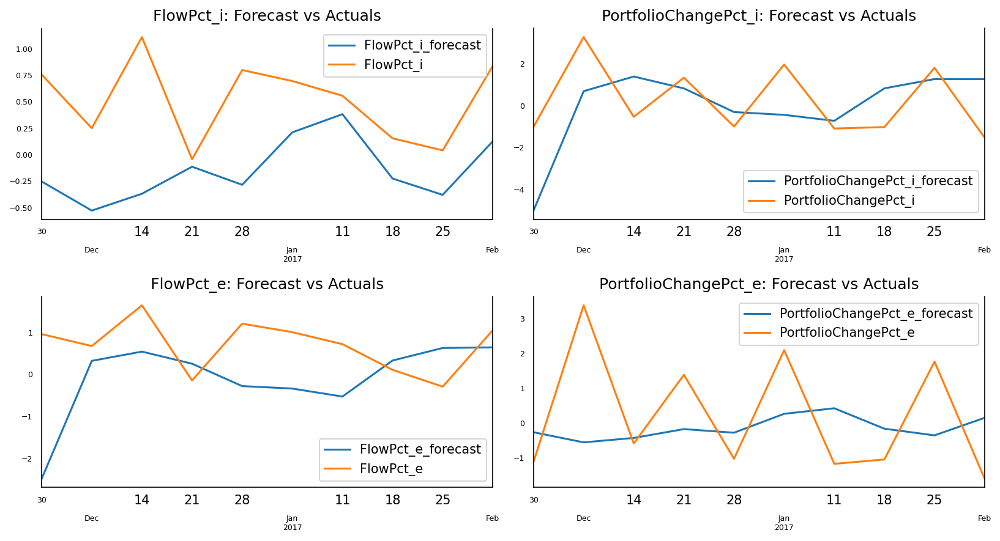

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    scb[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.7797
corr :  0.1939

Forecast Accuracy of: PortfolioPct_i
rmse :  2.109
corr :  0.2559

Forecast Accuracy of: FlowPct_e:
rmse :  1.4127
corr :  -0.2293

Forecast Accuracy of: PortfolioPct_e
rmse :  1.829
corr :  -0.3255


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,-1,1,-1,1,-1,1,1,-1
2016-12-14,1,-1,1,-1,1,1,1,1
2016-12-21,-1,1,-1,1,1,-1,-1,1
2016-12-28,1,-1,1,-1,-1,-1,-1,-1
2017-01-04,-1,1,-1,1,1,-1,0,1
2017-01-11,-1,-1,-1,-1,1,-1,-1,1
2017-01-18,-1,0,-1,1,-1,1,1,-1
2017-01-25,-1,1,-1,1,-1,1,1,-1
2017-02-01,1,-1,1,-1,1,0,0,1


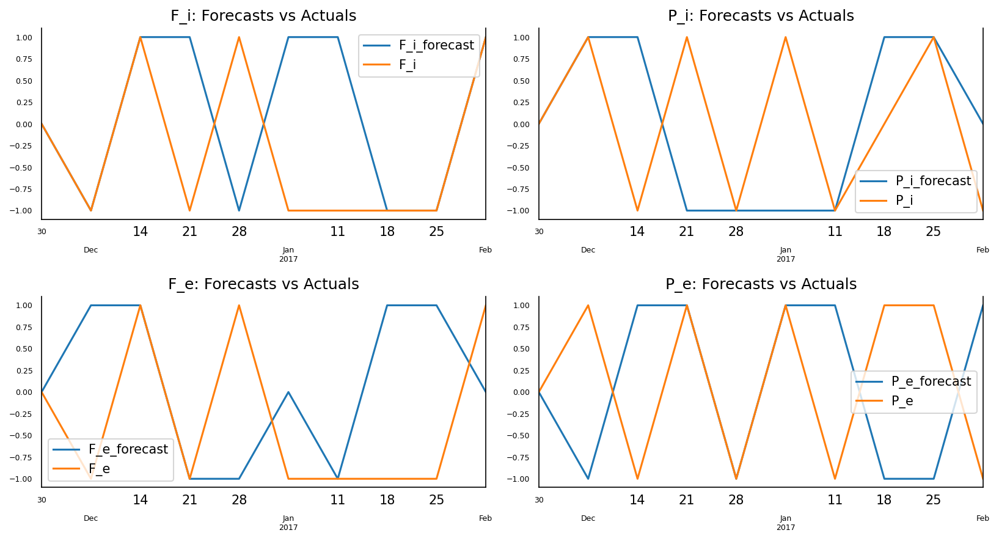

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.6
The accuracy score for PortfolioChangePct_i is 0.5
The accuracy score for FlowPct_e is 0.4
The accuracy score for PortfolioChangePct_e is 0.4


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             3   0   3
 0             0   1   0
 1             1   0   2, P_i_forecast  -1   0   1
P_i                     
-1             2   1   1
 0             0   1   1
 1             2   0   2, F_e_forecast  -1   0   1
F_e                     
-1             2   1   3
 0             0   1   0
 1             1   1   1, P_e_forecast  -1   0   1
P_e                     
-1             1   0   3
 0             0   1   0
 1             3   0   2]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.036420581308391584 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.5371291795746882 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.5718664923800113 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.0241483746647379 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.4
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.5
FlowPct_e v.s. FlowPct_e_forecast: 0.6
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.6


### scg, Small Capital Growth

In [ ]:
# grangers causation
grangers_causation_matrix(scg, variables = scg.columns)

In [ ]:
# adf
adf_test(scg)

In [ ]:
# split data
split(scg, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

In [ ]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(scg.columns, out):
    print(col, ':', round(val, 2))

In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    scg[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

In [ ]:
table = crosstab(direc)
chi_sq_test(table)

In [ ]:
hamming_distance(direc)

### scv, Small Capital Value

In [ ]:
# grangers causation
grangers_causation_matrix(scv, variables = scv.columns)

In [ ]:
# adf
adf_test(scv)

In [ ]:
# split data
split(scv, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

In [ ]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(scv.columns, out):
    print(col, ':', round(val, 2))

In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    scv[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

In [ ]:
table = crosstab(direc)
chi_sq_test(table)

In [ ]:
hamming_distance(direc)

### tec, Technology

In [ ]:
# grangers causation
grangers_causation_matrix(tec, variables = tec.columns)

In [ ]:
# adf
adf_test(tec)

In [ ]:
# split data
split(tec, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

In [ ]:
## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic
##
## If there is any correlation left in the residuals, then, 
## there is some pattern in the time series that is still left to be explained by the model. 
## In that case, the typical course of action is to either increase the order of the model 
## or induce more predictors into the system or look for a different algorithm to model the time series.
##
## The value of this statistic can vary between 0 and 4. The closer it is to the value 2, 
## then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, 
## and the closer it is to 4 implies negative serial correlation.

from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(tec.columns, out):
    print(col, ':', round(val, 2))

In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    tec[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

In [ ]:
table = crosstab(direc)
chi_sq_test(table)

In [ ]:
hamming_distance(direc)

### tel, Telecom

In [ ]:
# grangers causation
grangers_causation_matrix(tel, variables = tel.columns)

In [ ]:
# adf
adf_test(tel)

In [ ]:
# split data
split(tel, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

In [ ]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(tel.columns, out):
    print(col, ':', round(val, 2))

In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    tel[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

In [ ]:
table = crosstab(direc)
chi_sq_test(table)

In [ ]:
hamming_distance(direc)

### uti, Utilities

In [ ]:
# grangers causation
grangers_causation_matrix(uti, variables = uti.columns)

In [ ]:
# adf
adf_test(uti)

In [ ]:
# split data
split(uti, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

In [ ]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(uti.columns, out):
    print(col, ':', round(val, 2))

In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    uti[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

In [ ]:
table = crosstab(direc)
chi_sq_test(table)

In [ ]:
hamming_distance(direc)

# VAR model 2-2: Cross-market, smooth method applied
* %Portfolio_etf(t) = a + b1* %Portfolio_etf(t-1) + b2* %Flow_etf(t-1) + b3* %Portfolio_inst(t-1) + b4* %Flow_inst(t-1)
* %Portfolio_ins(t) = a + b1* %Portfolio_etf(t-1) + b2* %Flow_etf(t-1) + b3* %Portfolio_inst(t-1) + b4* %Flow_inst(t-1)

To improve the accuracy of forecasts, try applying smooth method to the above models.

## Moving average (windows=4)

* After choosing the windows=4 (one month) as the parameter, the moving average model could return us new datasets which are smoother and more useful in the prediction process.

In [ ]:
# smooth time series(set windows=4 (a month))
def rolling_avg(df):
  df = df.rolling(window=4).mean().iloc[3:,:]
  return df

In [ ]:
com = rolling_avg(com)
con = rolling_avg(con)
ene = rolling_avg(ene)
fin = rolling_avg(fin)
hea = rolling_avg(hea)
ind = rolling_avg(ind)
lcb = rolling_avg(lcb)
lcg = rolling_avg(lcg)
lcv = rolling_avg(lcv)
mcb = rolling_avg(mcb)
mcg = rolling_avg(mcg)
mcv = rolling_avg(mcv)
rea = rolling_avg(rea)
scb = rolling_avg(scb)
scg = rolling_avg(scg)
scv = rolling_avg(scv)
tec = rolling_avg(tec)
tel = rolling_avg(tel)
uti = rolling_avg(uti)

Again, we take the energy data in ETF as an example to show the comparison of FlowPct and PortfolioChangePct before and after moving average.

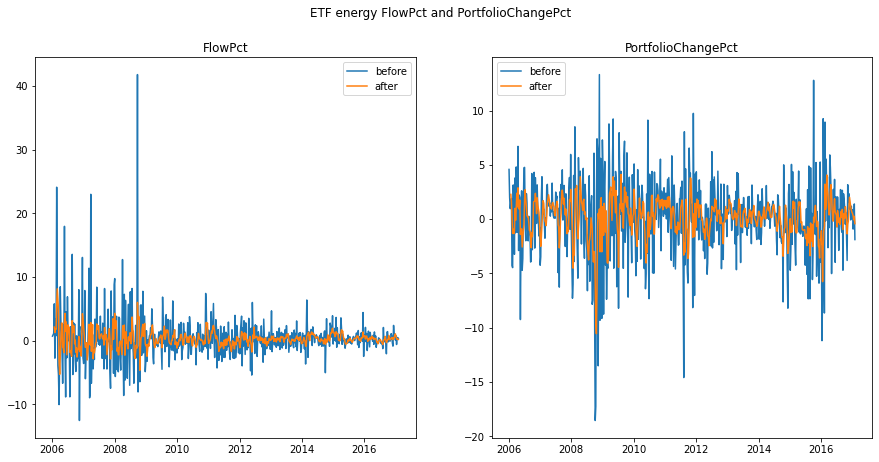

In [ ]:
# The comparison of FlowPct and PortfolioChangePct of energy data in ETF before and after moving average
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,7))
ax1.plot('FlowPct_e',data=ene1, label="before")
ax1.plot('FlowPct_e', data=ene, label="after")
ax2.plot('PortfolioChangePct_e',data=ene1, label="before")
ax2.plot('PortfolioChangePct_e', data=ene, label="after")
ax1.set_title('FlowPct')
ax2.set_title('PortfolioChangePct')
fig.suptitle('ETF energy FlowPct and PortfolioChangePct')
ax1.legend()
ax2.legend()

## Models for each sector

Run VAR model applied moving average method for 19 sectors.

### com, Commodities

In [ ]:
# grangers causation
grangers_causation_matrix(com, variables = com.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0002,0.6228,0.0002
PortfolioChangePct_i_y,0.0597,1.0000,0.0755,0.1063
FlowPct_e_y,0.3938,0.0002,1.0000,0.0002
PortfolioChangePct_e_y,0.0616,0.1006,0.0774,1.0000


In [ ]:
# adf
adf_test(com)

Statistics analysis of Inst MF FlowPct

Statistic Test: -4.811017260432472
p-value: 5.18072310769952e-05
 => P-Value = 5.18072310769952e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.357207106352008
p-value: 0.00035310068330943016
 => P-Value = 0.00035310068330943016. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -4.809167843623136
p-value: 5.223175075610237e-05
 => P-Value = 5.223175075610237e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -4.360419019717585
p-value: 0.00034854936171514414
 => P-Value = 0.00034854936171514414. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(com, 10)

In [ ]:
# train = train[["FlowPct_i",'PortfolioChangePct_i','PortfolioChangePct_e' ]]
# train_fe = train[["FlowPct_e",'PortfolioChangePct_i','PortfolioChangePct_e']]
# test_fi = test[["FlowPct_i",'PortfolioChangePct_i','PortfolioChangePct_e' ]]
# test_fe = test[["FlowPct_e",'PortfolioChangePct_i','PortfolioChangePct_e' ]]

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic
##
## If there is any correlation left in the residuals, then, 
## there is some pattern in the time series that is still left to be explained by the model. 
## In that case, the typical course of action is to either increase the order of the model 
## or induce more predictors into the system or look for a different algorithm to model the time series.
##
## The value of this statistic can vary between 0 and 4. The closer it is to the value 2, 
## then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, 
## and the closer it is to 4 implies negative serial correlation.

from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(com.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 1.98
PortfolioChangePct_i : 2.01
FlowPct_e : 1.98
PortfolioChangePct_e : 2.01


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,3.047259,2.255675,3.112370,2.282275,1.786271,1.939317,1.870592,1.810200
2016-12-07,3.225734,1.675425,3.270470,1.687750,-0.009314,1.079273,1.010240,0.000135
2016-12-14,2.085250,1.097875,2.081775,1.098250,0.599471,0.401260,0.336166,0.599957
2016-12-21,2.087725,0.410075,2.069950,0.412225,-0.067392,0.224399,0.195332,-0.068288
2016-12-28,1.321300,0.053850,1.295525,0.050275,-0.174817,0.453087,0.441945,-0.175153
2017-01-04,-0.251834,-0.225300,-0.285387,-0.230075,0.589509,0.535323,0.531883,0.589925
2017-01-11,-0.438259,0.413850,-0.445387,0.410525,0.052512,0.516119,0.521206,0.054844
2017-01-18,-0.831834,0.511475,-0.844362,0.504250,0.246697,0.628416,0.622654,0.248508
2017-01-25,0.254241,1.475650,0.257413,1.479346,0.458257,0.312571,0.304153,0.458186
2017-02-01,2.139870,0.685617,2.159771,0.686361,0.222740,0.513882,0.519755,0.226071


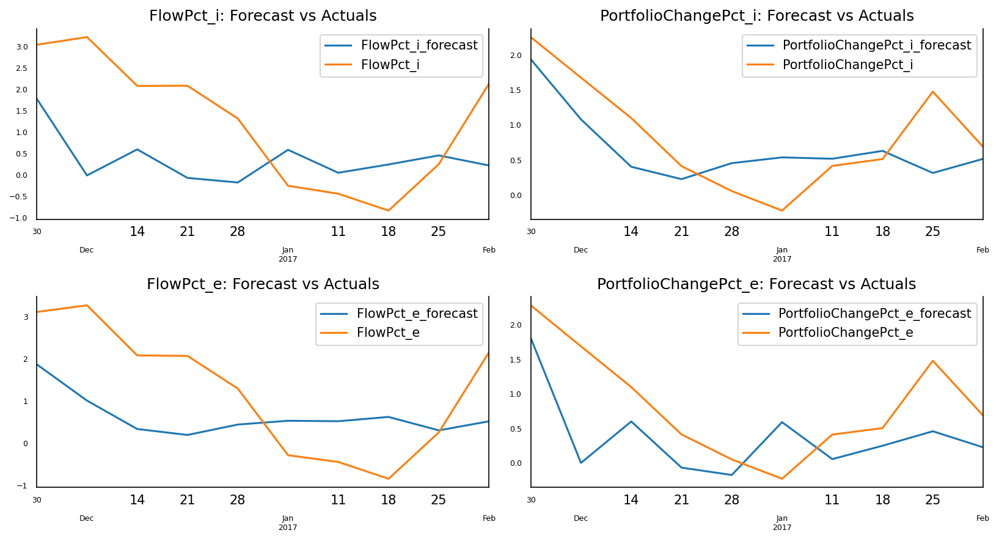

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    com[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  1.6424
corr :  0.2419

Forecast Accuracy of: PortfolioPct_i
rmse :  0.5585
corr :  0.6952

Forecast Accuracy of: FlowPct_e:
rmse :  1.4278
corr :  0.4617

Forecast Accuracy of: PortfolioPct_e
rmse :  0.7563
corr :  0.6089


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,-1,1,-1,-1,-1,-1,-1
2016-12-14,-1,-1,-1,-1,1,-1,-1,1
2016-12-21,0,-1,0,-1,-1,-1,-1,-1
2016-12-28,-1,-1,-1,-1,-1,1,1,-1
2017-01-04,-1,-1,-1,-1,1,0,0,1
2017-01-11,-1,1,-1,1,-1,0,0,-1
2017-01-18,-1,0,-1,0,1,1,1,1
2017-01-25,1,1,1,1,1,-1,-1,1
2017-02-01,1,-1,1,-1,-1,1,1,-1


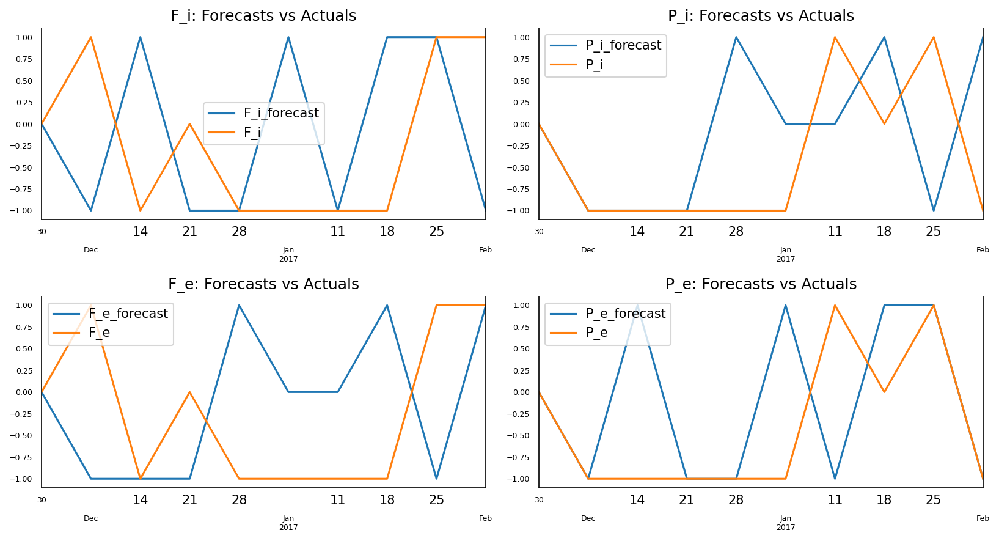

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.4
The accuracy score for PortfolioChangePct_i is 0.4
The accuracy score for FlowPct_e is 0.3
The accuracy score for PortfolioChangePct_e is 0.6


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             2   0   3
 0             1   1   0
 1             2   0   1, P_i_forecast  -1   0   1
P_i                     
-1             3   1   2
 0             0   1   1
 1             1   1   0, F_e_forecast  -1   0   1
F_e                     
-1             1   2   2
 0             1   1   0
 1             2   0   1, P_e_forecast  -1   0   1
P_e                     
-1             4   0   2
 0             0   1   1
 1             1   0   1]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.23107823797582816 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.5956747209679855 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.5258287317077178 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.23972947952515328 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.6
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.6
FlowPct_e v.s. FlowPct_e_forecast: 0.7
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.4


### con , Consumer

In [ ]:
# grangers causation
grangers_causation_matrix(con, variables = con.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0025,1.0000,0.0025
PortfolioChangePct_i_y,0.0021,1.0000,0.0021,1.0000
FlowPct_e_y,1.0000,0.0025,1.0000,0.0025
PortfolioChangePct_e_y,0.0021,1.0000,0.0021,1.0000


In [ ]:
# adf
adf_test(con)

Statistics analysis of Inst MF FlowPct

Statistic Test: -5.768674266213459
p-value: 5.456629627423986e-07
 => P-Value = 5.456629627423986e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.938529513150432
p-value: 2.9326775925693567e-05
 => P-Value = 2.9326775925693567e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -5.768674266213459
p-value: 5.456629627423986e-07
 => P-Value = 5.456629627423986e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -4.938529513150432
p-value: 2.9326775925693567e-05
 => P-Value = 2.9326775925693567e-05. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(con, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic
##
## If there is any correlation left in the residuals, then, 
## there is some pattern in the time series that is still left to be explained by the model. 
## In that case, the typical course of action is to either increase the order of the model 
## or induce more predictors into the system or look for a different algorithm to model the time series.
##
## The value of this statistic can vary between 0 and 4. The closer it is to the value 2, 
## then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, 
## and the closer it is to 4 implies negative serial correlation.

from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(con.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.01
PortfolioChangePct_i : 2.02
FlowPct_e : 2.01
PortfolioChangePct_e : 2.02


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,-0.936750,0.479775,-0.936750,0.479775,0.745191,-0.300059,-0.300059,0.745191
2016-12-07,-0.830575,0.888625,-0.830575,0.888625,0.446706,-0.284851,-0.284851,0.446706
2016-12-14,-0.316900,0.783025,-0.316900,0.783025,0.604227,0.352251,0.352251,0.604227
2016-12-21,-0.405350,0.408175,-0.405350,0.408175,0.390167,0.260105,0.260105,0.390167
2016-12-28,-0.061450,0.359100,-0.061450,0.359100,0.239179,0.134016,0.134016,0.239179
2017-01-04,0.111809,-0.084625,0.111809,-0.084625,0.415461,0.268991,0.268991,0.415461
2017-01-11,0.464109,-0.090950,0.464109,-0.090950,0.261006,0.076555,0.076555,0.261006
2017-01-18,-0.143972,0.059375,-0.143972,0.059375,0.270888,0.065636,0.065636,0.270888
2017-01-25,0.093028,0.704981,0.093028,0.704981,0.299430,0.306917,0.306917,0.299430
2017-02-01,0.026369,0.233535,0.026369,0.233535,0.168813,0.287372,0.287372,0.168813


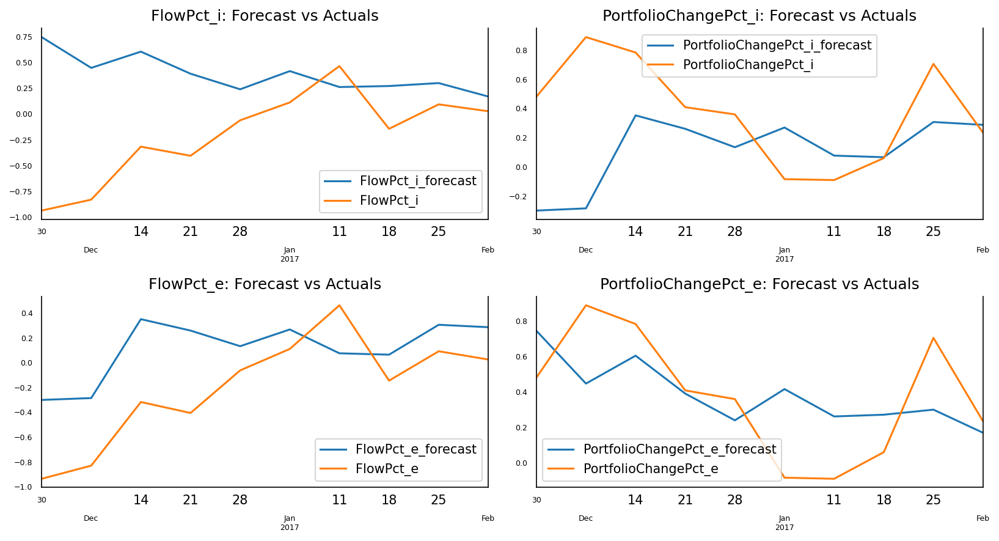

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    con[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.8
corr :  -0.7244

Forecast Accuracy of: PortfolioPct_i
rmse :  0.5058
corr :  -0.196

Forecast Accuracy of: FlowPct_e:
rmse :  0.4432
corr :  0.6688

Forecast Accuracy of: PortfolioPct_e
rmse :  0.3
corr :  0.434


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc, test_len=9, threshold=0.1)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,1,1,1,-1,0,0,-1
2016-12-14,1,-1,1,-1,1,1,1,1
2016-12-21,0,-1,0,-1,-1,0,0,-1
2016-12-28,1,0,1,0,-1,-1,-1,-1
2017-01-04,1,-1,1,-1,1,1,1,1
2017-01-11,1,0,1,0,-1,-1,-1,-1
2017-01-18,-1,1,-1,1,0,0,0,0
2017-01-25,1,1,1,1,0,1,1,0
2017-02-01,0,-1,0,-1,-1,0,0,-1


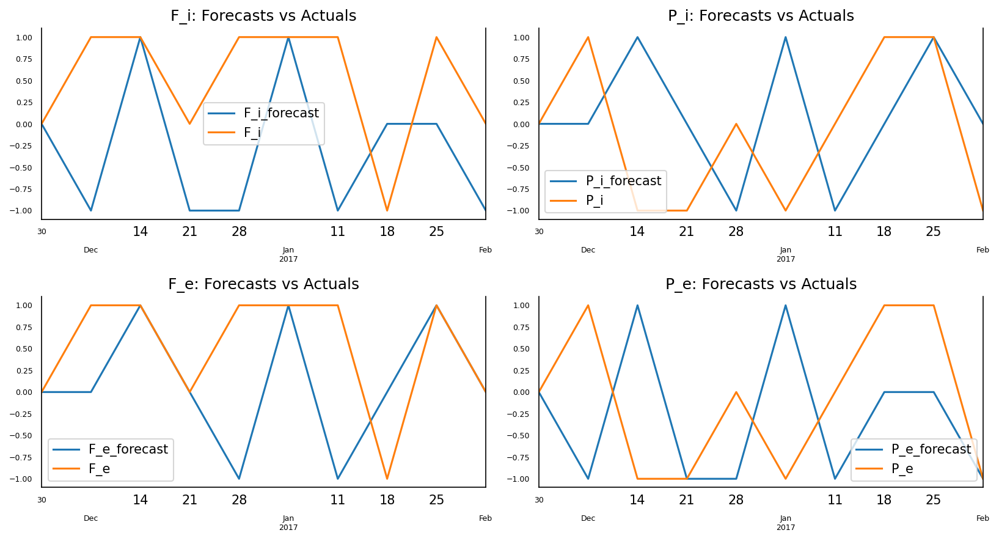

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.3
The accuracy score for PortfolioChangePct_i is 0.2
The accuracy score for FlowPct_e is 0.6
The accuracy score for PortfolioChangePct_e is 0.3


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             0   1   0
 0             2   1   0
 1             3   1   2, P_i_forecast  -1   0   1
P_i                     
-1             0   2   2
 0             2   1   0
 1             0   2   1, F_e_forecast  -1   0   1
F_e                     
-1             0   1   0
 0             0   3   0
 1             2   1   3, P_e_forecast  -1   0   1
P_e                     
-1             2   0   2
 0             2   1   0
 1             1   2   0]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.40600584970983794 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.16832466414461647 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.1545873045047604 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.20760120457988912 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.7
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.8
FlowPct_e v.s. FlowPct_e_forecast: 0.4
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.7


### ene, Energy

In [ ]:
# grangers causation
grangers_causation_matrix(ene, variables = ene.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0141,0.7695,0.0165
PortfolioChangePct_i_y,0.0003,1.0000,0.0003,0.0233
FlowPct_e_y,0.3085,0.0173,1.0000,0.0203
PortfolioChangePct_e_y,0.0003,0.0153,0.0004,1.0000


In [ ]:
# adf
adf_test(ene)

Statistics analysis of Inst MF FlowPct

Statistic Test: -6.722933528919838
p-value: 3.446398941623703e-09
 => P-Value = 3.446398941623703e-09. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.855859776443197
p-value: 4.247186393003571e-05
 => P-Value = 4.247186393003571e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -6.753624593903025
p-value: 2.908780782807018e-09
 => P-Value = 2.908780782807018e-09. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -4.88454603713804
p-value: 3.737211674222731e-05
 => P-Value = 3.737211674222731e-05. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(ene, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic
##
## If there is any correlation left in the residuals, then, 
## there is some pattern in the time series that is still left to be explained by the model. 
## In that case, the typical course of action is to either increase the order of the model 
## or induce more predictors into the system or look for a different algorithm to model the time series.
##
## The value of this statistic can vary between 0 and 4. The closer it is to the value 2, 
## then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, 
## and the closer it is to 4 implies negative serial correlation.

from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(ene.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.0
PortfolioChangePct_i : 2.01
FlowPct_e : 2.0
PortfolioChangePct_e : 2.01


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,0.254725,1.865625,0.172175,2.011300,1.792125,0.603917,0.599600,1.912963
2016-12-07,0.498405,1.358125,0.456258,1.544750,0.434750,0.158882,0.258918,0.543813
2016-12-14,0.509055,0.952850,0.496183,1.128100,0.013135,0.127066,0.225560,0.051849
2016-12-21,0.779330,0.786775,0.844983,0.841425,-0.395873,0.402921,0.459154,-0.375484
2016-12-28,0.957030,0.667225,1.084658,0.634750,-0.766841,0.208319,0.275769,-0.764198
2017-01-04,0.661686,0.653550,0.717311,0.521975,0.084759,0.557457,0.579000,0.097779
2017-01-11,0.387201,0.485825,0.348523,0.311650,0.312104,0.474623,0.490376,0.340734
2017-01-18,0.285051,0.026150,0.212098,-0.057650,0.339238,0.220825,0.259635,0.386136
2017-01-25,0.362851,0.352036,0.308098,0.253927,0.320110,0.278372,0.318131,0.357287
2017-02-01,0.273940,-0.294286,0.206637,-0.419735,-0.033438,0.168505,0.200240,-0.025967


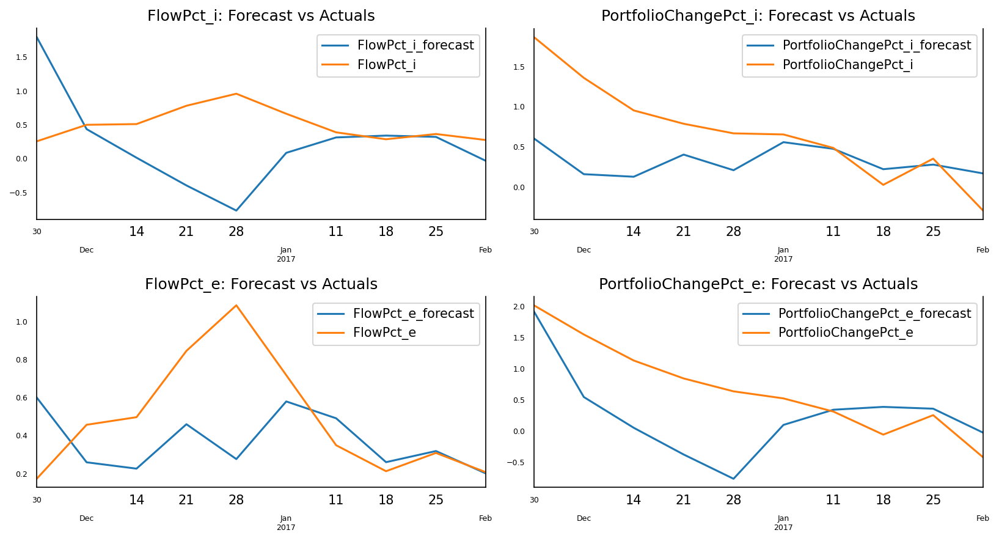

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    ene[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.8605
corr :  -0.7212

Forecast Accuracy of: PortfolioPct_i
rmse :  0.6585
corr :  0.3814

Forecast Accuracy of: FlowPct_e:
rmse :  0.3376
corr :  0.0578

Forecast Accuracy of: PortfolioPct_e
rmse :  0.7843
corr :  0.5325


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,-1,1,-1,-1,-1,-1,-1
2016-12-14,0,-1,0,-1,-1,0,0,-1
2016-12-21,1,-1,1,-1,-1,1,1,-1
2016-12-28,1,-1,1,-1,-1,-1,-1,-1
2017-01-04,-1,0,-1,-1,1,1,1,1
2017-01-11,-1,-1,-1,-1,1,0,0,1
2017-01-18,-1,-1,-1,-1,0,-1,-1,0
2017-01-25,0,1,0,1,0,0,0,0
2017-02-01,0,-1,-1,-1,-1,-1,-1,-1


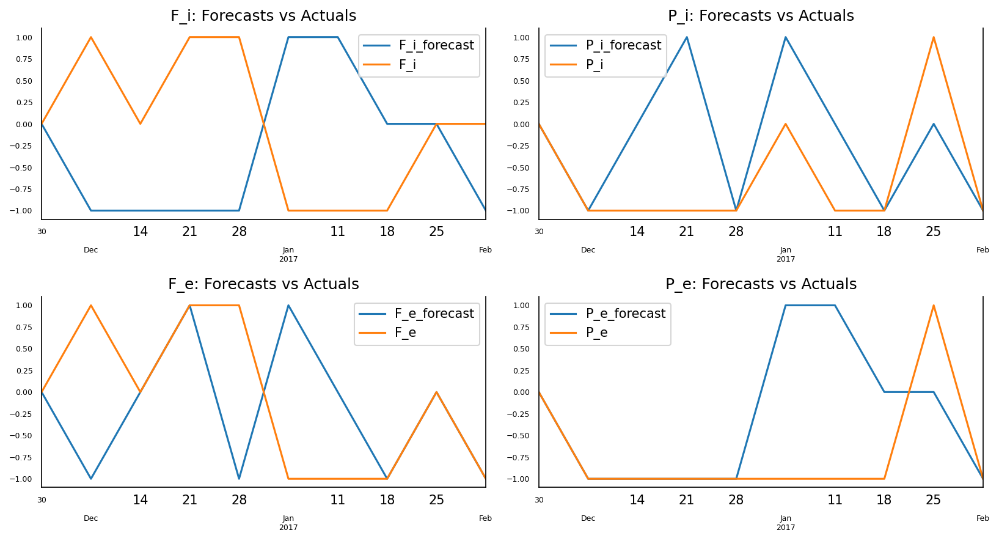

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.2
The accuracy score for PortfolioChangePct_i is 0.5
The accuracy score for FlowPct_e is 0.6
The accuracy score for PortfolioChangePct_e is 0.6


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             0   1   2
 0             2   2   0
 1             3   0   0, P_i_forecast  -1   0   1
P_i                     
-1             4   2   1
 0             0   1   1
 1             0   1   0, F_e_forecast  -1   0   1
F_e                     
-1             2   1   1
 0             0   3   0
 1             2   0   1, P_e_forecast  -1   0   1
P_e                     
-1             5   1   2
 0             0   1   0
 1             0   1   0]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.058381447030015535 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.3916997945559237 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.14264320376301254 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.211945584372718 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.8
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.5
FlowPct_e v.s. FlowPct_e_forecast: 0.4
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.4


### fin, Financials 

In [ ]:
# grangers causation
grangers_causation_matrix(fin, variables = fin.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0000,0.3091,0.0000
PortfolioChangePct_i_y,0.1145,1.0000,0.1142,0.1119
FlowPct_e_y,0.2862,0.0000,1.0000,0.0000
PortfolioChangePct_e_y,0.1141,0.1048,0.1140,1.0000


In [ ]:
# adf
adf_test(fin)

Statistics analysis of Inst MF FlowPct

Statistic Test: -5.325026388801273
p-value: 4.858523710130556e-06
 => P-Value = 4.858523710130556e-06. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.5619130624157265
p-value: 0.00015174014135516426
 => P-Value = 0.00015174014135516426. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -5.323538624988827
p-value: 4.89324166738584e-06
 => P-Value = 4.89324166738584e-06. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -4.564829697686131
p-value: 0.00014988669050028074
 => P-Value = 0.00014988669050028074. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(fin, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic
##
## If there is any correlation left in the residuals, then, 
## there is some pattern in the time series that is still left to be explained by the model. 
## In that case, the typical course of action is to either increase the order of the model 
## or induce more predictors into the system or look for a different algorithm to model the time series.
##
## The value of this statistic can vary between 0 and 4. The closer it is to the value 2, 
## then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, 
## and the closer it is to 4 implies negative serial correlation.

from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(fin.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.0
PortfolioChangePct_i : 1.99
FlowPct_e : 2.0
PortfolioChangePct_e : 1.99


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,2.029960,1.898475,2.121898,1.965825,2.168639,3.114630,3.001121,2.220934
2016-12-07,2.137885,1.829325,2.244648,1.886700,1.233187,4.228952,4.093514,1.258702
2016-12-14,0.530500,1.012775,0.528325,1.038425,0.592652,2.519429,2.463949,0.602031
2016-12-21,0.490325,0.941775,0.487500,0.959925,-0.380072,3.183596,3.125175,-0.390146
2016-12-28,0.544100,0.742175,0.542025,0.753775,-0.917861,1.993268,1.968282,-0.927758
2017-01-04,0.405500,0.419491,0.394175,0.423987,-0.901158,0.646598,0.646629,-0.915172
2017-01-11,0.605575,0.485716,0.598150,0.494212,-0.943952,0.571377,0.583630,-0.960336
2017-01-18,0.404529,-0.143210,0.382850,-0.150594,-0.673274,0.044013,0.082796,-0.688336
2017-01-25,0.043754,0.388740,-0.005156,0.394506,-0.767688,-0.176844,-0.126630,-0.786453
2017-02-01,0.187274,-0.245151,0.141244,-0.258456,-0.590537,-0.344104,-0.278288,-0.600371


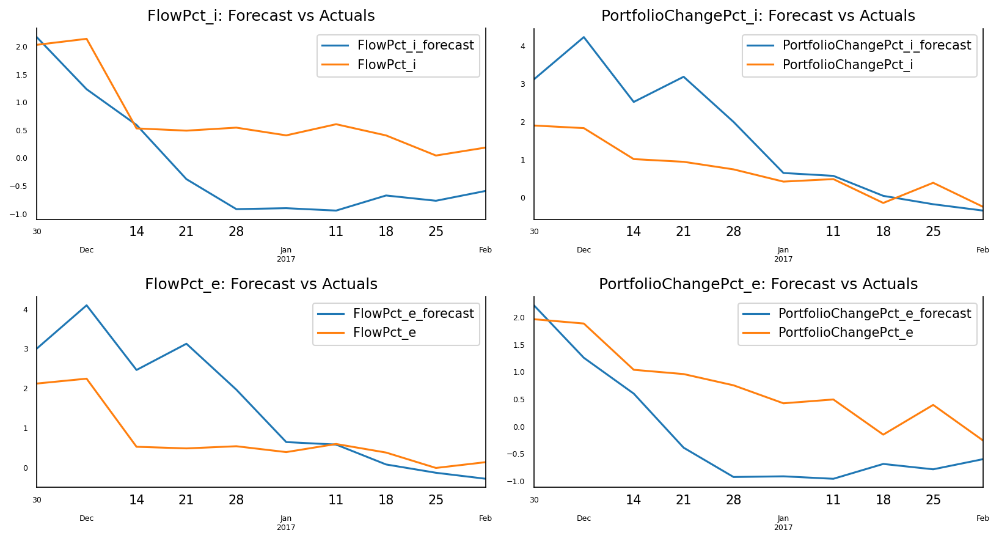

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    fin[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  1.0134
corr :  0.8709

Forecast Accuracy of: PortfolioPct_i
rmse :  1.2854
corr :  0.9112

Forecast Accuracy of: FlowPct_e:
rmse :  1.3143
corr :  0.7682

Forecast Accuracy of: PortfolioPct_e
rmse :  1.0493
corr :  0.8447


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,0,1,0,-1,1,1,-1
2016-12-14,-1,-1,-1,-1,-1,-1,-1,-1
2016-12-21,0,0,0,0,-1,1,1,-1
2016-12-28,0,-1,0,-1,-1,-1,-1,-1
2017-01-04,-1,-1,-1,-1,0,-1,-1,0
2017-01-11,1,0,1,0,0,0,0,0
2017-01-18,-1,-1,-1,-1,1,-1,-1,1
2017-01-25,-1,1,-1,1,0,-1,-1,0
2017-02-01,1,-1,1,-1,1,-1,-1,1


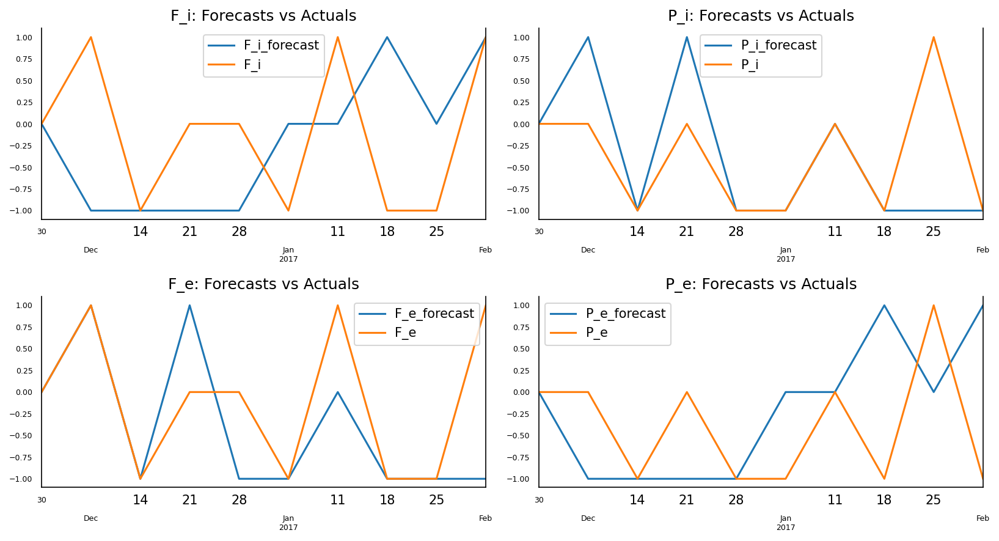

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.3
The accuracy score for PortfolioChangePct_i is 0.7
The accuracy score for FlowPct_e is 0.6
The accuracy score for PortfolioChangePct_e is 0.4


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             1   2   1
 0             2   1   0
 1             1   1   1, P_i_forecast  -1   0   1
P_i                     
-1             5   0   0
 0             0   2   2
 1             1   0   0, F_e_forecast  -1   0   1
F_e                     
-1             4   0   0
 0             1   1   1
 1             1   1   1, P_e_forecast  -1   0   1
P_e                     
-1             2   1   2
 0             2   2   0
 1             0   1   0]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.758735901686298 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.04042768199451284 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.3491858526038866 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.40600584970983794 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.7
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.3
FlowPct_e v.s. FlowPct_e_forecast: 0.4
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.6


### hea, Health

In [ ]:
# grangers causation
grangers_causation_matrix(hea, variables = hea.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.000,0.0056,0.0000
PortfolioChangePct_i_y,0.0001,1.000,0.0001,0.0721
FlowPct_e_y,0.0052,0.000,1.0000,0.0000
PortfolioChangePct_e_y,0.0001,0.074,0.0001,1.0000


In [ ]:
# adf
adf_test(hea)

Statistics analysis of Inst MF FlowPct

Statistic Test: -5.668266345168304
p-value: 9.045769485987723e-07
 => P-Value = 9.045769485987723e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -5.583847615891161
p-value: 1.377160923505237e-06
 => P-Value = 1.377160923505237e-06. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -5.737100043841647
p-value: 6.40076544347246e-07
 => P-Value = 6.40076544347246e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -5.574809524033902
p-value: 1.4401764389539692e-06
 => P-Value = 1.4401764389539692e-06. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(hea, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic
##
## If there is any correlation left in the residuals, then, 
## there is some pattern in the time series that is still left to be explained by the model. 
## In that case, the typical course of action is to either increase the order of the model 
## or induce more predictors into the system or look for a different algorithm to model the time series.
##
## The value of this statistic can vary between 0 and 4. The closer it is to the value 2, 
## then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, 
## and the closer it is to 4 implies negative serial correlation.

from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(hea.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.0
PortfolioChangePct_i : 2.01
FlowPct_e : 2.0
PortfolioChangePct_e : 2.01


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,1.705877,1.126135,1.866077,1.102871,1.018702,1.584065,1.452530,1.009480
2016-12-07,0.811402,-1.073500,0.864002,-1.100250,-0.662103,0.765490,0.734715,-0.672008
2016-12-14,-0.503900,-0.755750,-0.545150,-0.746100,-0.412100,-0.142737,-0.123487,-0.415280
2016-12-21,-0.519625,-0.644000,-0.525000,-0.638850,-0.163254,-0.303403,-0.287204,-0.156372
2016-12-28,-0.404000,-0.123050,-0.383625,-0.115775,0.149338,-0.301106,-0.290231,0.153502
2017-01-04,-0.166825,0.917894,-0.128975,0.927582,0.774955,-0.010322,-0.032265,0.776407
2017-01-11,0.441291,0.700269,0.517778,0.672957,0.670907,0.259983,0.235993,0.674978
2017-01-18,0.191191,0.775169,0.239303,0.758857,0.475674,0.480759,0.451766,0.472632
2017-01-25,-0.235966,0.423753,-0.231093,0.403187,0.164304,0.537290,0.512431,0.157560
2017-02-01,0.052684,0.354609,0.085932,0.328355,0.140271,0.547463,0.524308,0.133803


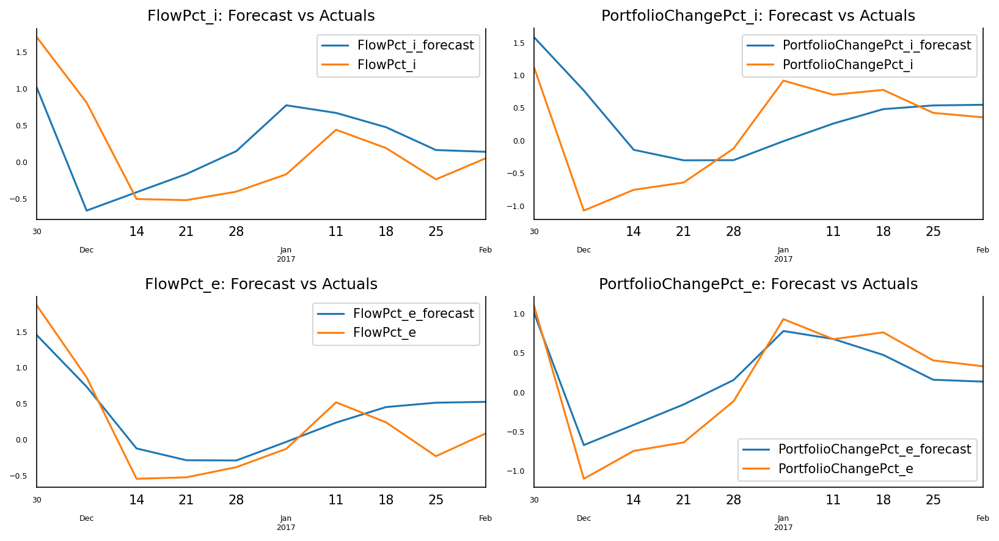

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    hea[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.6537
corr :  0.4074

Forecast Accuracy of: PortfolioPct_i
rmse :  0.7285
corr :  0.4193

Forecast Accuracy of: FlowPct_e:
rmse :  0.3619
corr :  0.9016

Forecast Accuracy of: PortfolioPct_e
rmse :  0.2846
corr :  0.9615


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,-1,-1,-1,-1,-1,-1,-1,-1
2016-12-14,-1,1,-1,1,1,-1,-1,1
2016-12-21,0,1,0,1,1,-1,-1,1
2016-12-28,1,1,1,1,1,0,0,1
2017-01-04,1,1,1,1,1,1,1,1
2017-01-11,1,-1,1,-1,-1,1,1,-1
2017-01-18,-1,0,-1,0,-1,1,1,-1
2017-01-25,-1,-1,-1,-1,-1,0,0,-1
2017-02-01,1,0,1,0,0,0,0,0


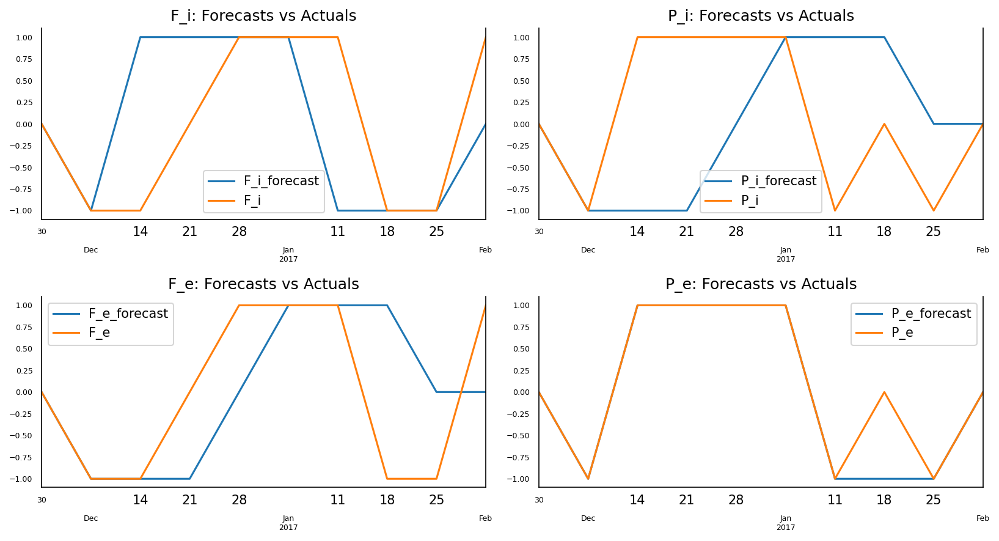

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.6
The accuracy score for PortfolioChangePct_i is 0.4
The accuracy score for FlowPct_e is 0.5
The accuracy score for PortfolioChangePct_e is 0.9


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             3   0   1
 0             0   1   1
 1             1   1   2, P_i_forecast  -1   0   1
P_i                     
-1             1   1   1
 0             0   2   1
 1             2   1   1, F_e_forecast  -1   0   1
F_e                     
-1             2   1   1
 0             1   1   0
 1             0   2   2, P_e_forecast  -1   0   1
P_e                     
-1             3   0   0
 0             1   2   0
 1             0   0   4]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.3576275885335956 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.682286681053478 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.4715711834320584 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.00470121714625659 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.4
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.6
FlowPct_e v.s. FlowPct_e_forecast: 0.5
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.1


### Ind, Industrials

In [ ]:
# grangers causation
grangers_causation_matrix(ind, variables = ind.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0203,1.0000,0.0203
PortfolioChangePct_i_y,0.0309,1.0000,0.0309,1.0000
FlowPct_e_y,1.0000,0.0203,1.0000,0.0203
PortfolioChangePct_e_y,0.0309,1.0000,0.0309,1.0000


In [ ]:
# adf
adf_test(ind)

Statistics analysis of Inst MF FlowPct

Statistic Test: -6.2015005886030075
p-value: 5.792350607993185e-08
 => P-Value = 5.792350607993185e-08. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.64924384263997
p-value: 0.00010470404397543678
 => P-Value = 0.00010470404397543678. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -6.2015005886030075
p-value: 5.792350607993185e-08
 => P-Value = 5.792350607993185e-08. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -4.64924384263997
p-value: 0.00010470404397543678
 => P-Value = 0.00010470404397543678. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(ind, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic
##
## If there is any correlation left in the residuals, then, 
## there is some pattern in the time series that is still left to be explained by the model. 
## In that case, the typical course of action is to either increase the order of the model 
## or induce more predictors into the system or look for a different algorithm to model the time series.
##
## The value of this statistic can vary between 0 and 4. The closer it is to the value 2, 
## then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, 
## and the closer it is to 4 implies negative serial correlation.

from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(ind.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.01
PortfolioChangePct_i : 2.01
FlowPct_e : 2.01
PortfolioChangePct_e : 2.01


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,6.562318,2.435553,6.562318,2.435553,2.236971,3.818438,3.818438,2.236971
2016-12-07,7.365618,1.933550,7.365618,1.933550,0.866206,2.594568,2.594568,0.866206
2016-12-14,4.064850,0.752175,4.064850,0.752175,0.662269,0.152410,0.152410,0.662269
2016-12-21,2.939550,0.325500,2.939550,0.325500,0.381023,-0.430603,-0.430603,0.381023
2016-12-28,1.349900,0.089775,1.349900,0.089775,0.309951,0.021382,0.021382,0.309951
2017-01-04,0.017925,-0.369300,0.017925,-0.369300,0.624377,0.660781,0.660781,0.624377
2017-01-11,0.517276,0.138075,0.517276,0.138075,0.309232,0.866439,0.866439,0.309232
2017-01-18,0.301836,-0.073900,0.301836,-0.073900,0.108454,0.865525,0.865525,0.108454
2017-01-25,0.457561,0.705060,0.457561,0.705060,-0.041679,0.480365,0.480365,-0.041679
2017-02-01,0.404586,0.062932,0.404586,0.062932,-0.137821,0.092770,0.092770,-0.137821


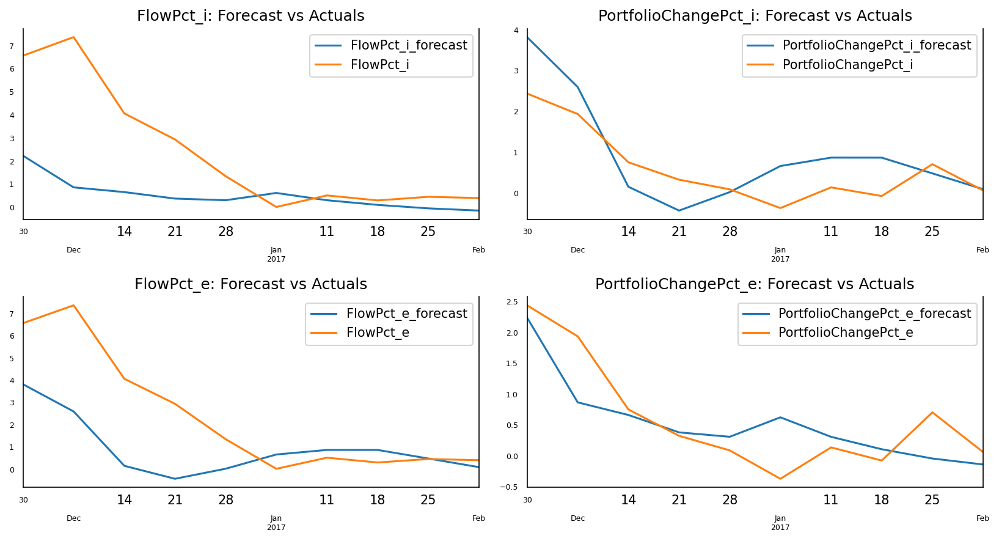

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    ind[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  2.8486
corr :  0.759

Forecast Accuracy of: PortfolioPct_i
rmse :  0.7623
corr :  0.8408

Forecast Accuracy of: FlowPct_e:
rmse :  2.4428
corr :  0.7031

Forecast Accuracy of: PortfolioPct_e
rmse :  0.5372
corr :  0.7865


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,-1,1,-1,-1,-1,-1,-1
2016-12-14,-1,-1,-1,-1,-1,-1,-1,-1
2016-12-21,-1,-1,-1,-1,-1,-1,-1,-1
2016-12-28,-1,-1,-1,-1,0,1,1,0
2017-01-04,-1,-1,-1,-1,1,1,1,1
2017-01-11,1,1,1,1,-1,1,1,-1
2017-01-18,-1,-1,-1,-1,-1,0,0,-1
2017-01-25,1,1,1,1,-1,-1,-1,-1
2017-02-01,0,-1,0,-1,0,-1,-1,0


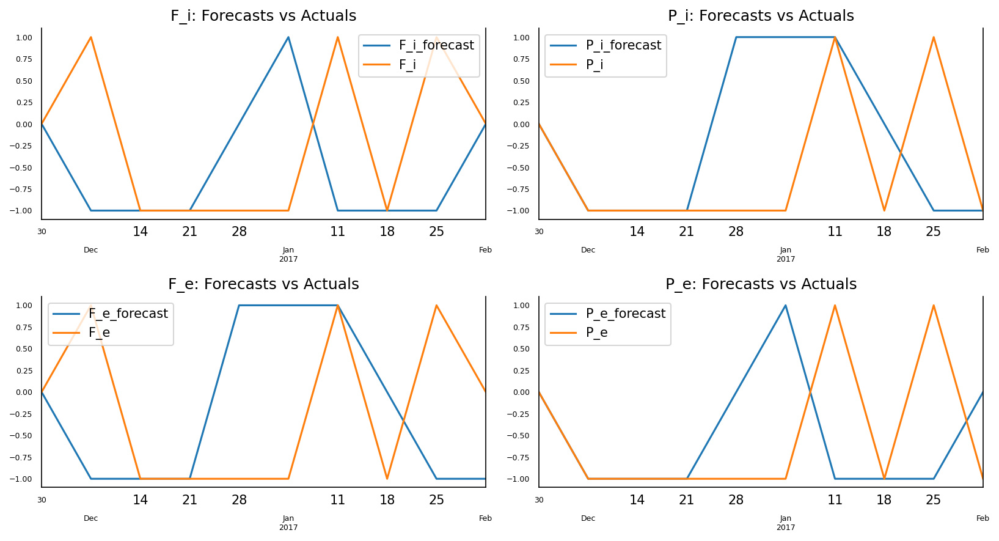

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.5
The accuracy score for PortfolioChangePct_i is 0.6
The accuracy score for FlowPct_e is 0.4
The accuracy score for PortfolioChangePct_e is 0.5


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             3   1   1
 0             0   2   0
 1             3   0   0, P_i_forecast  -1   0   1
P_i                     
-1             4   1   2
 0             0   1   0
 1             1   0   1, F_e_forecast  -1   0   1
F_e                     
-1             2   1   2
 0             1   1   0
 1             2   0   1, P_e_forecast  -1   0   1
P_e                     
-1             4   2   1
 0             0   1   0
 1             2   0   0]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.11928715496370125 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.30227207781379684 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.6366953997887801 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.4323972823334915 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.5
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.4
FlowPct_e v.s. FlowPct_e_forecast: 0.6
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.5


### lcb, Large Capital Blend

In [ ]:
# grangers causation
grangers_causation_matrix(lcb, variables = lcb.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0220,0.0004,0.0266
PortfolioChangePct_i_y,0.0007,1.0000,0.0008,0.0116
FlowPct_e_y,0.0036,0.0316,1.0000,0.0371
PortfolioChangePct_e_y,0.0006,0.0114,0.0006,1.0000


In [ ]:
# adf
adf_test(lcb)

Statistics analysis of Inst MF FlowPct

Statistic Test: -4.493746524725482
p-value: 0.00020181986249377716
 => P-Value = 0.00020181986249377716. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.546334064677085
p-value: 0.00016201594369101284
 => P-Value = 0.00016201594369101284. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -4.401399298509161
p-value: 0.0002951446128524772
 => P-Value = 0.0002951446128524772. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -4.529417367626509
p-value: 0.0001739236955569658
 => P-Value = 0.0001739236955569658. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(lcb, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:

from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(lcb.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.02
PortfolioChangePct_i : 2.0
FlowPct_e : 2.02
PortfolioChangePct_e : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,0.367225,1.244550,0.683118,1.270850,1.127513,0.536090,0.293726,1.153906
2016-12-07,0.313000,0.960825,0.619318,0.963450,0.325321,0.237031,0.143836,0.318069
2016-12-14,0.333236,0.863275,0.612450,0.885725,0.389873,-0.099460,-0.065585,0.394996
2016-12-21,0.363761,0.659225,0.711050,0.657325,0.188195,-0.032218,-0.043099,0.202443
2016-12-28,0.352336,0.559675,0.691475,0.544875,0.110992,0.153455,0.050414,0.122662
2017-01-04,0.335636,0.333675,0.617536,0.297225,0.441482,0.338606,0.131330,0.463198
2017-01-11,-0.021377,0.286525,0.055632,0.218450,0.303789,0.361333,0.142108,0.311489
2017-01-18,0.010498,0.107100,0.083882,0.087700,0.217546,0.317322,0.126840,0.216668
2017-01-25,-0.031052,0.539386,0.018732,0.538855,0.078590,0.227860,0.073888,0.078122
2017-02-01,-0.027884,0.096181,0.012996,0.090112,-0.105741,0.131785,0.027339,-0.109442


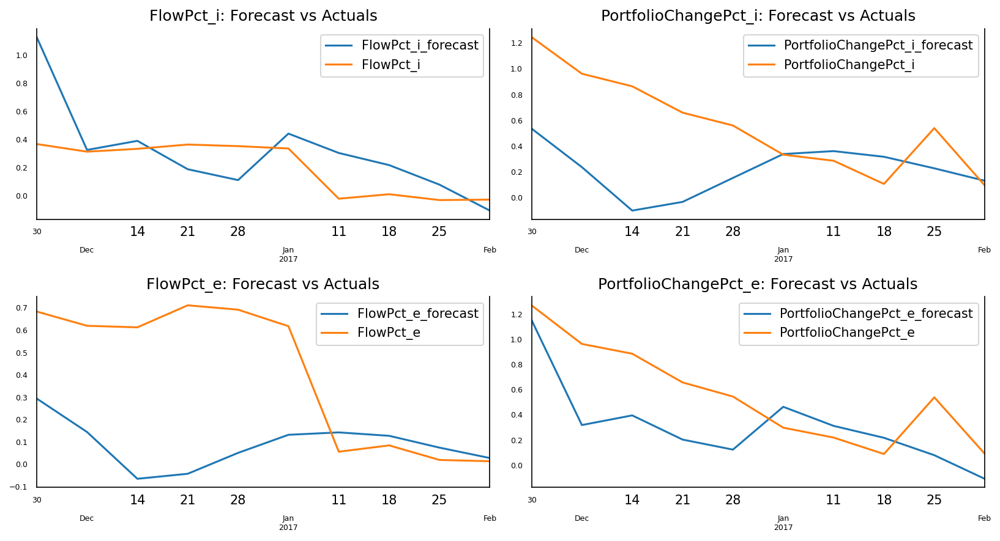

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    lcb[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.2913
corr :  0.5086

Forecast Accuracy of: PortfolioPct_i
rmse :  0.5238
corr :  0.0509

Forecast Accuracy of: FlowPct_e:
rmse :  0.4545
corr :  -0.0218

Forecast Accuracy of: PortfolioPct_e
rmse :  0.3689
corr :  0.6875


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,0,-1,0,-1,-1,-1,-1,-1
2016-12-14,0,0,0,0,0,-1,-1,0
2016-12-21,0,-1,0,-1,-1,0,0,-1
2016-12-28,0,0,0,-1,0,1,0,0
2017-01-04,0,-1,0,-1,1,1,0,1
2017-01-11,-1,0,-1,0,-1,0,0,-1
2017-01-18,0,-1,0,-1,0,0,0,0
2017-01-25,0,1,0,1,-1,0,0,-1
2017-02-01,0,-1,0,-1,-1,0,0,-1


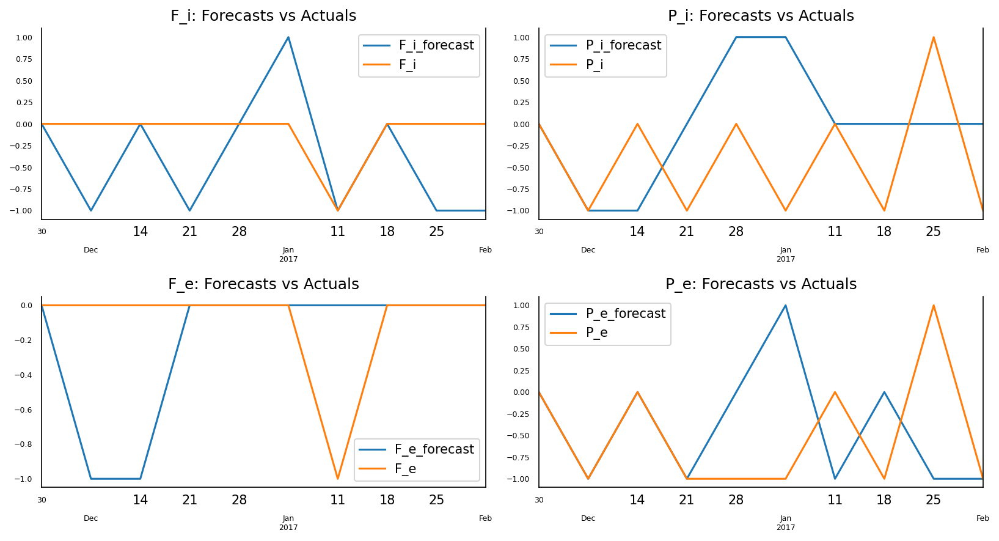

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.5
The accuracy score for PortfolioChangePct_i is 0.3
The accuracy score for FlowPct_e is 0.7
The accuracy score for PortfolioChangePct_e is 0.5


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             1   0   0
 0             4   4   1, P_i_forecast  -1   0   1
P_i                     
-1             1   3   1
 0             1   2   1
 1             0   1   0, F_e_forecast  -1   0
F_e                 
-1             0   1
 0             2   7, P_e_forecast  -1   0   1
P_e                     
-1             3   2   1
 0             1   2   0
 1             1   0   0]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.5737534207374329 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.9339242261172953 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.42919530044034926 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.674706985148295 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.5
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.7
FlowPct_e v.s. FlowPct_e_forecast: 0.3
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.5


### lcg, Large Capital Growth

In [ ]:
# grangers causation
grangers_causation_matrix(lcg, variables = lcg.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0000,0.0021,0.0000
PortfolioChangePct_i_y,0.0003,1.0000,0.0008,0.0003
FlowPct_e_y,0.1028,0.0000,1.0000,0.0000
PortfolioChangePct_e_y,0.0002,0.0001,0.0006,1.0000


In [ ]:
# adf
adf_test(lcg)

Statistics analysis of Inst MF FlowPct

Statistic Test: -4.717335705832241
p-value: 7.806396483949076e-05
 => P-Value = 7.806396483949076e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.664819920907279
p-value: 9.793509685422168e-05
 => P-Value = 9.793509685422168e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -4.973533259700059
p-value: 2.5031477374455312e-05
 => P-Value = 2.5031477374455312e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -4.768437116328266
p-value: 6.247344992521404e-05
 => P-Value = 6.247344992521404e-05. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(lcg, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(lcg.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.04
PortfolioChangePct_i : 2.0
FlowPct_e : 2.03
PortfolioChangePct_e : 2.01


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,-0.066625,0.687575,0.439325,0.730100,0.592774,0.284925,-0.101219,0.604357
2016-12-07,-0.180382,0.318175,0.186400,0.388200,-0.128087,0.314600,-0.056278,-0.088666
2016-12-14,0.017964,0.573425,0.552066,0.678350,0.141842,0.217288,-0.055837,0.145398
2016-12-21,-0.014911,0.294025,0.431316,0.456525,-0.150100,0.037405,-0.118098,-0.122237
2016-12-28,-0.021111,0.343350,0.364091,0.502150,-0.276815,-0.041918,-0.143146,-0.260605
2017-01-04,0.135321,0.314025,0.644616,0.385950,-0.032957,-0.082125,-0.157136,-0.035875
2017-01-11,-0.053260,0.495000,0.150750,0.483450,-0.079430,-0.087255,-0.145110,-0.076558
2017-01-18,-0.168310,0.463025,-0.085225,0.417075,0.012608,0.046611,-0.082098,0.006636
2017-01-25,-0.377824,0.985730,-0.497974,0.928089,0.099097,0.135694,-0.042264,0.101502
2017-02-01,-0.352149,0.635180,-0.354196,0.663974,0.121677,0.186814,-0.009274,0.126976


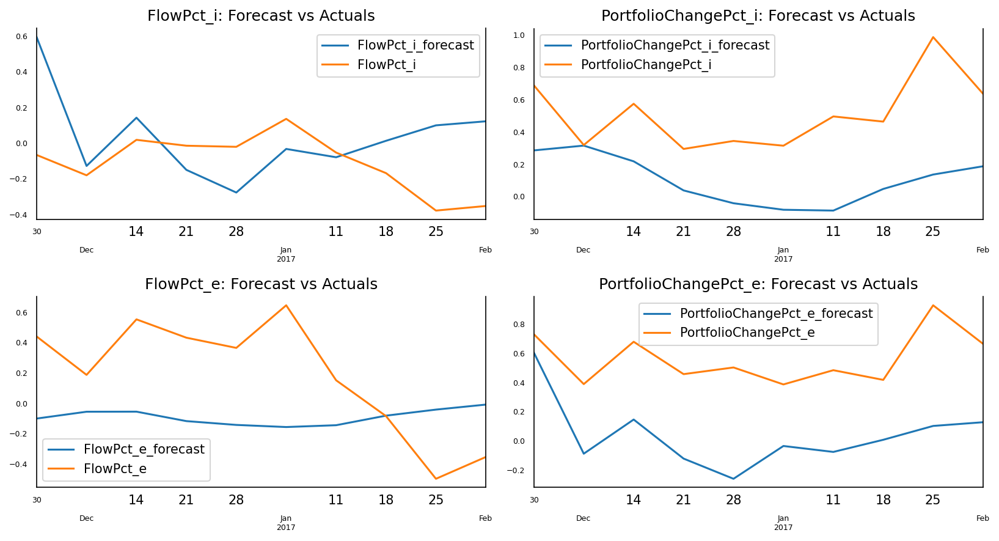

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    lcg[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.3241
corr :  -0.1606

Forecast Accuracy of: PortfolioPct_i
rmse :  0.4578
corr :  0.3605

Forecast Accuracy of: FlowPct_e:
rmse :  0.4834
corr :  -0.6585

Forecast Accuracy of: PortfolioPct_e
rmse :  0.5546
corr :  0.5904


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,-1,-1,-1,-1,-1,0,0,-1
2016-12-14,1,1,1,1,1,0,0,1
2016-12-21,0,-1,-1,-1,-1,-1,0,-1
2016-12-28,0,0,0,0,-1,0,0,-1
2017-01-04,1,0,1,-1,1,0,0,1
2017-01-11,-1,1,-1,0,0,0,0,0
2017-01-18,-1,0,-1,0,0,1,0,0
2017-01-25,-1,1,-1,1,0,0,0,0
2017-02-01,0,-1,1,-1,0,0,0,0


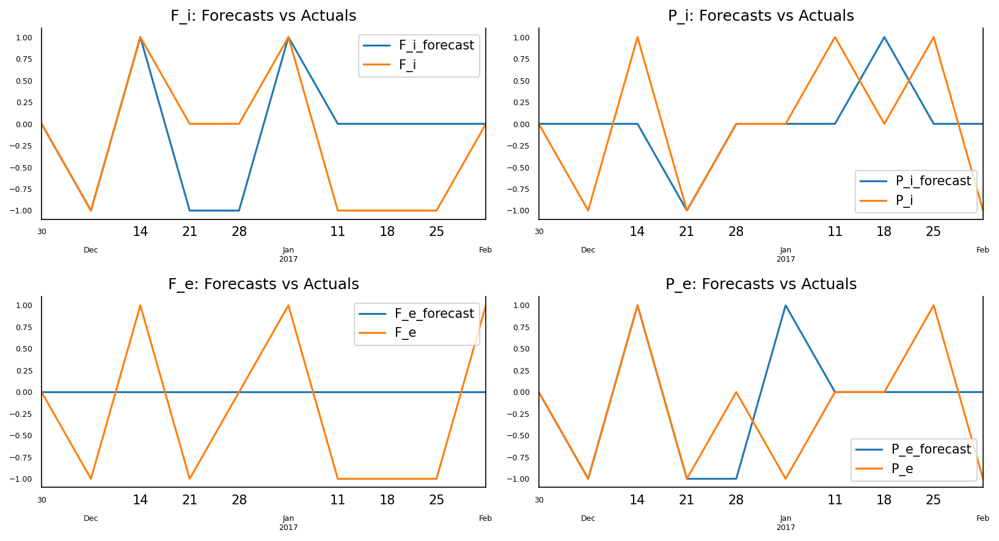

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.5
The accuracy score for PortfolioChangePct_i is 0.4
The accuracy score for FlowPct_e is 0.2
The accuracy score for PortfolioChangePct_e is 0.6


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             1   3   0
 0             2   2   0
 1             0   0   2, P_i_forecast  -1   0   1
P_i                     
-1             1   2   0
 0             0   3   1
 1             0   3   0, F_e_forecast  0
F_e            
-1            5
 0            2
 1            3, P_e_forecast  -1   0   1
P_e                     
-1             2   1   1
 0             1   3   0
 1             0   1   1]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.0305770166275991 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.39761347087777643 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 1.0 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.41740125124146876 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.5
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.6
FlowPct_e v.s. FlowPct_e_forecast: 0.8
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.4


### lcv, Large Capital Value

In [ ]:
# grangers causation
grangers_causation_matrix(lcv, variables = lcv.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0265,0.0059,0.0239
PortfolioChangePct_i_y,0.0830,1.0000,0.0781,0.0509
FlowPct_e_y,0.3166,0.0953,1.0000,0.1153
PortfolioChangePct_e_y,0.0634,0.0724,0.0500,1.0000


In [ ]:
# adf
adf_test(lcv)

Statistics analysis of Inst MF FlowPct

Statistic Test: -4.977024207591116
p-value: 2.4637996603431685e-05
 => P-Value = 2.4637996603431685e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.519164817339605
p-value: 0.00018154124307530233
 => P-Value = 0.00018154124307530233. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -5.984800516367304
p-value: 1.8028061347608932e-07
 => P-Value = 1.8028061347608932e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -4.582644668155931
p-value: 0.00013902574096018224
 => P-Value = 0.00013902574096018224. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(lcv, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(lcv.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.01
PortfolioChangePct_i : 2.0
FlowPct_e : 2.01
PortfolioChangePct_e : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,0.275650,1.666375,0.836625,1.648059,1.390266,0.599458,0.182218,1.351081
2016-12-07,0.234275,1.352350,0.878425,1.362725,0.384955,0.465824,0.138931,0.330154
2016-12-14,0.316373,1.036950,0.901875,1.045950,0.277408,0.135869,0.051038,0.247253
2016-12-21,0.229198,0.849050,0.705975,0.877000,-0.001824,-0.119266,-0.054238,-0.022478
2016-12-28,0.195273,0.627375,0.634725,0.658900,-0.047323,-0.130339,-0.071998,-0.086139
2017-01-04,0.214723,0.318084,0.601700,0.307250,0.354720,-0.082256,-0.050869,0.331153
2017-01-11,0.068488,0.166884,0.247834,0.125050,0.363526,-0.034341,-0.050560,0.324418
2017-01-18,0.065878,-0.090966,0.263409,-0.114775,0.319452,0.029067,-0.032626,0.281382
2017-01-25,0.063278,0.342559,0.350384,0.341804,0.176274,0.115433,0.010092,0.171327
2017-02-01,0.089378,-0.204152,0.356114,-0.215177,0.032167,0.066076,-0.012977,0.030928


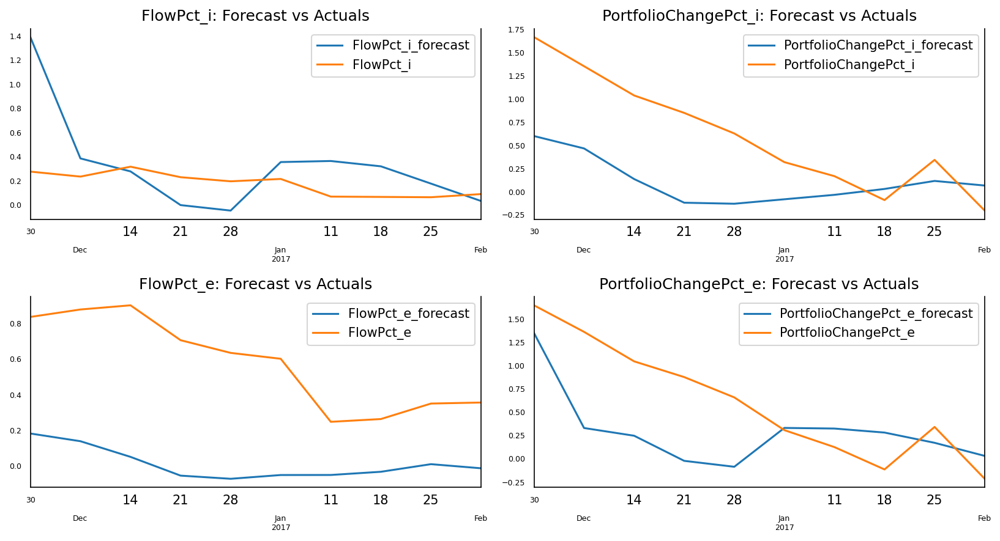

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    lcv[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.3957
corr :  0.3381

Forecast Accuracy of: PortfolioPct_i
rmse :  0.6773
corr :  0.6934

Forecast Accuracy of: FlowPct_e:
rmse :  0.6026
corr :  0.5998

Forecast Accuracy of: PortfolioPct_e
rmse :  0.5868
corr :  0.5465


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,0,-1,0,-1,-1,-1,0,-1
2016-12-14,0,-1,0,-1,-1,-1,0,0
2016-12-21,0,-1,-1,-1,-1,-1,-1,-1
2016-12-28,0,-1,0,-1,0,0,0,0
2017-01-04,0,-1,0,-1,1,0,0,1
2017-01-11,-1,-1,-1,-1,0,0,0,0
2017-01-18,0,-1,0,-1,0,0,0,0
2017-01-25,0,1,0,1,-1,0,0,-1
2017-02-01,0,-1,0,-1,-1,0,0,-1


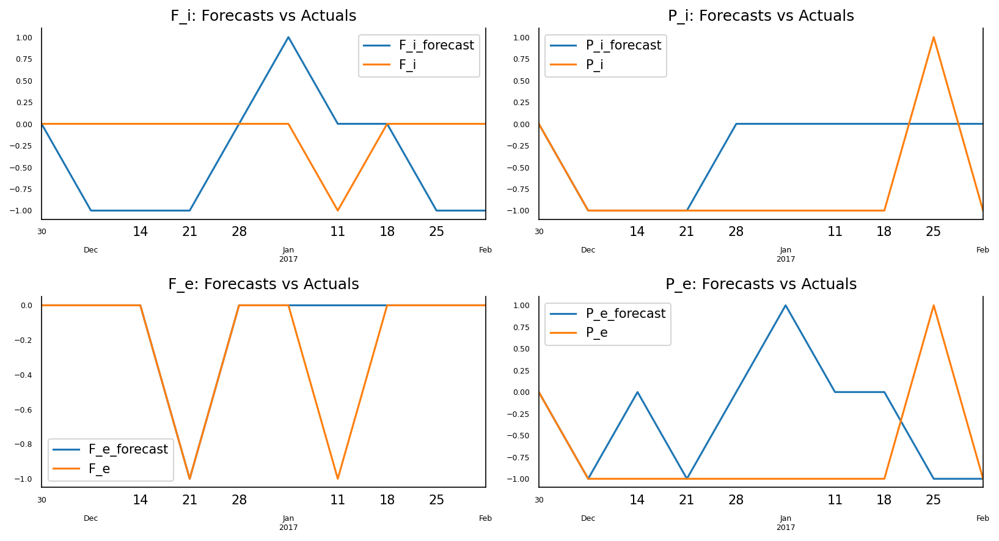

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.3
The accuracy score for PortfolioChangePct_i is 0.4
The accuracy score for FlowPct_e is 0.9
The accuracy score for PortfolioChangePct_e is 0.4


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             0   1   0
 0             5   3   1, P_i_forecast  -1   0
P_i                 
-1             3   5
 0             0   1
 1             0   1, F_e_forecast  -1   0
F_e                 
-1             1   1
 0             0   8, P_e_forecast  -1   0   1
P_e                     
-1             3   4   1
 0             0   1   0
 1             1   0   0]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.4345982085070783 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.5852511043074122 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.42919530044034926 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.6334802462383335 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.7
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.6
FlowPct_e v.s. FlowPct_e_forecast: 0.1
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.6


### mcb, Mid Capital Blend

In [ ]:
# grangers causation
grangers_causation_matrix(mcb, variables = mcb.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0000,0.0030,0.0000
PortfolioChangePct_i_y,0.0029,1.0000,0.0009,0.0049
FlowPct_e_y,0.0185,0.0000,1.0000,0.0000
PortfolioChangePct_e_y,0.0033,0.0038,0.0009,1.0000


In [ ]:
# adf
adf_test(mcb)

Statistics analysis of Inst MF FlowPct

Statistic Test: -4.2586827549004935
p-value: 0.0005233708452105687
 => P-Value = 0.0005233708452105687. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.7051065344981176
p-value: 8.231352024064846e-05
 => P-Value = 8.231352024064846e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -4.589643638210866
p-value: 0.00013496766516430384
 => P-Value = 0.00013496766516430384. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -4.602430596209562
p-value: 0.000127843719285956
 => P-Value = 0.000127843719285956. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(mcb, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(mcb.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.0
PortfolioChangePct_i : 2.0
FlowPct_e : 2.01
PortfolioChangePct_e : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,0.655975,2.099875,0.671050,2.193275,2.029575,0.635258,0.625291,2.119667
2016-12-07,0.874875,1.864175,0.951575,1.934375,0.899391,0.928023,0.811377,0.942978
2016-12-14,0.898089,0.943200,1.234160,0.980500,0.774815,0.761103,0.575113,0.825671
2016-12-21,0.459389,0.574175,0.546610,0.593525,0.245674,0.283222,0.285593,0.298699
2016-12-28,0.435214,0.444400,0.559285,0.452550,0.029295,0.215680,0.230587,0.053727
2017-01-04,0.378639,0.225787,0.475785,0.236159,0.312608,0.023181,0.096026,0.341817
2017-01-11,0.253141,0.337737,0.305259,0.325809,0.369008,0.036479,0.112459,0.404644
2017-01-18,0.413909,0.092112,0.581147,0.094684,0.218150,0.154444,0.175853,0.226896
2017-01-25,0.509584,0.730237,0.680072,0.768584,0.187534,0.237094,0.217759,0.213595
2017-02-01,0.494609,-0.038203,0.637647,-0.059029,0.187621,0.116021,0.127501,0.216048


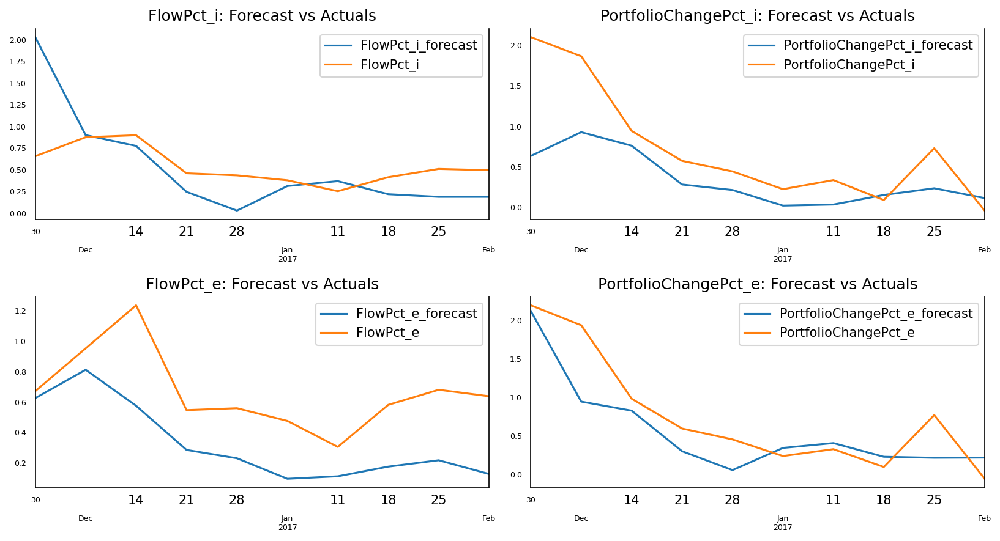

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    mcb[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.4865
corr :  0.5392

Forecast Accuracy of: PortfolioPct_i
rmse :  0.5995
corr :  0.8533

Forecast Accuracy of: FlowPct_e:
rmse :  0.381
corr :  0.7398

Forecast Accuracy of: PortfolioPct_e
rmse :  0.4095
corr :  0.8645


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,-1,1,-1,-1,1,1,-1
2016-12-14,0,-1,1,-1,-1,-1,-1,-1
2016-12-21,-1,-1,-1,-1,-1,-1,-1,-1
2016-12-28,0,-1,0,-1,-1,0,0,-1
2017-01-04,0,-1,0,-1,1,-1,-1,1
2017-01-11,-1,1,-1,0,0,0,0,0
2017-01-18,1,-1,1,-1,-1,1,0,-1
2017-01-25,0,1,0,1,0,0,0,0
2017-02-01,0,-1,0,-1,0,-1,0,0


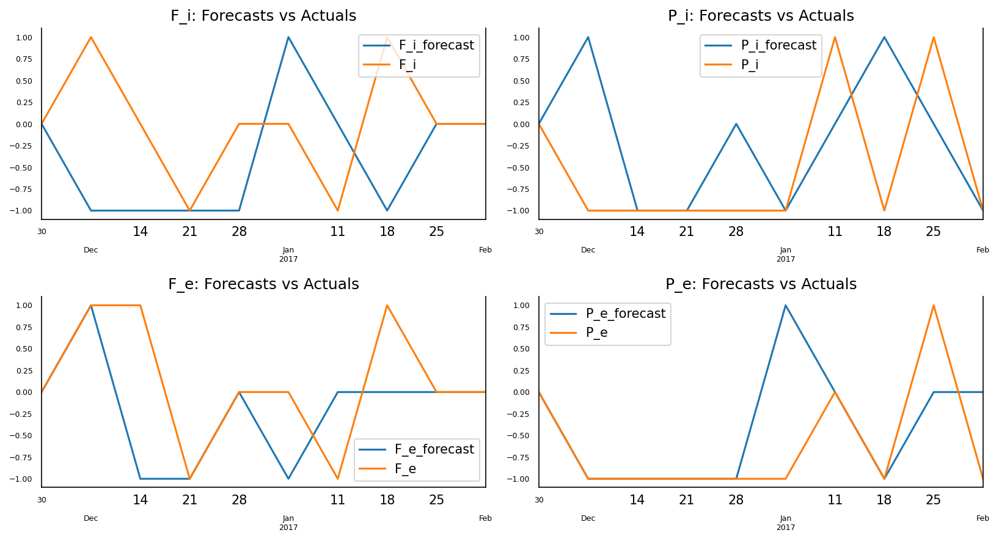

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.4
The accuracy score for PortfolioChangePct_i is 0.5
The accuracy score for FlowPct_e is 0.6
The accuracy score for PortfolioChangePct_e is 0.7


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             1   1   0
 0             2   3   1
 1             2   0   0, P_i_forecast  -1   0   1
P_i                     
-1             4   1   2
 0             0   1   0
 1             0   2   0, F_e_forecast  -1   0   1
F_e                     
-1             1   1   0
 0             1   4   0
 1             1   1   1, P_e_forecast  -1   0   1
P_e                     
-1             5   1   1
 0             0   2   0
 1             0   1   0]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.5578254003710748 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.16934696861523887 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.477878344488724 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.16934696861523899 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.6
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.5
FlowPct_e v.s. FlowPct_e_forecast: 0.4
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.3


### mcg, Mid Capital Growth


In [ ]:
# grangers causation
grangers_causation_matrix(mcg, variables = mcg.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0000,0.1640,0.0000
PortfolioChangePct_i_y,0.0003,1.0000,0.0049,0.0421
FlowPct_e_y,0.0347,0.0000,1.0000,0.0000
PortfolioChangePct_e_y,0.0002,0.0919,0.0036,1.0000


In [ ]:
# adf
adf_test(mcg)

Statistics analysis of Inst MF FlowPct

Statistic Test: -3.966667279778385
p-value: 0.0015954685770610162
 => P-Value = 0.0015954685770610162. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.569867530548909
p-value: 0.00014673599070357386
 => P-Value = 0.00014673599070357386. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -4.407479292854309
p-value: 0.00028791525901829853
 => P-Value = 0.00028791525901829853. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -4.6129544389411326
p-value: 0.00012225123075938939
 => P-Value = 0.00012225123075938939. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(mcg, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(mcg.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.01
PortfolioChangePct_i : 2.01
FlowPct_e : 2.0
PortfolioChangePct_e : 2.01


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,-0.015191,1.576625,0.317100,1.578475,1.436071,0.108857,-0.105170,1.422217
2016-12-07,-0.009116,1.186375,0.450050,1.291700,0.678086,0.139569,-0.084034,0.667286
2016-12-14,0.040359,0.531800,0.713963,0.654350,0.544660,0.086945,-0.111923,0.550166
2016-12-21,-0.242144,0.182000,0.237213,0.328550,0.238084,0.075066,-0.104108,0.244555
2016-12-28,-0.336969,0.170475,0.087913,0.325975,0.380686,-0.048834,-0.140752,0.359280
2017-01-04,-0.311569,0.188957,-0.080262,0.255003,0.620298,0.037379,-0.073229,0.621138
2017-01-11,-0.475247,0.424507,-0.448025,0.399628,0.587562,0.083507,-0.047867,0.573806
2017-01-18,-0.262978,0.294357,-0.040175,0.257328,0.619435,0.067742,-0.078534,0.598803
2017-01-25,-0.253853,0.909407,-0.058425,0.900428,0.399316,0.235834,-0.014849,0.411473
2017-02-01,-0.202086,0.278171,0.066866,0.185991,0.299663,0.173550,-0.056999,0.304694


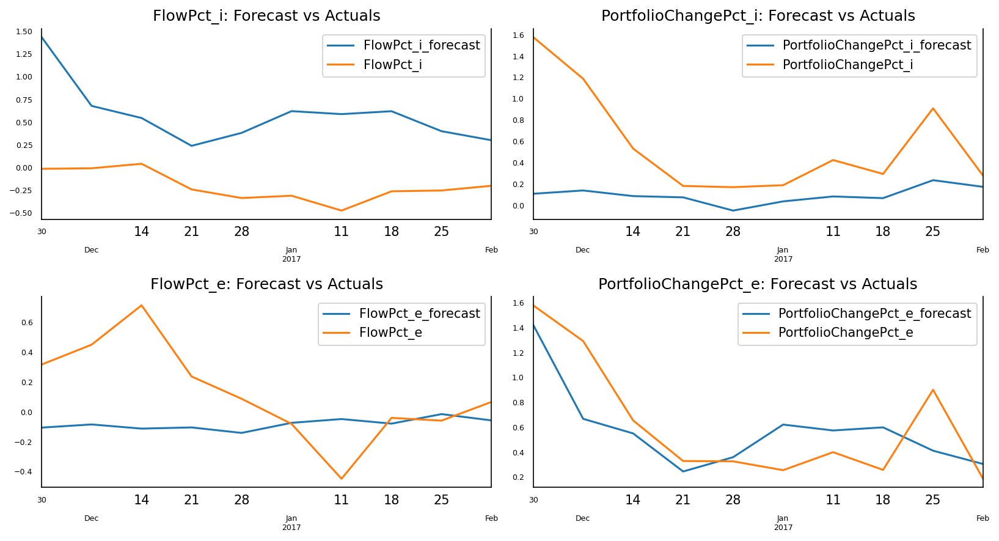

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    mcg[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.8387
corr :  0.4253

Forecast Accuracy of: PortfolioPct_i
rmse :  0.6452
corr :  0.4805

Forecast Accuracy of: FlowPct_e:
rmse :  0.3864
corr :  -0.5591

Forecast Accuracy of: PortfolioPct_e
rmse :  0.311
corr :  0.7463


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,0,-1,1,-1,-1,0,0,-1
2016-12-14,0,-1,1,-1,-1,0,0,-1
2016-12-21,-1,-1,-1,-1,-1,0,0,-1
2016-12-28,0,0,-1,0,1,-1,0,1
2017-01-04,0,0,-1,0,1,0,0,1
2017-01-11,-1,1,-1,1,0,0,0,0
2017-01-18,1,-1,1,-1,0,0,0,0
2017-01-25,0,1,0,1,-1,1,0,-1
2017-02-01,0,-1,1,-1,0,0,0,-1


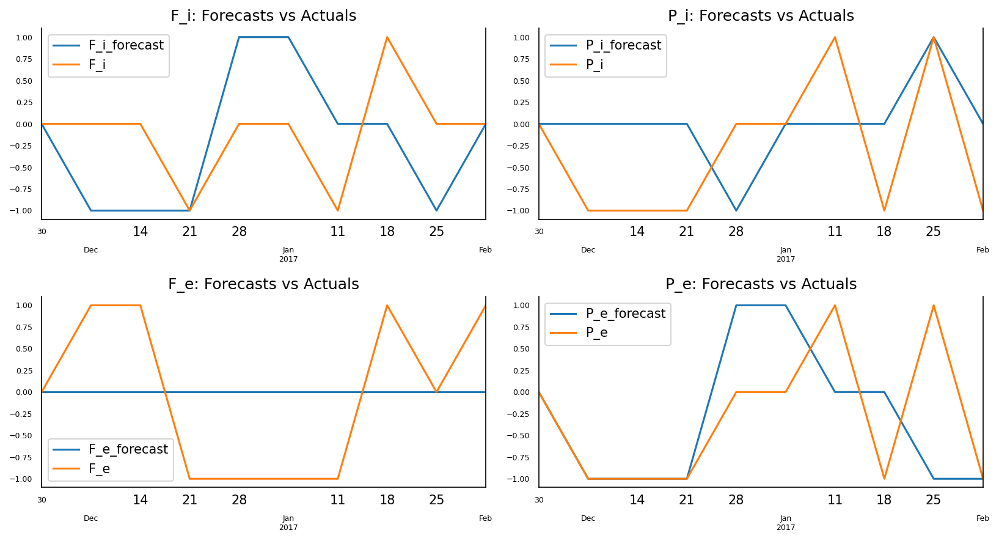

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.3
The accuracy score for PortfolioChangePct_i is 0.3
The accuracy score for FlowPct_e is 0.2
The accuracy score for PortfolioChangePct_e is 0.5


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             1   1   0
 0             3   2   2
 1             0   1   0, P_i_forecast  -1   0   1
P_i                     
-1             0   5   0
 0             1   2   0
 1             0   1   1, F_e_forecast  0
F_e            
-1            4
 0            2
 1            4, P_e_forecast  -1   0   1
P_e                     
-1             4   1   0
 0             0   1   2
 1             1   1   0]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.6446357929354278 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.14264320376301254 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 1.0 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.11122033665440677 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.7
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.7
FlowPct_e v.s. FlowPct_e_forecast: 0.8
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.5


### mcv, Mid Capital Value

In [ ]:
# grangers causation
grangers_causation_matrix(mcv, variables = mcv.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0000,0.1766,0.0000
PortfolioChangePct_i_y,0.0002,1.0000,0.0195,0.0612
FlowPct_e_y,0.0683,0.0000,1.0000,0.0000
PortfolioChangePct_e_y,0.0001,0.0413,0.0159,1.0000


In [ ]:
# adf
adf_test(mcv)

Statistics analysis of Inst MF FlowPct

Statistic Test: -4.399893848774615
p-value: 0.00029696104801087755
 => P-Value = 0.00029696104801087755. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.478346967271542
p-value: 0.00021513468030296017
 => P-Value = 0.00021513468030296017. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -4.876330037621654
p-value: 3.876919377504271e-05
 => P-Value = 3.876919377504271e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -4.5549442779172145
p-value: 0.00015625748650240957
 => P-Value = 0.00015625748650240957. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(mcv, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(mcv.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.0
PortfolioChangePct_i : 1.98
FlowPct_e : 1.99
PortfolioChangePct_e : 1.98


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,0.329700,2.145850,0.891875,2.250675,2.064005,0.629868,0.209099,2.073248
2016-12-07,0.441025,1.908300,1.130250,2.071125,0.701934,0.791586,0.323376,0.630477
2016-12-14,0.254500,0.976750,1.306597,1.098075,0.801398,0.393582,0.181022,0.722101
2016-12-21,0.294306,0.641975,0.789897,0.706100,0.222376,0.175608,0.060899,0.150184
2016-12-28,0.227831,0.419350,0.656747,0.453575,-0.153527,0.147242,0.068869,-0.210566
2017-01-04,0.250756,0.169208,0.740411,0.168029,0.504950,-0.061053,-0.028138,0.471189
2017-01-11,0.415927,0.237333,0.494739,0.240679,0.197164,0.017105,-0.011998,0.165452
2017-01-18,0.263996,0.004083,0.793464,0.022754,0.156850,0.030978,0.003020,0.081677
2017-01-25,0.234262,0.615458,0.753782,0.674379,0.306068,-0.005242,-0.030673,0.219957
2017-02-01,0.207762,-0.130443,0.580793,-0.164886,0.031355,0.006741,-0.037599,-0.056513


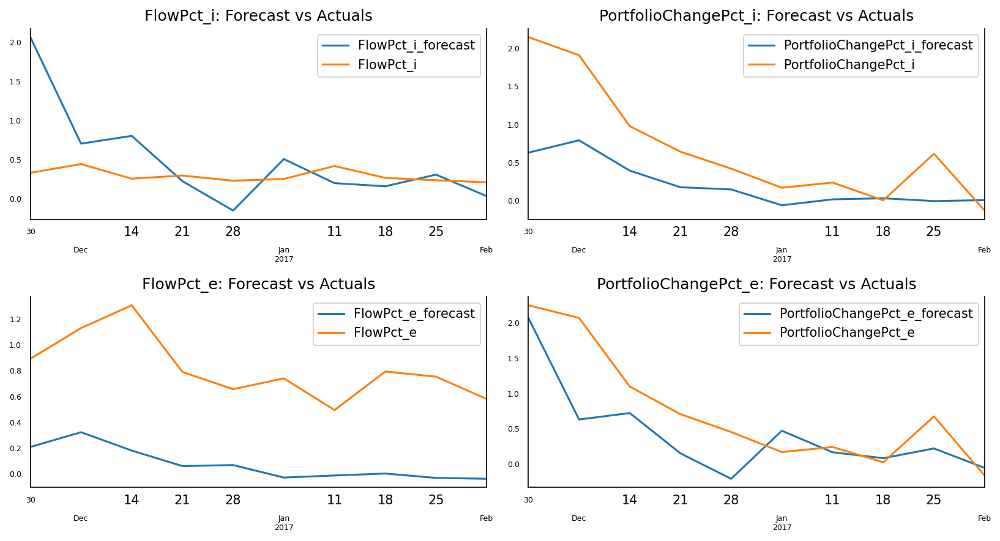

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    mcv[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.6071
corr :  0.3138

Forecast Accuracy of: PortfolioPct_i
rmse :  0.6843
corr :  0.937

Forecast Accuracy of: FlowPct_e:
rmse :  0.757
corr :  0.7756

Forecast Accuracy of: PortfolioPct_e
rmse :  0.576
corr :  0.7979


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,-1,1,-1,-1,1,1,-1
2016-12-14,-1,-1,1,-1,0,-1,-1,0
2016-12-21,0,-1,-1,-1,-1,-1,-1,-1
2016-12-28,0,-1,-1,-1,-1,0,0,-1
2017-01-04,0,-1,0,-1,1,-1,0,1
2017-01-11,1,0,-1,0,-1,0,0,-1
2017-01-18,-1,-1,1,-1,0,0,0,0
2017-01-25,0,1,0,1,1,0,0,1
2017-02-01,0,-1,-1,-1,-1,0,0,-1


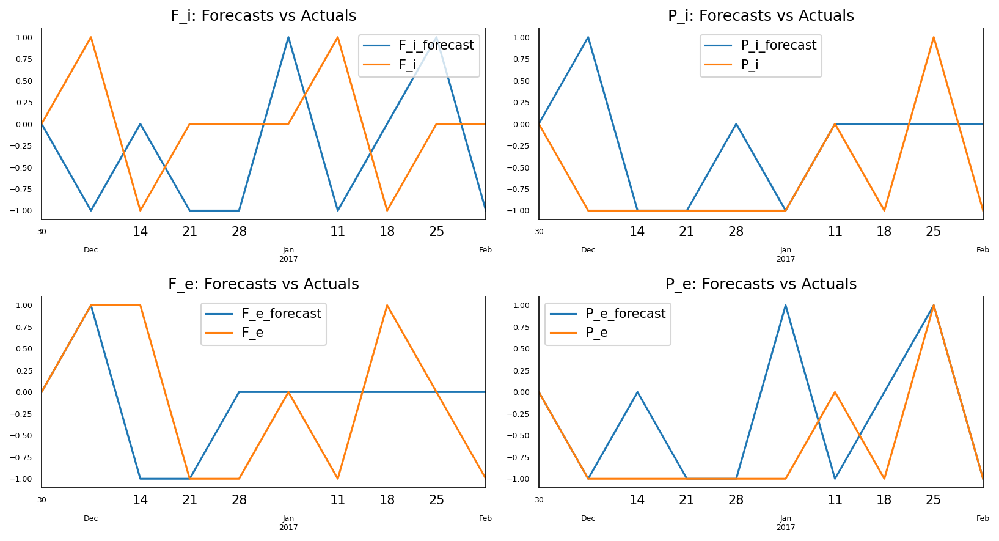

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.1
The accuracy score for PortfolioChangePct_i is 0.5
The accuracy score for FlowPct_e is 0.5
The accuracy score for PortfolioChangePct_e is 0.6


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             0   2   0
 0             3   1   2
 1             2   0   0, P_i_forecast  -1   0   1
P_i                     
-1             3   3   1
 0             0   2   0
 1             0   1   0, F_e_forecast  -1   0   1
F_e                     
-1             1   3   0
 0             0   3   0
 1             1   1   1, P_e_forecast  -1   0   1
P_e                     
-1             4   2   1
 0             1   1   0
 1             0   0   1]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.10928433235369701 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.582009659930027 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.37625892079966433 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.30227207781379684 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.9
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.5
FlowPct_e v.s. FlowPct_e_forecast: 0.5
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.4


### rea, Real Estate

In [ ]:
# grangers causation
grangers_causation_matrix(rea, variables = rea.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0850,0.0000,0.0928
PortfolioChangePct_i_y,0.0247,1.0000,0.0101,0.0765
FlowPct_e_y,0.0000,0.1942,1.0000,0.2146
PortfolioChangePct_e_y,0.0280,0.0226,0.0121,1.0000


In [ ]:
# adf
adf_test(rea)

Statistics analysis of Inst MF FlowPct

Statistic Test: -4.522350682213574
p-value: 0.0001791408083731333
 => P-Value = 0.0001791408083731333. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.872870961758521
p-value: 3.937228977992128e-05
 => P-Value = 3.937228977992128e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -5.095628506089736
p-value: 1.4305533306276108e-05
 => P-Value = 1.4305533306276108e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -4.950155199597548
p-value: 2.782695030887147e-05
 => P-Value = 2.782695030887147e-05. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(rea, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(rea.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 1.99
PortfolioChangePct_i : 1.99
FlowPct_e : 2.0
PortfolioChangePct_e : 1.99


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,-0.174050,0.390300,-0.337100,0.484875,-0.333185,-0.482237,-0.285580,-0.394522
2016-12-07,0.015275,0.784925,-0.031600,1.026850,0.227815,-0.047108,-0.079947,0.094294
2016-12-14,-0.263025,0.576300,-0.509400,0.724900,0.651264,-0.071311,-0.134251,0.618771
2016-12-21,-0.094800,0.553550,-0.094325,0.749000,0.657714,0.126223,-0.061575,0.693710
2016-12-28,-0.304850,0.378300,-0.472000,0.521250,0.837712,0.010322,-0.155194,0.781046
2017-01-04,-0.200627,0.607492,-0.243019,0.829691,0.354395,-0.199471,-0.275620,0.343917
2017-01-11,0.129098,0.419842,0.378731,0.599441,0.213992,-0.162489,-0.259337,0.196935
2017-01-18,0.161098,0.550017,0.271181,0.749466,0.330815,-0.151683,-0.207883,0.258324
2017-01-25,0.292948,0.601467,0.546681,0.805566,0.136679,0.077034,-0.081544,0.075636
2017-02-01,0.126683,-0.570826,0.208789,-0.787396,0.199851,0.038514,-0.091422,0.148897


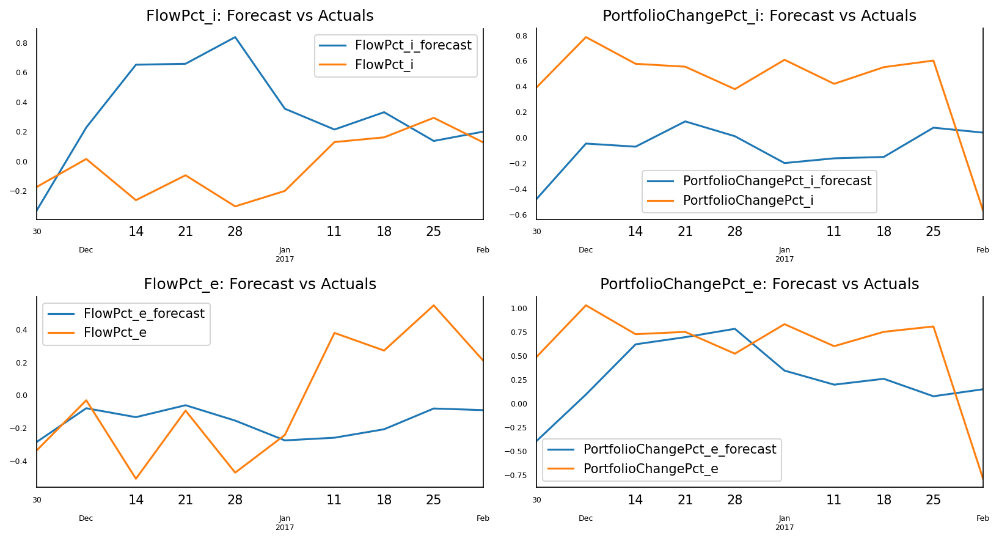

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    rea[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.5614
corr :  -0.4101

Forecast Accuracy of: PortfolioPct_i
rmse :  0.6573
corr :  -0.1207

Forecast Accuracy of: FlowPct_e:
rmse :  0.3701
corr :  0.1691

Forecast Accuracy of: PortfolioPct_e
rmse :  0.6143
corr :  0.136


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,1,1,1,1,1,1,1
2016-12-14,-1,-1,-1,-1,1,0,0,1
2016-12-21,1,0,1,0,0,1,0,0
2016-12-28,-1,-1,-1,-1,1,-1,0,0
2017-01-04,1,1,1,1,-1,-1,-1,-1
2017-01-11,1,-1,1,-1,-1,0,0,-1
2017-01-18,0,1,-1,1,1,0,0,0
2017-01-25,1,0,1,0,-1,1,1,-1
2017-02-01,-1,-1,-1,-1,0,0,0,0


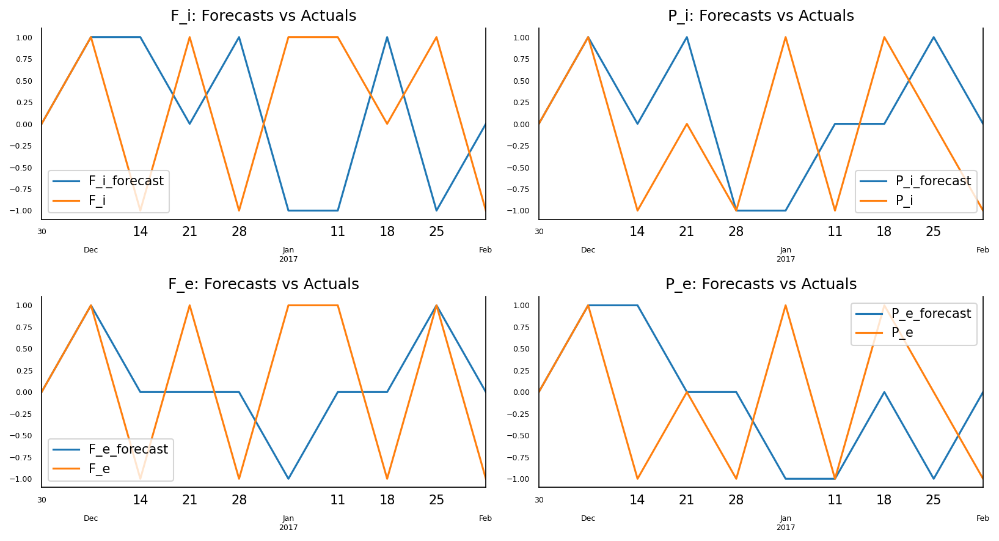

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.2
The accuracy score for PortfolioChangePct_i is 0.3
The accuracy score for FlowPct_e is 0.3
The accuracy score for PortfolioChangePct_e is 0.4


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             0   1   2
 0             0   1   1
 1             3   1   1, P_i_forecast  -1   0   1
P_i                     
-1             1   3   0
 0             0   1   2
 1             1   1   1, F_e_forecast  -1   0   1
F_e                     
-1             0   4   0
 0             0   1   0
 1             1   2   2, P_e_forecast  -1   0   1
P_e                     
-1             1   2   1
 0             1   2   0
 1             1   1   1]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.3392664494460721 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.3662299444568323 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.3687173791533594 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.8604322465948083 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.8
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.7
FlowPct_e v.s. FlowPct_e_forecast: 0.7
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.6


### scb, Small Capital Blend

In [ ]:
# grangers causation
grangers_causation_matrix(scb, variables = scb.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0263,0.0000,0.0323
PortfolioChangePct_i_y,0.0013,1.0000,0.0044,0.0001
FlowPct_e_y,0.0000,0.0518,1.0000,0.0632
PortfolioChangePct_e_y,0.0012,0.0000,0.0046,1.0000


In [ ]:
# adf
adf_test(scb)

Statistics analysis of Inst MF FlowPct

Statistic Test: -5.742352381138443
p-value: 6.233330562934705e-07
 => P-Value = 6.233330562934705e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.979442529047188
p-value: 2.436891912775773e-05
 => P-Value = 2.436891912775773e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -5.363715526223276
p-value: 4.035177777694247e-06
 => P-Value = 4.035177777694247e-06. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -5.055758619401322
p-value: 1.7193727495154043e-05
 => P-Value = 1.7193727495154043e-05. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(scb, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(scb.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.0
PortfolioChangePct_i : 2.0
FlowPct_e : 2.01
PortfolioChangePct_e : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,1.624032,3.205607,2.490762,3.361078,2.932466,0.694635,0.597951,3.071533
2016-12-07,1.179032,2.653657,1.871037,2.755400,1.305653,0.367696,0.324928,1.370915
2016-12-14,0.781500,1.144925,1.186075,1.172325,0.409889,-0.162749,-0.043450,0.422799
2016-12-21,0.518075,0.760700,0.783025,0.761450,-0.319151,-0.452686,-0.291955,-0.358257
2016-12-28,0.528775,0.765275,0.845250,0.783675,-0.458618,0.319645,0.081811,-0.509380
2017-01-04,0.640025,0.437527,0.927800,0.461860,0.021292,0.054072,-0.023143,0.004605
2017-01-11,0.501675,0.298252,0.696800,0.315835,0.115327,-0.129011,-0.096962,0.125821
2017-01-18,0.551025,-0.291223,0.759825,-0.291690,0.134070,0.138590,0.075269,0.170115
2017-01-25,0.361532,0.408752,0.385198,0.405960,-0.056469,0.084381,0.056477,-0.029210
2017-02-01,0.397364,-0.464344,0.396814,-0.517601,-0.216393,0.322918,0.162377,-0.202424


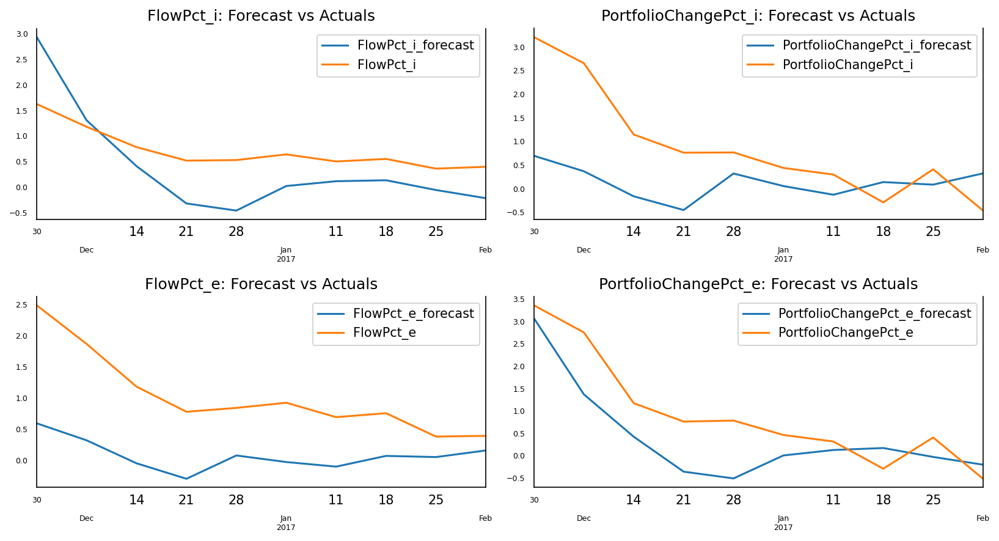

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    scb[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.6928
corr :  0.9622

Forecast Accuracy of: PortfolioPct_i
rmse :  1.2709
corr :  0.4753

Forecast Accuracy of: FlowPct_e:
rmse :  1.0672
corr :  0.7358

Forecast Accuracy of: PortfolioPct_e
rmse :  0.7896
corr :  0.8602


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,-1,-1,-1,-1,-1,-1,-1,-1
2016-12-14,-1,-1,-1,-1,-1,-1,-1,-1
2016-12-21,-1,-1,-1,-1,-1,-1,-1,-1
2016-12-28,0,0,0,0,-1,1,1,-1
2017-01-04,1,-1,0,-1,1,-1,-1,1
2017-01-11,-1,-1,-1,-1,0,-1,0,1
2017-01-18,0,-1,0,-1,0,1,1,0
2017-01-25,-1,1,-1,1,-1,0,0,-1
2017-02-01,0,-1,0,-1,-1,1,1,-1


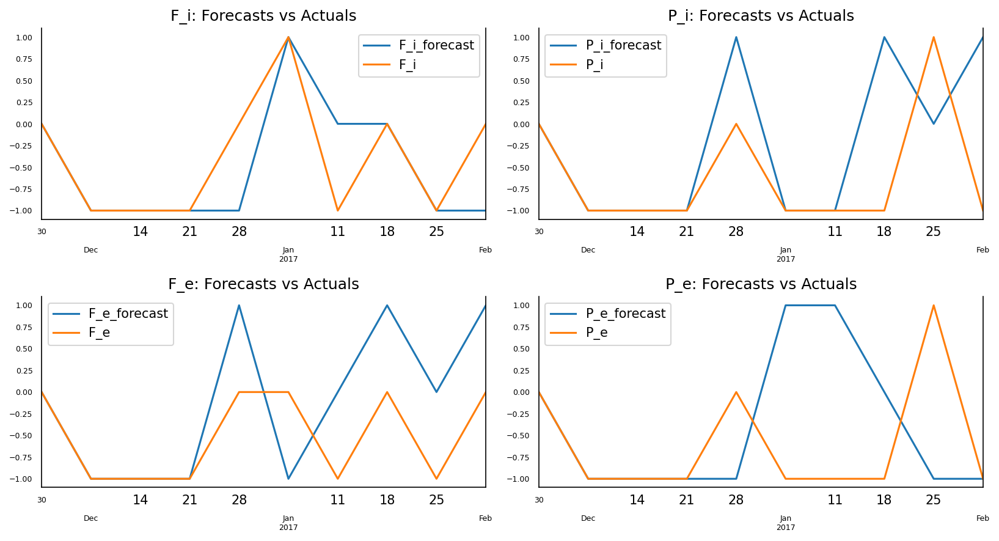

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.7
The accuracy score for PortfolioChangePct_i is 0.6
The accuracy score for FlowPct_e is 0.4
The accuracy score for PortfolioChangePct_e is 0.5


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             4   1   0
 0             2   2   0
 1             0   0   1, P_i_forecast  -1   0   1
P_i                     
-1             5   0   2
 0             0   1   1
 1             0   1   0, F_e_forecast  -1   0   1
F_e                     
-1             3   2   0
 0             1   1   3, P_e_forecast  -1   0   1
P_e                     
-1             4   1   2
 0             1   1   0
 1             1   0   0]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.026564014350016436 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.08403661039456001 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.11455884399268772 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.6660721828143968 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.3
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.4
FlowPct_e v.s. FlowPct_e_forecast: 0.6
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.5


### scg, Small Capital Growth

In [ ]:
# grangers causation
grangers_causation_matrix(scg, variables = scg.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0000,0.0004,0.000
PortfolioChangePct_i_y,0.0036,1.0000,0.0000,0.043
FlowPct_e_y,0.0019,0.0000,1.0000,0.000
PortfolioChangePct_e_y,0.0025,0.0478,0.0000,1.000


In [ ]:
# adf
adf_test(scg)

Statistics analysis of Inst MF FlowPct

Statistic Test: -4.15450286950041
p-value: 0.0007860058064727154
 => P-Value = 0.0007860058064727154. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.831983908733557
p-value: 4.722035206756008e-05
 => P-Value = 4.722035206756008e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -5.6846307557795726
p-value: 8.333827374084942e-07
 => P-Value = 8.333827374084942e-07. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -4.971197232303098
p-value: 2.5298156699185302e-05
 => P-Value = 2.5298156699185302e-05. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(scg, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(scg.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 1.96
PortfolioChangePct_i : 2.0
FlowPct_e : 1.96
PortfolioChangePct_e : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,0.003775,2.565700,0.410000,2.833750,2.594037,0.471062,0.024975,2.762851
2016-12-07,0.198075,1.820250,1.159300,2.121150,1.183520,0.813998,0.152123,1.275063
2016-12-14,0.250325,0.532025,1.314900,0.804000,0.483428,0.532417,0.119587,0.507364
2016-12-21,0.100375,0.094525,0.985575,0.394600,-0.099460,0.414743,0.111717,-0.112574
2016-12-28,-0.009425,0.252525,0.739525,0.488600,-0.272750,0.304314,0.080849,-0.322843
2017-01-04,-0.080525,0.250098,0.351700,0.365037,0.234872,0.301662,0.055648,0.222408
2017-01-11,-0.109275,0.413123,0.175825,0.357462,0.476800,0.238342,0.001181,0.496845
2017-01-18,-0.037175,0.059898,0.378325,-0.066313,0.437276,0.354201,0.045606,0.461924
2017-01-25,0.295303,0.743773,0.781775,0.611162,0.320541,0.262907,0.002421,0.356283
2017-02-01,0.218094,-0.028538,0.761528,-0.200186,0.066978,0.121169,-0.026441,0.085594


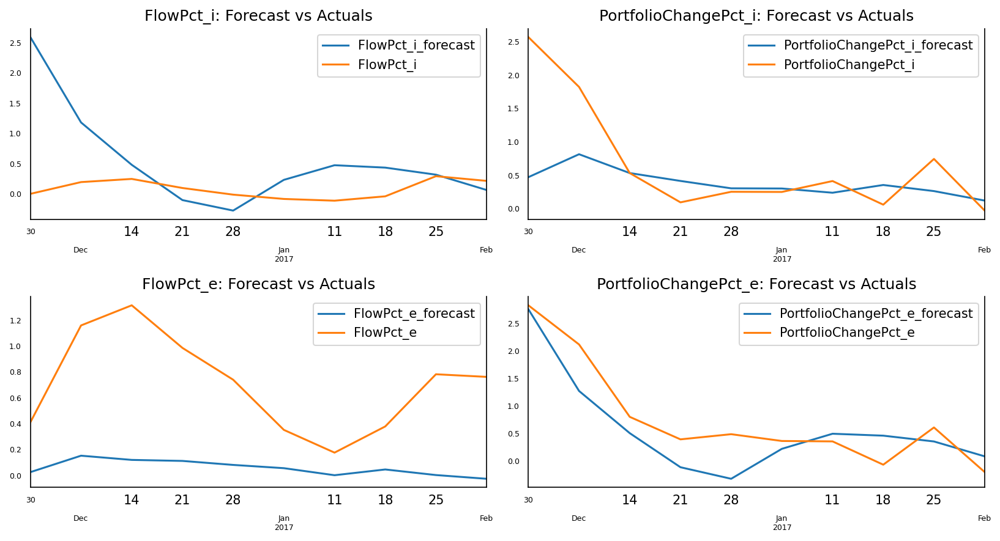

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    scg[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.9239
corr :  -0.064

Forecast Accuracy of: PortfolioPct_i
rmse :  0.7667
corr :  0.6214

Forecast Accuracy of: FlowPct_e:
rmse :  0.7243
corr :  0.6683

Forecast Accuracy of: PortfolioPct_e
rmse :  0.468
corr :  0.8856


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,-1,1,-1,-1,1,1,-1
2016-12-14,0,-1,1,-1,-1,-1,0,-1
2016-12-21,-1,-1,-1,-1,-1,-1,0,-1
2016-12-28,-1,1,-1,0,-1,-1,0,-1
2017-01-04,0,0,-1,-1,1,0,0,1
2017-01-11,0,1,-1,0,1,0,0,1
2017-01-18,0,-1,1,-1,0,1,0,0
2017-01-25,1,1,1,1,-1,0,0,-1
2017-02-01,0,-1,0,-1,-1,-1,0,-1


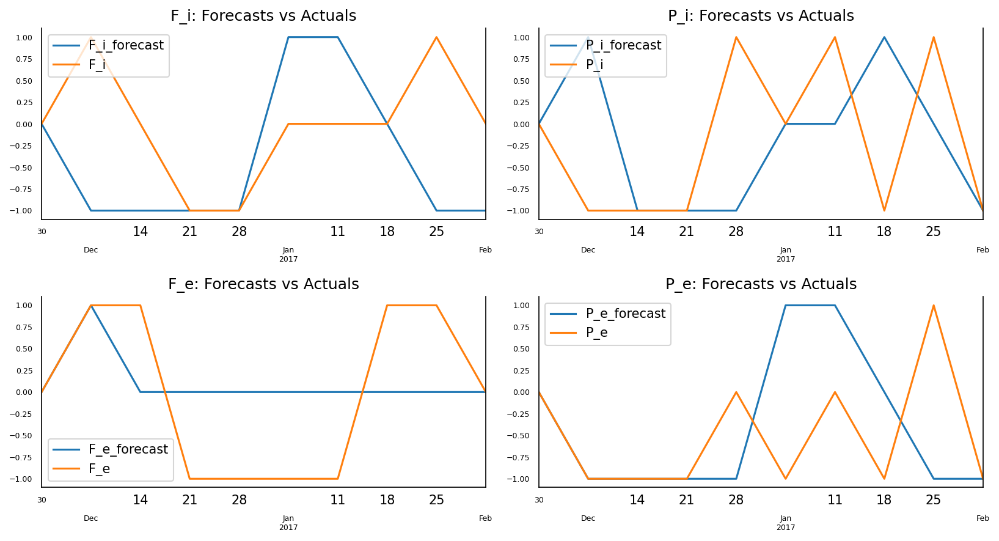

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.4
The accuracy score for PortfolioChangePct_i is 0.5
The accuracy score for FlowPct_e is 0.3
The accuracy score for PortfolioChangePct_e is 0.5


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             2   0   0
 0             2   2   2
 1             2   0   0, P_i_forecast  -1   0   1
P_i                     
-1             3   0   2
 0             0   2   0
 1             1   2   0, F_e_forecast  0  1
F_e               
-1            4  0
 0            2  0
 1            3  1, P_e_forecast  -1   0   1
P_e                     
-1             4   1   1
 0             1   1   1
 1             1   0   0]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.3491858526038865 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.1045806251442166 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.4345982085070783 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.7967633822629767 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.6
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.5
FlowPct_e v.s. FlowPct_e_forecast: 0.7
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.5


### scv, Small Capital Value

In [ ]:
# grangers causation
grangers_causation_matrix(scv, variables = scv.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0000,0.0004,0.0000
PortfolioChangePct_i_y,0.0296,1.0000,0.0247,0.0044
FlowPct_e_y,0.0028,0.0004,1.0000,0.0001
PortfolioChangePct_e_y,0.0173,0.0089,0.0152,1.0000


In [ ]:
# adf
adf_test(scv)

Statistics analysis of Inst MF FlowPct

Statistic Test: -5.2743536693931174
p-value: 6.186755855333749e-06
 => P-Value = 6.186755855333749e-06. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.964202185859216
p-value: 2.6113182200208126e-05
 => P-Value = 2.6113182200208126e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -5.488334958123463
p-value: 2.2039843958247283e-06
 => P-Value = 2.2039843958247283e-06. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -5.068884034770395
p-value: 1.6185752688629182e-05
 => P-Value = 1.6185752688629182e-05. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(scv, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(scv.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.01
PortfolioChangePct_i : 2.0
FlowPct_e : 1.99
PortfolioChangePct_e : 2.0


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,0.474350,3.342091,1.377850,3.482892,3.031334,0.985396,0.282464,3.076130
2016-12-07,0.633050,2.885341,1.698225,3.002242,1.324549,1.165734,0.379836,1.279581
2016-12-14,0.803873,1.323500,2.111632,1.382750,0.610936,0.609475,0.185196,0.551425
2016-12-21,0.547823,0.980750,1.297232,1.042825,0.080675,0.123839,0.006572,0.032396
2016-12-28,0.484598,0.872125,1.136207,0.912925,-0.228582,0.111069,0.001942,-0.285219
2017-01-04,0.298591,0.467344,0.746166,0.480107,0.275263,-0.147528,-0.111771,0.260387
2017-01-11,0.151830,0.325519,0.362622,0.282232,0.284236,0.017075,-0.046894,0.280958
2017-01-18,0.331880,-0.335681,0.935222,-0.377068,0.108951,0.119255,-0.001630,0.083572
2017-01-25,0.448330,0.403244,1.172872,0.297932,0.115122,0.138794,0.018358,0.097252
2017-02-01,0.574762,-0.528589,1.238488,-0.696018,-0.036477,0.182565,0.038031,-0.069936


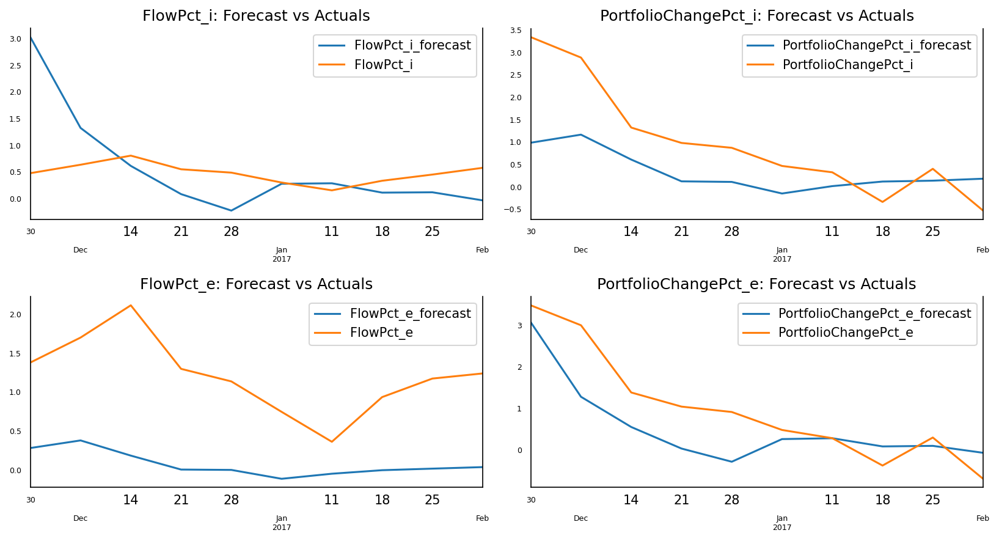

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    scv[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.9128
corr :  0.1554

Forecast Accuracy of: PortfolioPct_i
rmse :  1.0766
corr :  0.8676

Forecast Accuracy of: FlowPct_e:
rmse :  1.1898
corr :  0.7297

Forecast Accuracy of: PortfolioPct_e
rmse :  0.8351
corr :  0.8424


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,-1,1,-1,-1,1,0,-1
2016-12-14,1,-1,1,-1,-1,-1,-1,-1
2016-12-21,-1,-1,-1,-1,-1,-1,-1,-1
2016-12-28,0,-1,-1,-1,-1,0,0,-1
2017-01-04,-1,-1,-1,-1,1,-1,-1,1
2017-01-11,-1,-1,-1,-1,0,1,0,0
2017-01-18,1,-1,1,-1,-1,1,0,-1
2017-01-25,1,1,1,1,0,0,0,0
2017-02-01,1,-1,0,-1,-1,0,0,-1


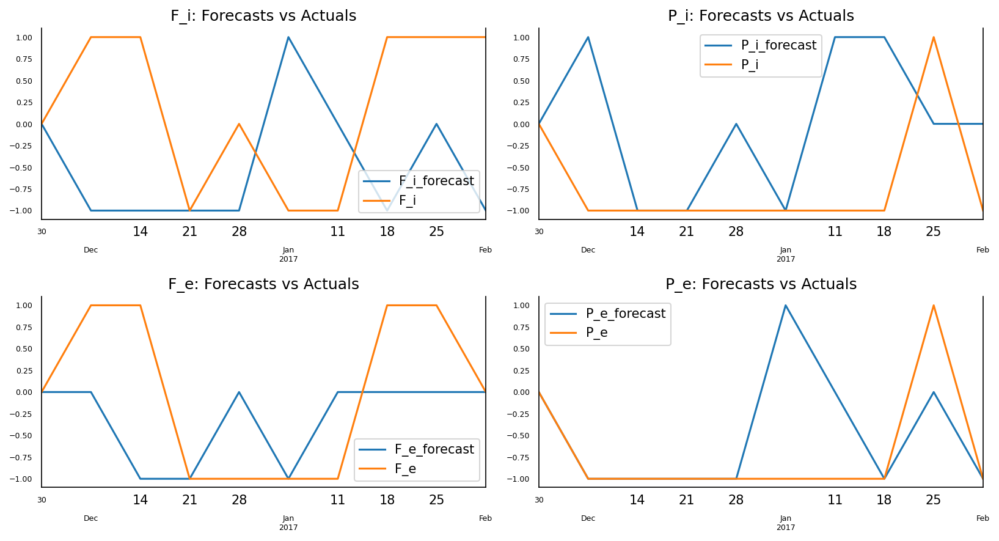

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.2
The accuracy score for PortfolioChangePct_i is 0.4
The accuracy score for FlowPct_e is 0.4
The accuracy score for PortfolioChangePct_e is 0.7


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             1   1   1
 0             1   1   0
 1             4   1   0, P_i_forecast  -1   0   1
P_i                     
-1             3   2   3
 0             0   1   0
 1             0   1   0, F_e_forecast  -1   0
F_e                 
-1             2   2
 0             0   2
 1             1   3, P_e_forecast  -1   0   1
P_e                     
-1             6   1   1
 0             0   1   0
 1             0   1   0]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.477878344488724 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.44089552967916945 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.4345982085070783 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.21194558437271802 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.8
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.6
FlowPct_e v.s. FlowPct_e_forecast: 0.6
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.3


### tec, Technology

In [ ]:
# grangers causation
grangers_causation_matrix(tec, variables = tec.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0000,0.0000,0.0000
PortfolioChangePct_i_y,0.0631,1.0000,0.0146,0.0201
FlowPct_e_y,0.1141,0.0000,1.0000,0.0000
PortfolioChangePct_e_y,0.0596,0.0189,0.0131,1.0000


In [ ]:
# adf
adf_test(tec)

Statistics analysis of Inst MF FlowPct

Statistic Test: -5.206781110711178
p-value: 8.516101150311987e-06
 => P-Value = 8.516101150311987e-06. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.856052674351874
p-value: 4.243543648354702e-05
 => P-Value = 4.243543648354702e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -4.919735394210281
p-value: 3.191737748204025e-05
 => P-Value = 3.191737748204025e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -4.863677458665982
p-value: 4.101935838204192e-05
 => P-Value = 4.101935838204192e-05. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(tec, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
# results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
## Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic
##
## If there is any correlation left in the residuals, then, 
## there is some pattern in the time series that is still left to be explained by the model. 
## In that case, the typical course of action is to either increase the order of the model 
## or induce more predictors into the system or look for a different algorithm to model the time series.
##
## The value of this statistic can vary between 0 and 4. The closer it is to the value 2, 
## then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, 
## and the closer it is to 4 implies negative serial correlation.

from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(tec.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 1.99
PortfolioChangePct_i : 1.99
FlowPct_e : 1.99
PortfolioChangePct_e : 1.99


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,0.715550,0.613825,0.800965,0.630275,0.735556,0.974638,0.878620,0.748319
2016-12-07,0.547925,0.522150,0.624090,0.547875,0.246456,0.872764,0.797887,0.262733
2016-12-14,0.285900,0.761925,0.321275,0.783100,0.352107,0.519839,0.477546,0.353220
2016-12-21,0.269950,0.425525,0.295725,0.445925,0.314220,0.442238,0.410401,0.318198
2016-12-28,0.461775,0.505925,0.498925,0.521125,0.118582,0.268333,0.247529,0.119524
2017-01-04,0.605800,0.314275,0.654025,0.320525,0.185263,0.283912,0.254803,0.181901
2017-01-11,0.589475,0.511075,0.644175,0.500925,0.168215,0.274784,0.246676,0.166427
2017-01-18,0.367352,0.407775,0.409167,0.395700,0.058264,0.107241,0.087543,0.050941
2017-01-25,0.650972,1.195849,0.707837,1.179955,0.099741,0.200042,0.176156,0.095948
2017-02-01,0.650422,0.923228,0.701612,0.905950,0.158214,0.068136,0.056204,0.155157


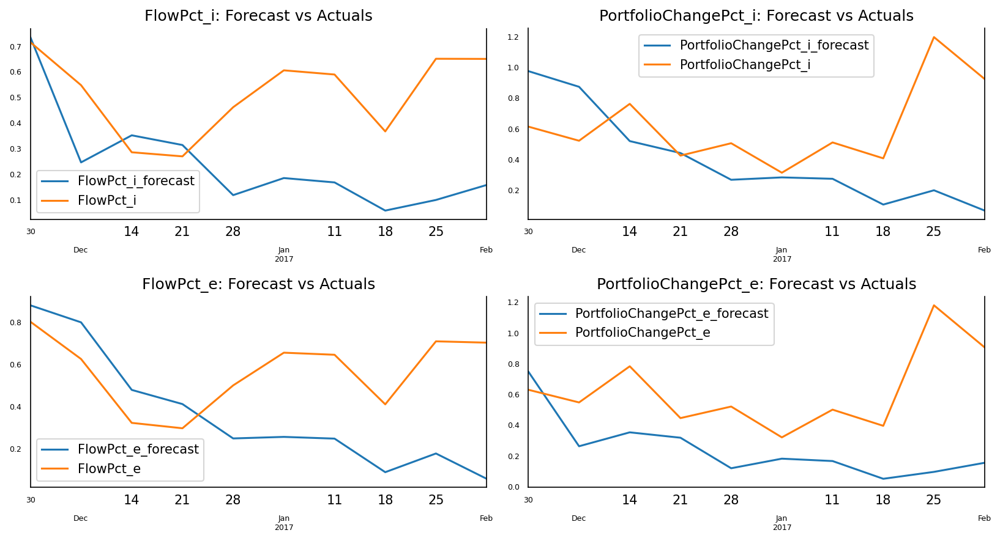

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    tec[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.348
corr :  0.1726

Forecast Accuracy of: PortfolioPct_i
rmse :  0.4731
corr :  -0.1747

Forecast Accuracy of: FlowPct_e:
rmse :  0.3546
corr :  0.1581

Forecast Accuracy of: PortfolioPct_e
rmse :  0.4946
corr :  -0.034


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,-1,0,-1,0,-1,-1,0,-1
2016-12-14,-1,1,-1,1,1,-1,-1,0
2016-12-21,0,-1,0,-1,0,0,0,0
2016-12-28,1,0,1,0,-1,-1,-1,-1
2017-01-04,1,-1,1,-1,0,0,0,0
2017-01-11,0,1,0,1,0,0,0,0
2017-01-18,-1,-1,-1,-1,-1,-1,-1,-1
2017-01-25,1,1,1,1,0,0,0,0
2017-02-01,0,-1,0,-1,0,-1,-1,0


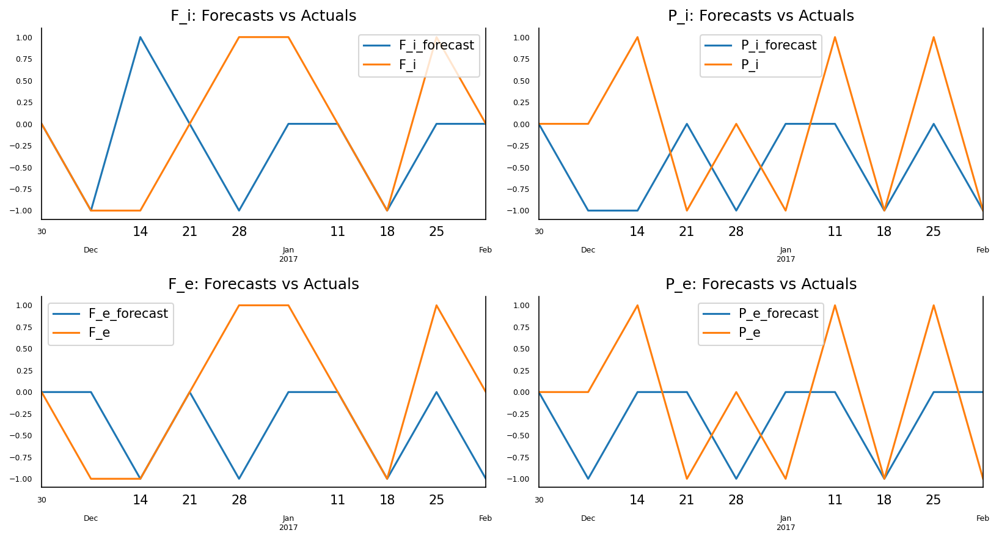

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.6
The accuracy score for PortfolioChangePct_i is 0.3
The accuracy score for FlowPct_e is 0.5
The accuracy score for PortfolioChangePct_e is 0.2


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             2   0   1
 0             0   4   0
 1             1   2   0, P_i_forecast  -1   0
P_i                 
-1             2   2
 0             2   1
 1             1   2, F_e_forecast  -1   0
F_e                 
-1             2   1
 0             1   3
 1             1   2, P_e_forecast  -1   0
P_e                 
-1             1   3
 0             2   1
 1             0   3]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.10006614793682463 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.7165313105737892 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.5169949242489345 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.19652136477670393 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.4
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.7
FlowPct_e v.s. FlowPct_e_forecast: 0.5
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.8


### tel, Telecom

In [ ]:
# grangers causation
grangers_causation_matrix(tel, variables = tel.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.000,0.0,1.000,0.0
PortfolioChangePct_i_y,0.038,1.0,0.038,1.0
FlowPct_e_y,1.000,0.0,1.000,0.0
PortfolioChangePct_e_y,0.038,1.0,0.038,1.0


In [ ]:
# adf
adf_test(tel)

Statistics analysis of Inst MF FlowPct

Statistic Test: -4.99779408768741
p-value: 2.2417334885342465e-05
 => P-Value = 2.2417334885342465e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -4.65353630453063
p-value: 0.00010279529952683395
 => P-Value = 0.00010279529952683395. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -4.99779408768741
p-value: 2.2417334885342465e-05
 => P-Value = 2.2417334885342465e-05. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -4.65353630453063
p-value: 0.00010279529952683395
 => P-Value = 0.00010279529952683395. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(tel, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(tel.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.01
PortfolioChangePct_i : 1.99
FlowPct_e : 2.01
PortfolioChangePct_e : 1.99


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,-1.518525,1.882700,-1.518525,1.882700,1.637037,-1.632628,-1.632628,1.637037
2016-12-07,-0.394000,1.843875,-0.394000,1.843875,0.419020,-1.023662,-1.023662,0.419020
2016-12-14,-0.012775,1.721100,-0.012775,1.721100,0.809262,-0.681917,-0.681917,0.809262
2016-12-21,0.837500,1.430025,0.837500,1.430025,0.062114,0.034841,0.034841,0.062114
2016-12-28,1.523525,1.873000,1.523525,1.873000,-0.313104,0.116467,0.116467,-0.313104
2017-01-04,2.968491,1.656345,2.968491,1.656345,0.215915,0.277293,0.277293,0.215915
2017-01-11,3.933241,1.099339,3.933241,1.099339,-0.042094,0.211963,0.211963,-0.042094
2017-01-18,3.802041,0.358614,3.802041,0.358614,-0.081296,0.030102,0.030102,-0.081296
2017-01-25,2.621216,0.022339,2.621216,0.022339,0.140163,0.092778,0.092778,0.140163
2017-02-01,-0.233720,-1.279281,-0.233720,-1.279281,-0.015468,-0.124465,-0.124465,-0.015468


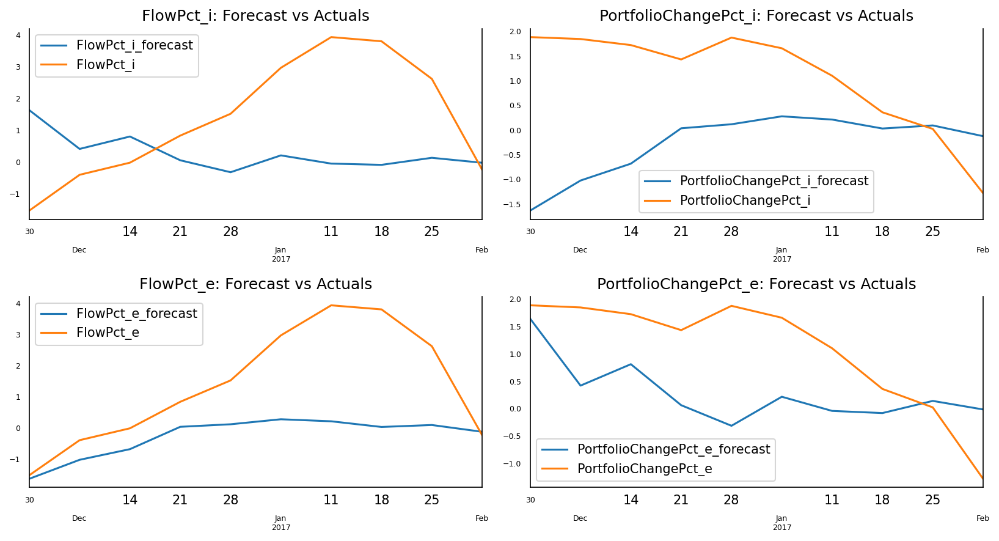

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    tel[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  2.4481
corr :  -0.6552

Forecast Accuracy of: PortfolioPct_i
rmse :  1.8847
corr :  -0.3573

Forecast Accuracy of: FlowPct_e:
rmse :  2.1261
corr :  0.8073

Forecast Accuracy of: PortfolioPct_e
rmse :  1.2147
corr :  0.3833


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launche

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,1,0,1,0,-1,1,1,-1
2016-12-14,1,-1,1,-1,1,1,1,1
2016-12-21,1,-1,1,-1,-1,1,1,-1
2016-12-28,1,1,1,1,-1,0,0,-1
2017-01-04,1,-1,1,-1,1,1,1,1
2017-01-11,1,-1,1,-1,-1,0,0,-1
2017-01-18,-1,-1,-1,-1,0,-1,-1,0
2017-01-25,-1,-1,-1,-1,1,0,0,1
2017-02-01,-1,-1,-1,-1,-1,-1,-1,-1


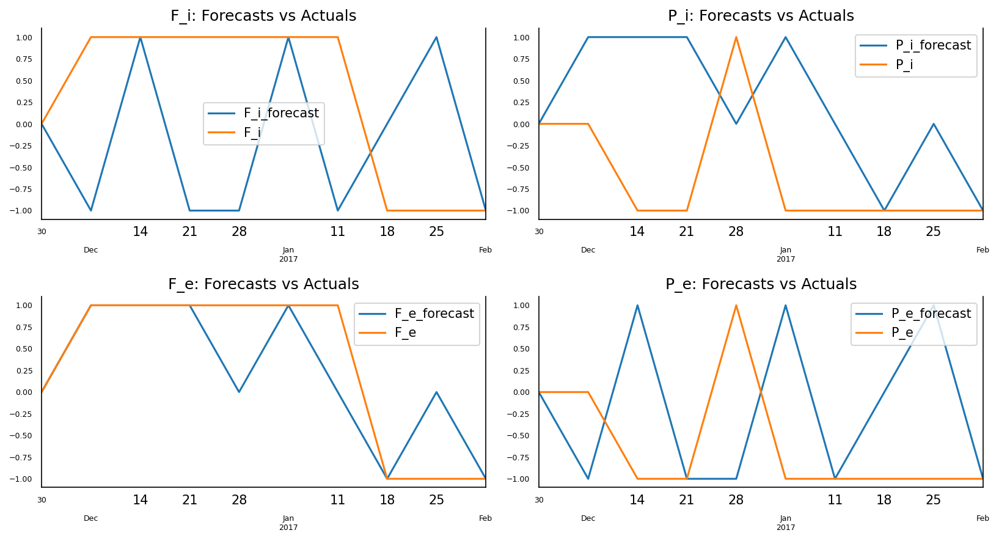

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.4
The accuracy score for PortfolioChangePct_i is 0.3
The accuracy score for FlowPct_e is 0.7
The accuracy score for PortfolioChangePct_e is 0.4


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             1   1   1
 0             0   1   0
 1             4   0   2, P_i_forecast  -1   0   1
P_i                     
-1             2   2   3
 0             0   1   1
 1             0   1   0, F_e_forecast  -1   0   1
F_e                     
-1             2   1   0
 0             0   1   0
 1             0   2   4, P_e_forecast  -1   0   1
P_e                     
-1             3   1   3
 0             1   1   0
 1             1   0   0]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.1991482734714558 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.6446357929354279 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.08010324359488151 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.5459439747510074 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.6
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.7
FlowPct_e v.s. FlowPct_e_forecast: 0.3
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.6


### uti, Utilities

In [ ]:
# grangers causation
grangers_causation_matrix(uti, variables = uti.columns)

,FlowPct_i_x,PortfolioChangePct_i_x,FlowPct_e_x,PortfolioChangePct_e_x
FlowPct_i_y,1.0000,0.0250,0.0013,0.0016
PortfolioChangePct_i_y,0.7874,1.0000,0.8663,0.0176
FlowPct_e_y,0.0018,0.1106,1.0000,0.0199
PortfolioChangePct_e_y,0.5535,0.0057,0.5640,1.0000


In [ ]:
# adf
adf_test(uti)

Statistics analysis of Inst MF FlowPct

Statistic Test: -5.580660186357123
p-value: 1.3990713141761005e-06
 => P-Value = 1.3990713141761005e-06. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of Inst MF PortfolioChangePct

Statistic Test: -5.3652010505342735
p-value: 4.006431247280683e-06
 => P-Value = 4.006431247280683e-06. Rejecting Null Hypothesis.
 => Series is Stationary.

Statistics analysis of ETF FlowPct

Statistic Test: -5.592019477867449
p-value: 1.3225045018133117e-06
 => P-Value = 1.3225045018133117e-06. Rejecting Null Hypothesis.
 => Series is Stationary.

----------------------------------------
Statistics analysis of ETF PortfolioChangePct

Statistic Test: -5.886691647969971
p-value: 2.990044608949251e-07
 => P-Value = 2.990044608949251e-07. Rejecting Null Hypothesis.
 => Series is Stationary.


In [ ]:
# split data
split(uti, 10)

In [ ]:
## use lag 10
forecasting_model = VAR(train)
results = forecasting_model.fit(10)
#results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-WED will be used.
  % freq, ValueWarning)


In [ ]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(results.resid)

for col, val in zip(uti.columns, out):
    print(col, ':', round(val, 2))

FlowPct_i : 2.0
PortfolioChangePct_i : 2.01
FlowPct_e : 2.0
PortfolioChangePct_e : 2.01


In [ ]:
laged_values = train.values[-10:]
forecast = pd.DataFrame(results.forecast(y= laged_values, steps=10), index = test.index, columns= ['FlowPct_e_forecast', 'FlowPct_i_forecast','PortfolioChangePct_i_forecast','PortfolioChangePct_e_forecast'])

In [ ]:
test["FlowPct_i_forecast"] = forecast["FlowPct_i_forecast"]
test["PortfolioChangePct_i_forecast"] = forecast["PortfolioChangePct_i_forecast"]
test["FlowPct_e_forecast"] = forecast["FlowPct_e_forecast"]
test["PortfolioChangePct_e_forecast"] = forecast["PortfolioChangePct_e_forecast"]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,FlowPct_i,PortfolioChangePct_i,FlowPct_e,PortfolioChangePct_e,FlowPct_i_forecast,PortfolioChangePct_i_forecast,FlowPct_e_forecast,PortfolioChangePct_e_forecast
2016-11-30,-0.963450,-0.316375,-1.152775,-0.381500,-0.601294,-1.909192,-1.586792,-0.646857
2016-12-07,-0.922275,0.126750,-1.103925,0.158325,-0.658487,-1.243926,-1.137590,-0.593070
2016-12-14,-0.733100,0.785025,-0.874750,0.824075,0.080549,-0.774783,-0.774776,0.117653
2016-12-21,-0.140175,0.945375,-0.132400,0.996525,0.029197,0.022425,-0.158163,0.106938
2016-12-28,-0.296125,0.805950,-0.323175,0.828075,-0.187699,0.415297,0.166845,-0.123982
2017-01-04,0.000827,0.725971,0.037953,0.692077,0.222408,0.331875,0.121861,0.244809
2017-01-11,-0.032598,0.462921,-0.011147,0.374827,0.027850,0.437599,0.186290,0.088041
2017-01-18,-0.472273,0.347396,-0.579872,0.268827,0.037283,0.424314,0.203100,0.110867
2017-01-25,-0.711648,0.261978,-0.899847,0.123438,0.305149,0.490142,0.251010,0.395629
2017-02-01,-1.319594,-0.037618,-1.674668,-0.140789,0.000515,0.485175,0.281845,0.080609


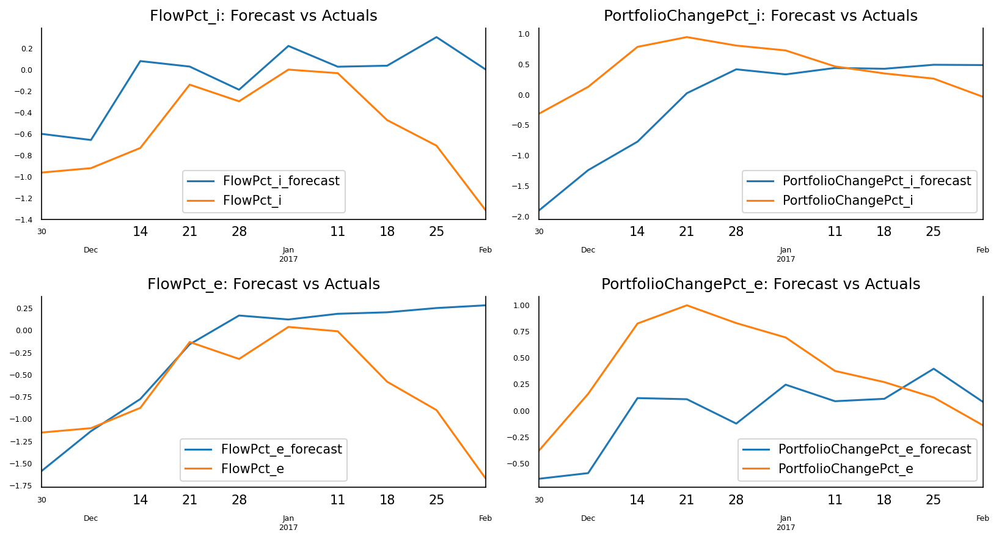

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(test.columns, axes.flatten())):
    test[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    uti[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
print_forecast_accuracy(test)

Forecast Accuracy of: FlowPct_i:
rmse :  0.6318
corr :  0.4111

Forecast Accuracy of: PortfolioPct_i
rmse :  0.9133
corr :  0.4488

Forecast Accuracy of: FlowPct_e:
rmse :  0.7907
corr :  0.3709

Forecast Accuracy of: PortfolioPct_e
rmse :  0.5712
corr :  0.4343


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instea

In [ ]:
direc = test.copy()

direc["F_i"] = 0
direc["P_i"] = 0
direc["F_e"] = 0
direc["P_e"] = 0
direc["F_i_forecast"] = 0
direc["P_i_forecast"] = 0
direc["F_e_forecast"] = 0
direc["P_e_forecast"] = 0

change_binary(direc)
direc = direc.iloc[:, 8:]
direc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-pa

,F_i,P_i,F_e,P_e,F_i_forecast,P_i_forecast,F_e_forecast,P_e_forecast
2016-11-30,0,0,0,0,0,0,0,0
2016-12-07,0,1,0,1,0,1,1,0
2016-12-14,1,1,1,1,1,1,1,1
2016-12-21,1,1,1,1,0,1,1,0
2016-12-28,-1,-1,-1,-1,-1,1,1,-1
2017-01-04,1,0,1,-1,1,0,0,1
2017-01-11,0,-1,0,-1,-1,1,0,-1
2017-01-18,-1,-1,-1,-1,0,0,0,0
2017-01-25,-1,0,-1,-1,1,0,0,1
2017-02-01,-1,-1,-1,-1,-1,0,0,-1


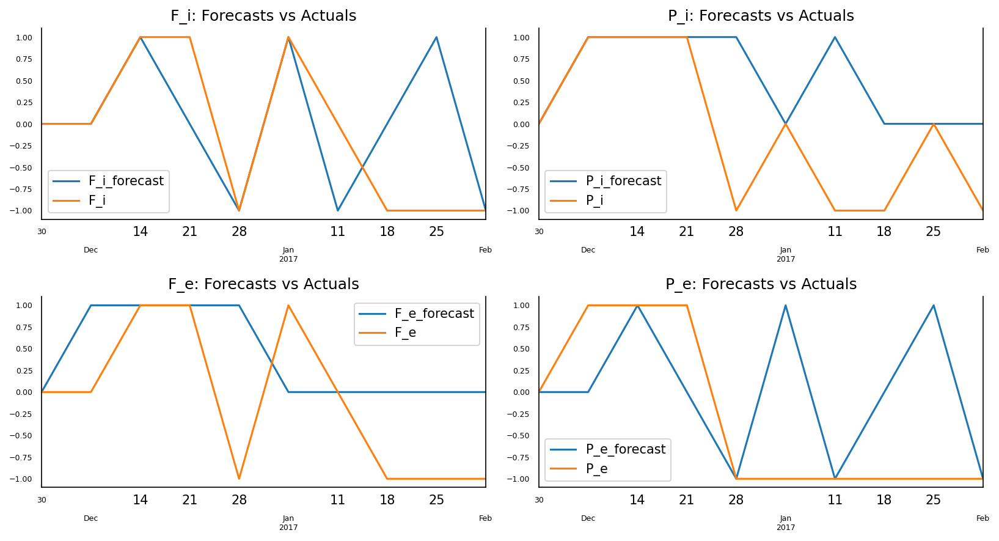

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, dpi=150, figsize=(11,6))
for j, (col,ax) in enumerate(zip(direc.columns, axes.flatten())):
    direc[col + '_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    direc[col][-10:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecasts vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout()

In [ ]:
direc_accuracy(direc)

The accuracy score for FlowPct_i is 0.6
The accuracy score for PortfolioChangePct_i is 0.6
The accuracy score for FlowPct_e is 0.4
The accuracy score for PortfolioChangePct_e is 0.5


In [ ]:
table = crosstab(direc)
chi_sq_test(table)

Contingency table:
[F_i_forecast  -1   0   1
F_i                     
-1             2   1   1
 0             1   2   0
 1             0   1   2, P_i_forecast  0  1
P_i               
-1            2  2
 0            3  0
 1            0  3, F_e_forecast  0  1
F_e               
-1            3  1
 0            2  1
 1            1  2, P_e_forecast  -1   0   1
P_e                     
-1             3   1   2
 0             0   1   0
 1             0   2   1]
FlowPct_i v.s. FlowPct_i_forecast:
p-value: 0.34090379228272955 

PortfolioPct_i v.s. PortfolioPct_i_forecast:
p-value: 0.04978706836786395 

FlowPct_e v.s. FlowPct_e_forecast:
p-value: 0.5169949242489345 

PortfolioPct_e v.s. PortfolioPct_e_forecast:
p-value: 0.3327803405829284 



In [ ]:
hamming_distance(direc)

Hamming distance between actuals and forecasts:

FlowPct_i v.s. FlowPct_i_forecast: 0.4
PortfolioPct_i v.s. PortfolioPct_i_forecast: 0.4
FlowPct_e v.s. FlowPct_e_forecast: 0.6
PortfolioPct_e v.s. PortfolioPct_e_forecast: 0.5
